In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install deepface

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.6/58.6 kB 671.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 kB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.2/80.2 kB 9.4 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.5.0-py2.py3-none-any.whl size=116934 sha256=a437e77b26b92a86d7c5a50919335e19370b5dd52fb54966a6a0a3143004327e
  Stored in directory: /root/.cache/pip/wheels/90/d4/f7/9404e5db0116bd4d43e5666eaa3e70ab53723e1e3ea40c9a95
Successfully built fire


In [ ]:
import os
import tensorflow as tf
from deepface import DeepFace
import numpy as np

# Create a DeepFace model using the specified model
arcface_model = DeepFace.build_model(model_name="ArcFace")

arcface_model.summary()

24-01-07 15:41:31 - Directory /root/.deepface created
24-01-07 15:41:31 - Directory /root/.deepface/weights created
24-01-07 15:41:33 - arcface_weights.h5 will be downloaded to /root/.deepface/weights/arcface_weights.h5


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/arcface_weights.h5
To: /root/.deepface/weights/arcface_weights.h5
100%|██████████| 137M/137M [00:01<00:00, 115MB/s]


Model: "ResNet34"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 112, 112, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 114, 114, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         1728      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import euclidean_distances


# Function to apply sigmoid to a value
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Function to preprocess the face image
def preprocess_face(face_image):
    # Resize the image to the input shape expected by the model (e.g., 112x112)
    face_image = cv2.resize(face_image, (112, 112))
    # Normalize pixel values to be in the range [0, 1]
    face_image = face_image.astype("float32") / 255.0
    # Expand dimensions to create a batch of size 1
    face_image = np.expand_dims(face_image, axis=0)
    return face_image

# Load the model
#loaded_model = keras.models.load_model('/content/drive/MyDrive/thesis_directory/models/arcface_model.h5')

# Function to calculate quality score
def calculate_quality_score(image_rgb):

    # Function to preprocess the face image

    # Number of stochastic forward passes
    num_passes = 4  # Increased the number of passes

    # Create a list to store different embeddings
    embeddings = []

    for _ in range(num_passes):
        # Clone the model to apply different dropout rates
        modified_model = keras.models.clone_model(arcface_model)
        # Add dropout layers with a fixed rate to the cloned model

        for layer in modified_model.layers:
            if isinstance(layer, keras.layers.Dropout):
                layer.rate = layer.rate  # Set a random dropout rate

        # Make predictions with the modified model
        embedding = modified_model.predict(image_rgb)
        # Assuming embedding is a 3D array, reshape it to 2D
        embedding = embedding.flatten()
        embeddings.append(embedding)

    # Convert embeddings to a NumPy array
    embeddings = np.array(embeddings)

    norm = normalize(embeddings, axis=1)
    # Only get the upper triangle of the distance matrix
    eucl_dist = euclidean_distances(norm, norm)[np.triu_indices(num_passes, k=1)]

    # Calculate score as given in the paper
    score = 2*(1/(1+np.exp(np.mean(eucl_dist))))
    alpha = 130.0
    r = 0.88
    # Normalize value based on alpha and r
    q_value = 1 / (1+np.exp(-(alpha * (score - r))))
    # normalisation
    epsilon = 1e-28

    # Normalize the value between 0 and 1
    normalized_value = (q_value - epsilon) / (q_value + epsilon)
    return normalized_value

In [ ]:
import os
import cv2
import pickle
from google.colab.patches import cv2_imshow

def is_image_file(filename):
    # Check if the file extension indicates an image
    image_extensions = [".jpg", ".jpeg", ".png", ".gif", ".bmp", ".tiff"]
    return any(filename.lower().endswith(ext) for ext in image_extensions)

def process_folder(extracted_faces_folder, start_index, end_index, embeddings_dict, batch_size=5):
    # Get the list of image files in the folder and sort them
    image_files = sorted(os.listdir(extracted_faces_folder))

    # Filter the list to include only image files
    image_files = [filename for filename in image_files if is_image_file(filename)]

    # Take a subset of files within the specified start and end indices
    image_files = image_files[start_index:end_index]

    # Iterate over the selected image files in batches
    for batch_start in range(0, len(image_files), batch_size):
        batch_end = min(batch_start + batch_size, len(image_files))
        batch_files = image_files[batch_start:batch_end]

        # Print the start and end indices
        print(f"Processing images {batch_start + start_index + 1} to {batch_end + start_index} out of {end_index - start_index} selected.")

        # Create lists to store embeddings and identities in the current batch
        batch_embeddings = []
        batch_identities = []

        # Iterate over the image files in the current batch
        for i, filename in enumerate(batch_files):
            print(batch_start + start_index + i)
            image_path = os.path.join(extracted_faces_folder, filename)

            # Read the image
            image = cv2.imread(image_path)
            if image is not None:
                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                cv2_imshow(image)
                # Rest of your code for processing the image
            else:
                print(f"Failed to load image: {image_path}")
            processed_image = preprocess_face(image_rgb)
            # Perform face recognition and obtain the embeddings for the current image
            result = DeepFace.represent(image_rgb, model_name='ArcFace', enforce_detection=False)
            embedding = result[0]["embedding"]
            #embedding = arcface_model.predict(processed_image)
            quality_score = calculate_quality_score(processed_image)

            # Extract the person name from the image filename
            person_name = filename.split(".")[0]
            x = person_name.split("_")[0]
            y = person_name.split("_")[1]
            person = x + "_" + y

            print(i, filename, person_name, quality_score)

            # Add the embeddings and identity to the current batch
            batch_embeddings.append((embedding, quality_score))
            batch_identities.append(person)

        # Iterate over the embeddings and identities in the current batch
        for i in range(len(batch_embeddings)):
            embeddings, quality_score = batch_embeddings[i]
            identity = batch_identities[i]

            # Generate the key for the embeddings dictionary (identity)
            key = identity

            # Add the embeddings to the dictionary
            if key in embeddings_dict:
                embeddings_dict[key].append((embeddings, quality_score))
            else:
                embeddings_dict[key] = [(embeddings, quality_score)]

    return embeddings_dict

In [ ]:
import pickle

# Specify the path to your folder
folder_path = '/content/drive/MyDrive/thesis_directory/lfw/detected_faces'
# Specify the path to save the dictionary

#file_path = '/content/drive/MyDrive/thesis_directory/embedd_dict.pkl'
file_path = '/content/drive/MyDrive/thesis_directory/a1_.pkl'

# Load the embeddings dictionary from the file
with open(file_path, 'rb') as file:
    embeddings_dict = pickle.load(file)


# Define the start and end indices for processing
start_index = 11000
end_index = 12000  # Process the first 200 images

# Call the function with the folder path, start and end indices
embeddings_dict = process_folder(folder_path, start_index, end_index, embeddings_dict, batch_size=5)


# Specify the path to save the dictionary
save_path = '/content/drive/MyDrive/Final_thesis/a1_.pkl'
#save_path = '/content/drive/MyDrive/Final_thesis/embedd_dict.pkl'
#save_path = '/content/drive/MyDrive/test_directory/embedd_dict.pkl'
# Save the embeddings_dict to a file using pickle
with open(save_path, 'wb') as file:
    pickle.dump(embeddings_dict, file)

# Print a message to confirm that the dictionary has been saved
print(f"Embeddings dictionary saved to {save_path}")

Processing images 12001 to 12005 out of 1000 selected.
12000


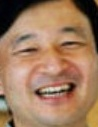

1/1 [==============================] - 2s 2s/step
0 Prince_Naruhito_0002_face_0.jpg Prince_Naruhito_0002_face_0 0.7659764250604674
12001


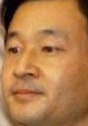

1/1 [==============================] - 2s 2s/step
1 Prince_Naruhito_0003_face_0.jpg Prince_Naruhito_0003_face_0 0.6099150019822128
12002


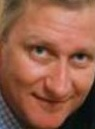

1/1 [==============================] - 1s 1s/step
2 Prince_Philippe_0001_face_0.jpg Prince_Philippe_0001_face_0 -0.05037220091729274
12003


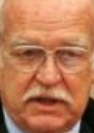

1/1 [==============================] - 1s 1s/step
3 Prince_Rainier_III_0001_face_0.jpg Prince_Rainier_III_0001_face_0 0.26622298555331064
12004


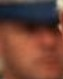

1/1 [==============================] - 1s 1s/step
4 Prince_Rainier_III_0001_face_1.jpg Prince_Rainier_III_0001_face_1 0.5979719712157318
Processing images 12006 to 12010 out of 1000 selected.
12005


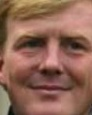

1/1 [==============================] - 1s 1s/step
0 Prince_Willem-Alexander_0001_face_0.jpg Prince_Willem-Alexander_0001_face_0 0.48282715334397885
12006


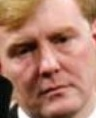

1/1 [==============================] - 1s 1s/step
1 Prince_Willem-Alexander_0002_face_0.jpg Prince_Willem-Alexander_0002_face_0 0.415896407392681
12007


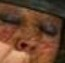

1/1 [==============================] - 1s 1s/step
2 Prince_Willem-Alexander_0002_face_1.jpg Prince_Willem-Alexander_0002_face_1 0.23929439490510454
12008


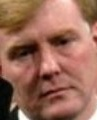

1/1 [==============================] - 1s 1s/step
3 Prince_Willem-Alexander_0003_face_0.jpg Prince_Willem-Alexander_0003_face_0 0.6581287840199647
12009


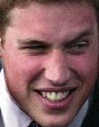

1/1 [==============================] - 1s 1s/step
4 Prince_William_0001_face_0.jpg Prince_William_0001_face_0 0.3146225791406693
Processing images 12011 to 12015 out of 1000 selected.
12010


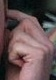

1/1 [==============================] - 1s 1s/step
0 Prince_William_0001_face_1.jpg Prince_William_0001_face_1 0.6507432904620943
12011


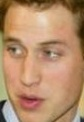

1/1 [==============================] - 2s 2s/step
1 Prince_William_0002_face_0.jpg Prince_William_0002_face_0 0.49533333671256535
12012


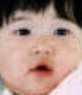

1/1 [==============================] - 2s 2s/step
2 Princess_Aiko_0001_face_0.jpg Princess_Aiko_0001_face_0 0.039871690960870704
12013


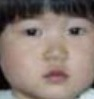

1/1 [==============================] - 2s 2s/step
3 Princess_Aiko_0002_face_0.jpg Princess_Aiko_0002_face_0 0.5315617661694457
12014


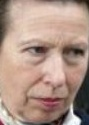

1/1 [==============================] - 1s 1s/step
4 Princess_Anne_0001_face_0.jpg Princess_Anne_0001_face_0 -0.05082862358390897
Processing images 12016 to 12020 out of 1000 selected.
12015


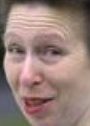

1/1 [==============================] - 1s 1s/step
0 Princess_Anne_0002_face_0.jpg Princess_Anne_0002_face_0 0.6464546635557129
12016


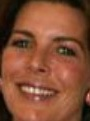

1/1 [==============================] - 1s 1s/step
1 Princess_Caroline_0001_face_0.jpg Princess_Caroline_0001_face_0 0.018124749145768074
12017


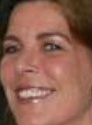

1/1 [==============================] - 1s 1s/step
2 Princess_Caroline_0002_face_0.jpg Princess_Caroline_0002_face_0 0.44321223968376494
12018


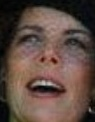

1/1 [==============================] - 1s 1s/step
3 Princess_Caroline_0003_face_0.jpg Princess_Caroline_0003_face_0 0.3475548123415293
12019


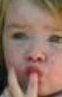

1/1 [==============================] - 1s 1s/step
4 Princess_Caroline_0003_face_1.jpg Princess_Caroline_0003_face_1 0.5794407600031514
Processing images 12021 to 12025 out of 1000 selected.
12020


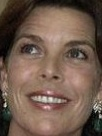

1/1 [==============================] - 2s 2s/step
0 Princess_Caroline_0004_face_0.jpg Princess_Caroline_0004_face_0 0.5206309501581445
12021


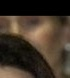

1/1 [==============================] - 1s 1s/step
1 Princess_Caroline_0004_face_1.jpg Princess_Caroline_0004_face_1 0.3739453543314195
12022


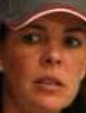

1/1 [==============================] - 2s 2s/step
2 Princess_Caroline_0005_face_0.jpg Princess_Caroline_0005_face_0 0.6362287873423268
12023


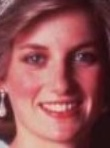

1/1 [==============================] - 2s 2s/step
3 Princess_Diana_0001_face_0.jpg Princess_Diana_0001_face_0 0.6231854227870378
12024


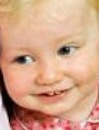

1/1 [==============================] - 1s 1s/step
4 Princess_Elisabeth_0001_face_0.jpg Princess_Elisabeth_0001_face_0 0.5164490891056992
Processing images 12026 to 12030 out of 1000 selected.
12025


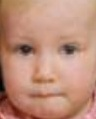

1/1 [==============================] - 1s 1s/step
0 Princess_Elisabeth_0002_face_0.jpg Princess_Elisabeth_0002_face_0 0.6598960344171982
12026


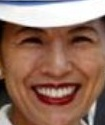

1/1 [==============================] - 1s 1s/step
1 Princess_Hisako_0001_face_0.jpg Princess_Hisako_0001_face_0 0.41535779310021065
12027


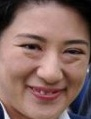

1/1 [==============================] - 1s 1s/step
2 Princess_Masako_0001_face_0.jpg Princess_Masako_0001_face_0 0.1675181476323793
12028


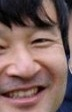

1/1 [==============================] - 1s 1s/step
3 Princess_Masako_0001_face_1.jpg Princess_Masako_0001_face_1 0.501941116336615
12029


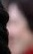

1/1 [==============================] - 1s 1s/step
4 Princess_Masako_0001_face_2.jpg Princess_Masako_0001_face_2 0.45841872169937226
Processing images 12031 to 12035 out of 1000 selected.
12030


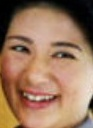

1/1 [==============================] - 1s 1s/step
0 Princess_Masako_0002_face_0.jpg Princess_Masako_0002_face_0 0.7860797313302043
12031


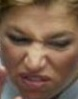

1/1 [==============================] - 1s 1s/step
1 Princess_Maxima_0001_face_0.jpg Princess_Maxima_0001_face_0 0.27842107553514117
12032


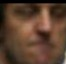

1/1 [==============================] - 2s 2s/step
2 Princess_Maxima_0001_face_1.jpg Princess_Maxima_0001_face_1 0.5352527509206303
12033


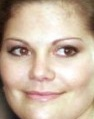

1/1 [==============================] - 2s 2s/step
3 Princess_Victoria_0001_face_0.jpg Princess_Victoria_0001_face_0 0.14953682380103928
12034


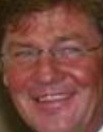

1/1 [==============================] - 2s 2s/step
4 Pringe_Ernst_August_0001_face_0.jpg Pringe_Ernst_August_0001_face_0 0.49342761639836324
Processing images 12036 to 12040 out of 1000 selected.
12035


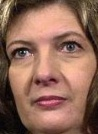

1/1 [==============================] - 1s 1s/step
0 Priscilla_Owen_0001_face_0.jpg Priscilla_Owen_0001_face_0 0.47217462763423634
12036


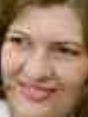

1/1 [==============================] - 1s 1s/step
1 Priscilla_Owen_0002_face_0.jpg Priscilla_Owen_0002_face_0 0.558065789470132
12037


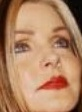

1/1 [==============================] - 1s 1s/step
2 Priscilla_Presley_0001_face_0.jpg Priscilla_Presley_0001_face_0 0.48578844080134254
12038


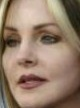

1/1 [==============================] - 1s 1s/step
3 Priscilla_Presley_0002_face_0.jpg Priscilla_Presley_0002_face_0 0.4758411111831173
12039


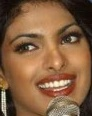

1/1 [==============================] - 1s 1s/step
4 Priyanka_Chopra_0001_face_0.jpg Priyanka_Chopra_0001_face_0 0.22550453107913848
Processing images 12041 to 12045 out of 1000 selected.
12040


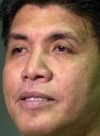

1/1 [==============================] - 1s 1s/step
0 Prospero_Pichay_0001_face_0.jpg Prospero_Pichay_0001_face_0 0.41231114813594677
12041


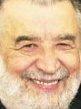

1/1 [==============================] - 1s 1s/step
1 Pupi_Avati_0001_face_0.jpg Pupi_Avati_0001_face_0 0.37692596283223134
12042


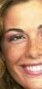

1/1 [==============================] - 2s 2s/step
2 Pupi_Avati_0001_face_1.jpg Pupi_Avati_0001_face_1 0.26985752586097156
12043


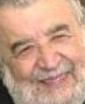

1/1 [==============================] - 2s 2s/step
3 Pupi_Avati_0002_face_0.jpg Pupi_Avati_0002_face_0 0.5196902415821785
12044


1/1 [==============================] - 2s 2s/step
4 Pupi_Avati_0002_face_1.jpg Pupi_Avati_0002_face_1 0.4883291942121674
Processing images 12046 to 12050 out of 1000 selected.
12045


1/1 [==============================] - 1s 1s/step
0 Pupi_Avati_0002_face_2.jpg Pupi_Avati_0002_face_2 0.7766985266677422
12046


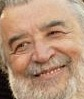

1/1 [==============================] - 1s 1s/step
1 Pupi_Avati_0003_face_0.jpg Pupi_Avati_0003_face_0 0.37345636737700183
12047


1/1 [==============================] - 1s 1s/step
2 Pupi_Avati_0003_face_1.jpg Pupi_Avati_0003_face_1 0.7548623982678426
12048


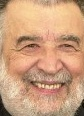

1/1 [==============================] - 1s 1s/step
3 Pupi_Avati_0004_face_0.jpg Pupi_Avati_0004_face_0 0.3026437305488911
12049


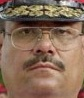

1/1 [==============================] - 1s 1s/step
4 Pyar_Jung_Thapa_0001_face_0.jpg Pyar_Jung_Thapa_0001_face_0 0.40937826285193596
Processing images 12051 to 12055 out of 1000 selected.
12050


1/1 [==============================] - 2s 2s/step
0 Pyar_Jung_Thapa_0001_face_1.jpg Pyar_Jung_Thapa_0001_face_1 0.26746631287858963
12051


1/1 [==============================] - 2s 2s/step
1 Pyar_Jung_Thapa_0001_face_2.jpg Pyar_Jung_Thapa_0001_face_2 0.5993164876601156
12052


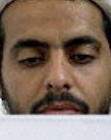

1/1 [==============================] - 1s 1s/step
2 Qais_al-Kazali_0001_face_0.jpg Qais_al-Kazali_0001_face_0 0.6017157274291578
12053


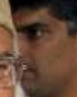

1/1 [==============================] - 1s 1s/step
3 Qazi_Hussain_Ahmed_0001_face_0.jpg Qazi_Hussain_Ahmed_0001_face_0 0.38117100230686174
12054


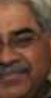

1/1 [==============================] - 1s 1s/step
4 Qazi_Hussain_Ahmed_0001_face_1.jpg Qazi_Hussain_Ahmed_0001_face_1 -0.013948242316499961
Processing images 12056 to 12060 out of 1000 selected.
12055


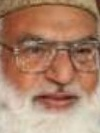

1/1 [==============================] - 2s 2s/step
0 Qazi_Hussain_Ahmed_0001_face_2.jpg Qazi_Hussain_Ahmed_0001_face_2 0.7462991676400325
12056


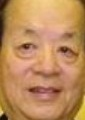

1/1 [==============================] - 1s 1s/step
1 Qian_Qichen_0001_face_0.jpg Qian_Qichen_0001_face_0 0.6712821788170543
12057


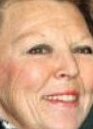

1/1 [==============================] - 2s 2s/step
2 Queen_Beatrix_0001_face_0.jpg Queen_Beatrix_0001_face_0 0.4282846969452194
12058


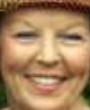

1/1 [==============================] - 2s 2s/step
3 Queen_Beatrix_0002_face_0.jpg Queen_Beatrix_0002_face_0 0.40832598629690015
12059


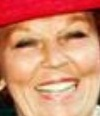

1/1 [==============================] - 2s 2s/step
4 Queen_Beatrix_0003_face_0.jpg Queen_Beatrix_0003_face_0 0.7085138718378581
Processing images 12061 to 12065 out of 1000 selected.
12060


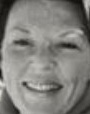

1/1 [==============================] - 1s 1s/step
0 Queen_Beatrix_0004_face_0.jpg Queen_Beatrix_0004_face_0 0.24984591729104205
12061


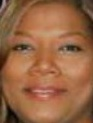

1/1 [==============================] - 1s 1s/step
1 Queen_Latifah_0001_face_0.jpg Queen_Latifah_0001_face_0 0.6855829353727177
12062


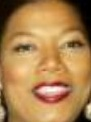

1/1 [==============================] - 1s 1s/step
2 Queen_Latifah_0002_face_0.jpg Queen_Latifah_0002_face_0 0.36336799917480844
12063


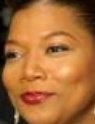

1/1 [==============================] - 1s 1s/step
3 Queen_Latifah_0003_face_0.jpg Queen_Latifah_0003_face_0 0.5324085994535115
12064


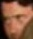

1/1 [==============================] - 1s 1s/step
4 Queen_Latifah_0003_face_1.jpg Queen_Latifah_0003_face_1 0.32445496763142767
Processing images 12066 to 12070 out of 1000 selected.
12065


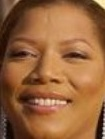

1/1 [==============================] - 1s 1s/step
0 Queen_Latifah_0004_face_0.jpg Queen_Latifah_0004_face_0 -0.05458073095947036
12066


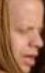

1/1 [==============================] - 2s 2s/step
1 Queen_Latifah_0004_face_1.jpg Queen_Latifah_0004_face_1 0.43866570564051943
12067


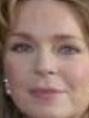

1/1 [==============================] - 2s 2s/step
2 Queen_Noor_0001_face_0.jpg Queen_Noor_0001_face_0 0.45775936837268694
12068


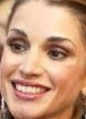

1/1 [==============================] - 2s 2s/step
3 Queen_Rania_0001_face_0.jpg Queen_Rania_0001_face_0 0.3682711032984466
12069


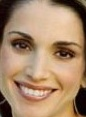

1/1 [==============================] - 1s 1s/step
4 Queen_Rania_0002_face_0.jpg Queen_Rania_0002_face_0 0.21583027995897364
Processing images 12071 to 12075 out of 1000 selected.
12070


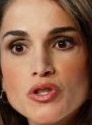

1/1 [==============================] - 1s 1s/step
0 Queen_Rania_0003_face_0.jpg Queen_Rania_0003_face_0 0.31084958545721814
12071


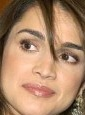

1/1 [==============================] - 1s 1s/step
1 Queen_Rania_0004_face_0.jpg Queen_Rania_0004_face_0 0.060847524194375925
12072


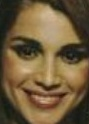

1/1 [==============================] - 1s 1s/step
2 Queen_Rania_0005_face_0.jpg Queen_Rania_0005_face_0 0.6358287070442541
12073


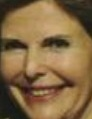

1/1 [==============================] - 1s 1s/step
3 Queen_Silvia_0001_face_0.jpg Queen_Silvia_0001_face_0 0.5395591523193849
12074


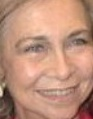

1/1 [==============================] - 2s 2s/step
4 Queen_Sofia_0001_face_0.jpg Queen_Sofia_0001_face_0 0.6249789213922137
Processing images 12076 to 12080 out of 1000 selected.
12075


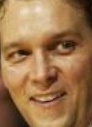

1/1 [==============================] - 2s 2s/step
0 Quin_Snyder_0001_face_0.jpg Quin_Snyder_0001_face_0 0.37749656922496017
12076


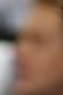

1/1 [==============================] - 2s 2s/step
1 Quin_Snyder_0001_face_1.jpg Quin_Snyder_0001_face_1 0.5333590364873555
12077


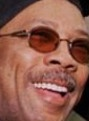

1/1 [==============================] - 2s 2s/step
2 Quincy_Jones_0001_face_0.jpg Quincy_Jones_0001_face_0 0.6504054947468944
12078


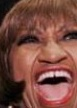

1/1 [==============================] - 1s 1s/step
3 Quincy_Jones_0001_face_1.jpg Quincy_Jones_0001_face_1 0.7211098263743275
12079


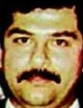

1/1 [==============================] - 1s 1s/step
4 Qusai_Hussein_0001_face_0.jpg Qusai_Hussein_0001_face_0 0.5254417513499372
Processing images 12081 to 12085 out of 1000 selected.
12080


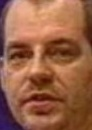

1/1 [==============================] - 1s 1s/step
0 Raaf_Schefter_0001_face_0.jpg Raaf_Schefter_0001_face_0 0.3571080174548489
12081


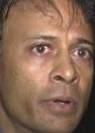

1/1 [==============================] - 1s 1s/step
1 Raag_Singhal_0001_face_0.jpg Raag_Singhal_0001_face_0 0.16843006171673303
12082


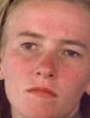

1/1 [==============================] - 2s 2s/step
2 Rachel_Corrie_0001_face_0.jpg Rachel_Corrie_0001_face_0 0.28602959240905507
12083


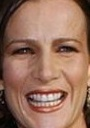

1/1 [==============================] - 2s 2s/step
3 Rachel_Griffiths_0001_face_0.jpg Rachel_Griffiths_0001_face_0 0.47946312668019225
12084


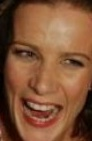

1/1 [==============================] - 2s 2s/step
4 Rachel_Griffiths_0002_face_0.jpg Rachel_Griffiths_0002_face_0 0.35751269083990656
Processing images 12086 to 12090 out of 1000 selected.
12085


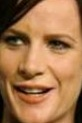

1/1 [==============================] - 1s 1s/step
0 Rachel_Griffiths_0003_face_0.jpg Rachel_Griffiths_0003_face_0 0.08585638890659426
12086


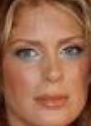

1/1 [==============================] - 2s 2s/step
1 Rachel_Hunter_0001_face_0.jpg Rachel_Hunter_0001_face_0 0.6986154353506986
12087


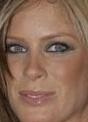

1/1 [==============================] - 1s 1s/step
2 Rachel_Hunter_0002_face_0.jpg Rachel_Hunter_0002_face_0 0.11964694993353715
12088


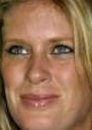

1/1 [==============================] - 1s 1s/step
3 Rachel_Hunter_0003_face_0.jpg Rachel_Hunter_0003_face_0 0.5949493118590077
12089


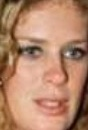

1/1 [==============================] - 1s 1s/step
4 Rachel_Hunter_0004_face_0.jpg Rachel_Hunter_0004_face_0 0.42744622534683546
Processing images 12091 to 12095 out of 1000 selected.
12090


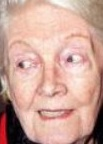

1/1 [==============================] - 1s 1s/step
0 Rachel_Kempson_0001_face_0.jpg Rachel_Kempson_0001_face_0 0.2529102745032862
12091


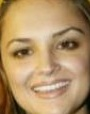

1/1 [==============================] - 1s 1s/step
1 Rachel_Leigh_Cook_0001_face_0.jpg Rachel_Leigh_Cook_0001_face_0 0.2161562809080077
12092


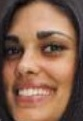

1/1 [==============================] - 1s 1s/step
2 Rachel_Roy_0001_face_0.jpg Rachel_Roy_0001_face_0 0.5551842129957043
12093


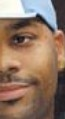

1/1 [==============================] - 2s 2s/step
3 Rachel_Roy_0001_face_1.jpg Rachel_Roy_0001_face_1 -0.008668823370609648
12094


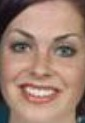

1/1 [==============================] - 1s 1s/step
4 Rachel_Wadsworth_0001_face_0.jpg Rachel_Wadsworth_0001_face_0 0.4926113473044117
Processing images 12096 to 12100 out of 1000 selected.
12095


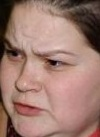

1/1 [==============================] - 2s 2s/step
0 Rachel_Wheatley_0001_face_0.jpg Rachel_Wheatley_0001_face_0 0.42855758833983
12096


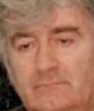

1/1 [==============================] - 2s 2s/step
1 Radovan_Karadzic_0001_face_0.jpg Radovan_Karadzic_0001_face_0 0.10772246060279793
12097


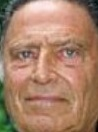

1/1 [==============================] - 2s 2s/step
2 Raf_Vallone_0001_face_0.jpg Raf_Vallone_0001_face_0 0.23834497177038422
12098


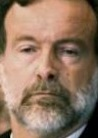

1/1 [==============================] - 1s 1s/step
3 Rafael_Bielsa_0001_face_0.jpg Rafael_Bielsa_0001_face_0 -0.10008894320070512
12099


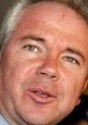

1/1 [==============================] - 1s 1s/step
4 Rafael_Ramirez_0001_face_0.jpg Rafael_Ramirez_0001_face_0 0.2974844274392275
Processing images 12101 to 12105 out of 1000 selected.
12100


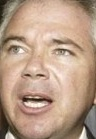

1/1 [==============================] - 1s 1s/step
0 Rafael_Ramirez_0002_face_0.jpg Rafael_Ramirez_0002_face_0 0.38829898722754774
12101


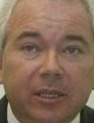

1/1 [==============================] - 1s 1s/step
1 Rafael_Ramirez_0003_face_0.jpg Rafael_Ramirez_0003_face_0 0.6180386980217543
12102


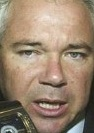

1/1 [==============================] - 1s 1s/step
2 Rafael_Ramirez_0004_face_0.jpg Rafael_Ramirez_0004_face_0 0.41587486788867434
12103


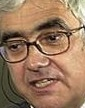

1/1 [==============================] - 1s 1s/step
3 Rafael_Vinoly_0001_face_0.jpg Rafael_Vinoly_0001_face_0 0.5626145642000905
12104


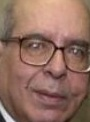

1/1 [==============================] - 1s 1s/step
4 Rafeeuddin_Ahmed_0001_face_0.jpg Rafeeuddin_Ahmed_0001_face_0 0.469957499007645
Processing images 12106 to 12110 out of 1000 selected.
12105


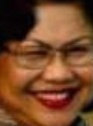

1/1 [==============================] - 2s 2s/step
0 Rafidah_Aziz_0001_face_0.jpg Rafidah_Aziz_0001_face_0 0.547549582968492
12106


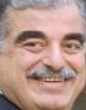

1/1 [==============================] - 2s 2s/step
1 Rafiq_Hariri_0001_face_0.jpg Rafiq_Hariri_0001_face_0 0.4327330132049458
12107


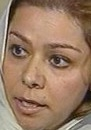

1/1 [==============================] - 2s 2s/step
2 Raghad_Saddam_Hussein_0001_face_0.jpg Raghad_Saddam_Hussein_0001_face_0 0.4010695864741185
12108


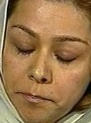

1/1 [==============================] - 2s 2s/step
3 Raghad_Saddam_Hussein_0002_face_0.jpg Raghad_Saddam_Hussein_0002_face_0 0.4276786632042491
12109


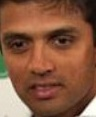

1/1 [==============================] - 2s 2s/step
4 Rahul_Dravid_0001_face_0.jpg Rahul_Dravid_0001_face_0 0.3997713160201635
Processing images 12111 to 12115 out of 1000 selected.
12110


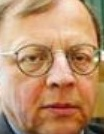

1/1 [==============================] - 1s 1s/step
0 Rainer_Geulen_0001_face_0.jpg Rainer_Geulen_0001_face_0 0.20907979037316413
12111


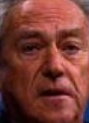

1/1 [==============================] - 1s 1s/step
1 Rainer_Gut_0001_face_0.jpg Rainer_Gut_0001_face_0 0.3001960280229374
12112


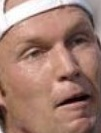

1/1 [==============================] - 1s 1s/step
2 Rainer_Schuettler_0001_face_0.jpg Rainer_Schuettler_0001_face_0 0.7616390570046947
12113


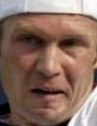

1/1 [==============================] - 3s 3s/step
3 Rainer_Schuettler_0002_face_0.jpg Rainer_Schuettler_0002_face_0 0.38213076263989576
12114


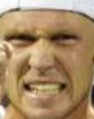

1/1 [==============================] - 2s 2s/step
4 Rainer_Schuettler_0003_face_0.jpg Rainer_Schuettler_0003_face_0 0.7275918551541176
Processing images 12116 to 12120 out of 1000 selected.
12115


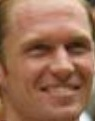

1/1 [==============================] - 2s 2s/step
0 Rainer_Schuettler_0004_face_0.jpg Rainer_Schuettler_0004_face_0 0.30979211584696936
12116


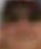

1/1 [==============================] - 1s 1s/step
1 Rainer_Schuettler_0004_face_1.jpg Rainer_Schuettler_0004_face_1 0.04067302275633118
12117


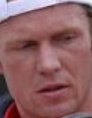

1/1 [==============================] - 2s 2s/step
2 Rainer_Schuettler_0005_face_0.jpg Rainer_Schuettler_0005_face_0 0.25263504969126205
12118


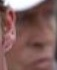

1/1 [==============================] - 1s 1s/step
3 Rainer_Schuettler_0005_face_1.jpg Rainer_Schuettler_0005_face_1 0.3341823284063101
12119


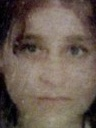

1/1 [==============================] - 1s 1s/step
4 Raja_Ibrahim_0001_face_0.jpg Raja_Ibrahim_0001_face_0 0.11282774221940556
Processing images 12121 to 12125 out of 1000 selected.
12120


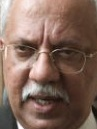

1/1 [==============================] - 1s 1s/step
0 Raja_Qureshi_0001_face_0.jpg Raja_Qureshi_0001_face_0 0.5088354250978467
12121


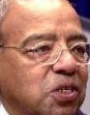

1/1 [==============================] - 2s 2s/step
1 Raja_Ramani_0001_face_0.jpg Raja_Ramani_0001_face_0 0.2496556215107704
12122


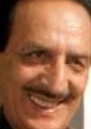

1/1 [==============================] - 1s 1s/step
2 Raja_Zafar-ul-Haq_0001_face_0.jpg Raja_Zafar-ul-Haq_0001_face_0 0.4118847746655116
12123


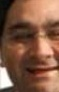

1/1 [==============================] - 1s 1s/step
3 Raja_Zafar-ul-Haq_0001_face_1.jpg Raja_Zafar-ul-Haq_0001_face_1 0.40933886945971076
12124


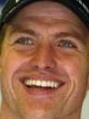

1/1 [==============================] - 2s 2s/step
4 Ralf_Schumacher_0001_face_0.jpg Ralf_Schumacher_0001_face_0 0.20879519994760135
Processing images 12126 to 12130 out of 1000 selected.
12125


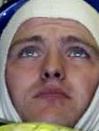

1/1 [==============================] - 2s 2s/step
0 Ralf_Schumacher_0002_face_0.jpg Ralf_Schumacher_0002_face_0 0.4352221313515931
12126


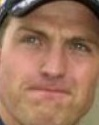

1/1 [==============================] - 2s 2s/step
1 Ralf_Schumacher_0003_face_0.jpg Ralf_Schumacher_0003_face_0 0.21694783358699982
12127


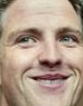

1/1 [==============================] - 2s 2s/step
2 Ralf_Schumacher_0004_face_0.jpg Ralf_Schumacher_0004_face_0 0.5444643122949058
12128


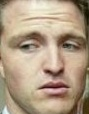

1/1 [==============================] - 1s 1s/step
3 Ralf_Schumacher_0005_face_0.jpg Ralf_Schumacher_0005_face_0 0.28241214190564884
12129


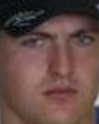

1/1 [==============================] - 1s 1s/step
4 Ralf_Schumacher_0006_face_0.jpg Ralf_Schumacher_0006_face_0 0.46047271381352756
Processing images 12131 to 12135 out of 1000 selected.
12130


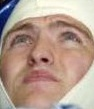

1/1 [==============================] - 1s 1s/step
0 Ralf_Schumacher_0007_face_0.jpg Ralf_Schumacher_0007_face_0 0.28596513302384713
12131


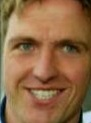

1/1 [==============================] - 1s 1s/step
1 Ralf_Schumacher_0008_face_0.jpg Ralf_Schumacher_0008_face_0 0.04632347269816546
12132


1/1 [==============================] - 1s 1s/step
2 Ralf_Schumacher_0008_face_1.jpg Ralf_Schumacher_0008_face_1 0.7197115251696637
12133


1/1 [==============================] - 1s 1s/step
3 Ralf_Schumacher_0008_face_2.jpg Ralf_Schumacher_0008_face_2 0.4609803591875461
12134


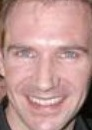

1/1 [==============================] - 1s 1s/step
4 Ralph_Fiennes_0001_face_0.jpg Ralph_Fiennes_0001_face_0 0.5377057790414046
Processing images 12136 to 12140 out of 1000 selected.
12135


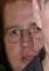

1/1 [==============================] - 2s 2s/step
0 Ralph_Fiennes_0001_face_1.jpg Ralph_Fiennes_0001_face_1 0.5407750800519352
12136


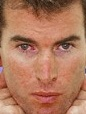

1/1 [==============================] - 2s 2s/step
1 Ralph_Firman_0001_face_0.jpg Ralph_Firman_0001_face_0 0.37817408373083794
12137


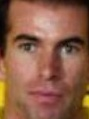

1/1 [==============================] - 2s 2s/step
2 Ralph_Firman_0002_face_0.jpg Ralph_Firman_0002_face_0 0.0851184132658205
12138


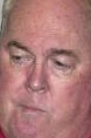

1/1 [==============================] - 2s 2s/step
3 Ralph_Friedgen_0001_face_0.jpg Ralph_Friedgen_0001_face_0 0.375852853371589
12139


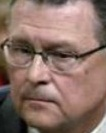

1/1 [==============================] - 1s 1s/step
4 Ralph_Goodale_0001_face_0.jpg Ralph_Goodale_0001_face_0 0.7724258031165648
Processing images 12141 to 12145 out of 1000 selected.
12140


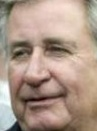

1/1 [==============================] - 1s 1s/step
0 Ralph_Klein_0001_face_0.jpg Ralph_Klein_0001_face_0 0.6702231292480915
12141


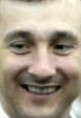

1/1 [==============================] - 1s 1s/step
1 Ralph_Klein_0001_face_1.jpg Ralph_Klein_0001_face_1 0.17307849098224956
12142


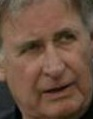

1/1 [==============================] - 1s 1s/step
2 Ralph_Klein_0002_face_0.jpg Ralph_Klein_0002_face_0 0.45669140498822386
12143


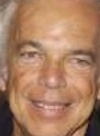

1/1 [==============================] - 1s 1s/step
3 Ralph_Lauren_0001_face_0.jpg Ralph_Lauren_0001_face_0 0.6728299024171751
12144


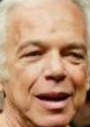

1/1 [==============================] - 2s 2s/step
4 Ralph_Lauren_0002_face_0.jpg Ralph_Lauren_0002_face_0 0.44425323063847677
Processing images 12146 to 12150 out of 1000 selected.
12145


1/1 [==============================] - 2s 2s/step
0 Ralph_Lauren_0002_face_1.jpg Ralph_Lauren_0002_face_1 0.5823329836194422
12146


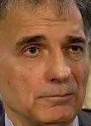

1/1 [==============================] - 2s 2s/step
1 Ralph_Nader_0001_face_0.jpg Ralph_Nader_0001_face_0 0.10095323397239003
12147


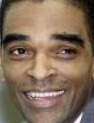

1/1 [==============================] - 2s 2s/step
2 Ralph_Sampson_0001_face_0.jpg Ralph_Sampson_0001_face_0 0.6050536907049501
12148


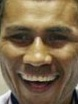

1/1 [==============================] - 2s 2s/step
3 Ramiro_Goben_Reducindo_0001_face_0.jpg Ramiro_Goben_Reducindo_0001_face_0 0.058519990266444895
12149


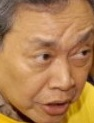

1/1 [==============================] - 1s 1s/step
4 Ramon_Cardenas_0001_face_0.jpg Ramon_Cardenas_0001_face_0 0.5092939885759143
Processing images 12151 to 12155 out of 1000 selected.
12150


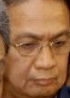

1/1 [==============================] - 1s 1s/step
0 Ramon_Cardenas_0001_face_1.jpg Ramon_Cardenas_0001_face_1 0.333495383035017
12151


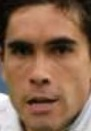

1/1 [==============================] - 1s 1s/step
1 Ramon_Delgado_0001_face_0.jpg Ramon_Delgado_0001_face_0 0.4952793085036836
12152


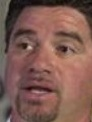

1/1 [==============================] - 1s 1s/step
2 Ramon_Ponce_de_Leon_0001_face_0.jpg Ramon_Ponce_de_Leon_0001_face_0 0.34450044466706714
12153


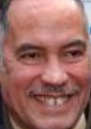

1/1 [==============================] - 1s 1s/step
3 Ramon_Santana_0001_face_0.jpg Ramon_Santana_0001_face_0 0.3585864472088158
12154


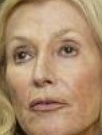

1/1 [==============================] - 1s 1s/step
4 Ramona_Rispton_0001_face_0.jpg Ramona_Rispton_0001_face_0 0.5930755816331067
Processing images 12156 to 12160 out of 1000 selected.
12155


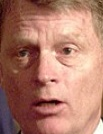

1/1 [==============================] - 2s 2s/step
0 Rand_Beers_0001_face_0.jpg Rand_Beers_0001_face_0 0.15064948780988463
12156


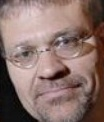

1/1 [==============================] - 3s 3s/step
1 Rand_Miller_0001_face_0.jpg Rand_Miller_0001_face_0 -0.03336847298915573
12157


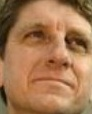

1/1 [==============================] - 2s 2s/step
2 Randall_Terry_0001_face_0.jpg Randall_Terry_0001_face_0 -0.06134040832207641
12158


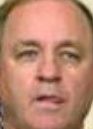

1/1 [==============================] - 1s 1s/step
3 Randall_Tobias_0001_face_0.jpg Randall_Tobias_0001_face_0 0.44682621763318603
12159


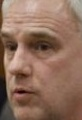

1/1 [==============================] - 1s 1s/step
4 Randy_Brown_0001_face_0.jpg Randy_Brown_0001_face_0 0.2644184959339653
Processing images 12161 to 12165 out of 1000 selected.
12160


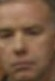

1/1 [==============================] - 1s 1s/step
0 Randy_Brown_0001_face_1.jpg Randy_Brown_0001_face_1 0.5845090357403981
12161


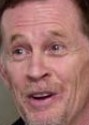

1/1 [==============================] - 1s 1s/step
1 Randy_Dryer_0001_face_0.jpg Randy_Dryer_0001_face_0 0.7013005844456138
12162


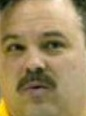

1/1 [==============================] - 1s 1s/step
2 Randy_Ferbey_0001_face_0.jpg Randy_Ferbey_0001_face_0 0.4430996863310198
12163


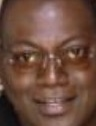

1/1 [==============================] - 1s 1s/step
3 Randy_Jackson_0001_face_0.jpg Randy_Jackson_0001_face_0 0.45699048099463674
12164


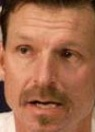

1/1 [==============================] - 1s 1s/step
4 Randy_Johnson_0001_face_0.jpg Randy_Johnson_0001_face_0 0.35429667511253676
Processing images 12166 to 12170 out of 1000 selected.
12165


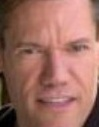

1/1 [==============================] - 2s 2s/step
0 Randy_Travis_0001_face_0.jpg Randy_Travis_0001_face_0 0.2677005724839598
12166


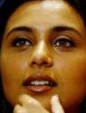

1/1 [==============================] - 2s 2s/step
1 Rani_Mukherjee_0001_face_0.jpg Rani_Mukherjee_0001_face_0 0.43325905943128723
12167


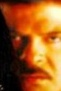

1/1 [==============================] - 2s 2s/step
2 Rani_Mukherjee_0001_face_1.jpg Rani_Mukherjee_0001_face_1 -0.09202338147669367
12168


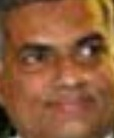

1/1 [==============================] - 1s 1s/step
3 Ranil_Wickremasinghe_0001_face_0.jpg Ranil_Wickremasinghe_0001_face_0 0.35592412622964875
12169


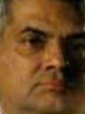

1/1 [==============================] - 1s 1s/step
4 Ranil_Wickremasinghe_0002_face_0.jpg Ranil_Wickremasinghe_0002_face_0 0.3178490724669859
Processing images 12171 to 12175 out of 1000 selected.
12170


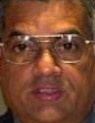

1/1 [==============================] - 1s 1s/step
0 Ranil_Wickremasinghe_0003_face_0.jpg Ranil_Wickremasinghe_0003_face_0 0.6041094567395808
12171


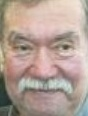

1/1 [==============================] - 1s 1s/step
1 Raoul_Ruiz_0001_face_0.jpg Raoul_Ruiz_0001_face_0 0.39918523076754114
12172


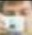

1/1 [==============================] - 1s 1s/step
2 Raoul_Ruiz_0001_face_1.jpg Raoul_Ruiz_0001_face_1 0.42253569116052536
12173


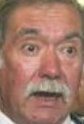

1/1 [==============================] - 1s 1s/step
3 Raoul_Ruiz_0002_face_0.jpg Raoul_Ruiz_0002_face_0 0.5540234367025291
12174


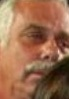

1/1 [==============================] - 2s 2s/step
4 Raoul_Ruiz_0003_face_0.jpg Raoul_Ruiz_0003_face_0 0.6121875839995459
Processing images 12176 to 12180 out of 1000 selected.
12175


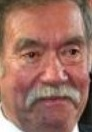

1/1 [==============================] - 2s 2s/step
0 Raoul_Ruiz_0003_face_1.jpg Raoul_Ruiz_0003_face_1 0.38145134472835923
12176


1/1 [==============================] - 2s 2s/step
1 Raoul_Ruiz_0003_face_2.jpg Raoul_Ruiz_0003_face_2 -0.033199957640128584
12177


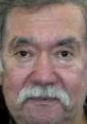

1/1 [==============================] - 1s 1s/step
2 Raoul_Ruiz_0004_face_0.jpg Raoul_Ruiz_0004_face_0 0.12135742466897502
12178


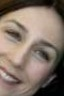

1/1 [==============================] - 2s 2s/step
3 Raoul_Ruiz_0004_face_1.jpg Raoul_Ruiz_0004_face_1 0.20798573956075836
12179


1/1 [==============================] - 1s 1s/step
4 Raoul_Ruiz_0004_face_2.jpg Raoul_Ruiz_0004_face_2 0.5022411736150115
Processing images 12181 to 12185 out of 1000 selected.
12180


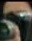

1/1 [==============================] - 1s 1s/step
0 Raoul_Ruiz_0004_face_3.jpg Raoul_Ruiz_0004_face_3 0.5777649606154949
12181


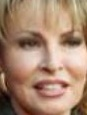

1/1 [==============================] - 1s 1s/step
1 Raquel_Welch_0001_face_0.jpg Raquel_Welch_0001_face_0 0.3315330542465011
12182


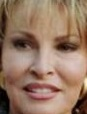

1/1 [==============================] - 2s 2s/step
2 Raquel_Welch_0002_face_0.jpg Raquel_Welch_0002_face_0 0.6785510870052449
12183


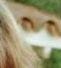

1/1 [==============================] - 2s 2s/step
3 Raquel_Welch_0002_face_1.jpg Raquel_Welch_0002_face_1 0.04659591411192383
12184


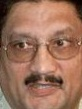

1/1 [==============================] - 2s 2s/step
4 Rashid_Qureshi_0001_face_0.jpg Rashid_Qureshi_0001_face_0 0.8758217496817928
Processing images 12186 to 12190 out of 1000 selected.
12185


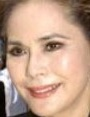

1/1 [==============================] - 1s 1s/step
0 Ratna_Sari_Dewi_Sukarno_0001_face_0.jpg Ratna_Sari_Dewi_Sukarno_0001_face_0 0.23618538173866543
12186


1/1 [==============================] - 1s 1s/step
1 Ratna_Sari_Dewi_Sukarno_0001_face_1.jpg Ratna_Sari_Dewi_Sukarno_0001_face_1 0.2941762394216407
12187


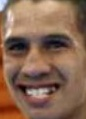

1/1 [==============================] - 2s 2s/step
2 Raul_Castaneda_0001_face_0.jpg Raul_Castaneda_0001_face_0 0.31981601689286643
12188


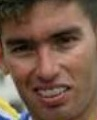

1/1 [==============================] - 1s 1s/step
3 Raul_Chacon_0001_face_0.jpg Raul_Chacon_0001_face_0 0.07341209713081145
12189


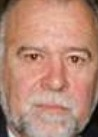

1/1 [==============================] - 1s 1s/step
4 Raul_Cubas_0001_face_0.jpg Raul_Cubas_0001_face_0 0.2698228593905274
Processing images 12191 to 12195 out of 1000 selected.
12190


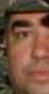

1/1 [==============================] - 2s 2s/step
0 Raul_Cubas_0001_face_1.jpg Raul_Cubas_0001_face_1 0.39223531055060973
12191


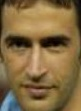

1/1 [==============================] - 2s 2s/step
1 Raul_Gonzalez_0001_face_0.jpg Raul_Gonzalez_0001_face_0 0.2568273682940137
12192


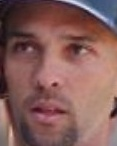

1/1 [==============================] - 2s 2s/step
2 Raul_Ibanez_0001_face_0.jpg Raul_Ibanez_0001_face_0 0.6763390470105212
12193


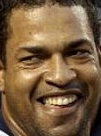

1/1 [==============================] - 1s 1s/step
3 Raul_Mondesi_0001_face_0.jpg Raul_Mondesi_0001_face_0 0.19066480022039176
12194


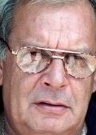

1/1 [==============================] - 1s 1s/step
4 Raul_Rivero_0001_face_0.jpg Raul_Rivero_0001_face_0 0.2950744169278126
Processing images 12196 to 12200 out of 1000 selected.
12195


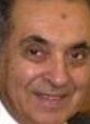

1/1 [==============================] - 1s 1s/step
0 Ravan_AG_Farhadi_0001_face_0.jpg Ravan_AG_Farhadi_0001_face_0 0.7703905508825873
12196


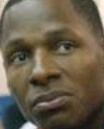

1/1 [==============================] - 1s 1s/step
1 Ray_Allen_0001_face_0.jpg Ray_Allen_0001_face_0 0.2974844274392275
12197


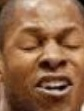

1/1 [==============================] - 1s 1s/step
2 Ray_Allen_0002_face_0.jpg Ray_Allen_0002_face_0 -0.08333167747758281
12198


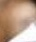

1/1 [==============================] - 1s 1s/step
3 Ray_Allen_0002_face_1.jpg Ray_Allen_0002_face_1 0.30301197114791034
12199


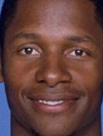

1/1 [==============================] - 1s 1s/step
4 Ray_Allen_0003_face_0.jpg Ray_Allen_0003_face_0 0.3333721591793884
Processing images 12201 to 12205 out of 1000 selected.
12200


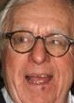

1/1 [==============================] - 2s 2s/step
0 Ray_Bradbury_0001_face_0.jpg Ray_Bradbury_0001_face_0 0.22487469503842386
12201


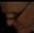

1/1 [==============================] - 2s 2s/step
1 Ray_Bradbury_0001_face_1.jpg Ray_Bradbury_0001_face_1 0.36006737787568305
12202


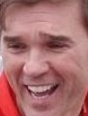

1/1 [==============================] - 2s 2s/step
2 Ray_Evernham_0001_face_0.jpg Ray_Evernham_0001_face_0 0.7211440057860998
12203


1/1 [==============================] - 2s 2s/step
3 Ray_Evernham_0001_face_1.jpg Ray_Evernham_0001_face_1 0.2007661580588785
12204


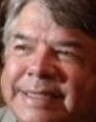

1/1 [==============================] - 1s 1s/step
4 Ray_Halbritter_0001_face_0.jpg Ray_Halbritter_0001_face_0 0.8021930646941979
Processing images 12206 to 12210 out of 1000 selected.
12205


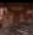

1/1 [==============================] - 1s 1s/step
0 Ray_Halbritter_0001_face_1.jpg Ray_Halbritter_0001_face_1 0.25839221809725815
12206


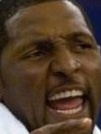

1/1 [==============================] - 1s 1s/step
1 Ray_Lewis_0001_face_0.jpg Ray_Lewis_0001_face_0 0.46264185365198435
12207


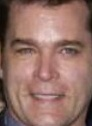

1/1 [==============================] - 1s 1s/step
2 Ray_Liotta_0001_face_0.jpg Ray_Liotta_0001_face_0 0.31124358087667275
12208


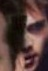

1/1 [==============================] - 1s 1s/step
3 Ray_Liotta_0001_face_1.jpg Ray_Liotta_0001_face_1 0.5919296494640148
12209


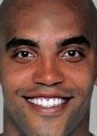

1/1 [==============================] - 2s 2s/step
4 Ray_Lucas_0001_face_0.jpg Ray_Lucas_0001_face_0 0.2948926792903615
Processing images 12211 to 12215 out of 1000 selected.
12210


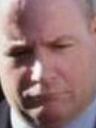

1/1 [==============================] - 2s 2s/step
0 Ray_Morrough_0001_face_0.jpg Ray_Morrough_0001_face_0 0.46500920015683045
12211


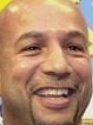

1/1 [==============================] - 2s 2s/step
1 Ray_Nagin_0001_face_0.jpg Ray_Nagin_0001_face_0 0.37046160068968814
12212


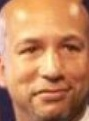

1/1 [==============================] - 1s 1s/step
2 Ray_Nagin_0002_face_0.jpg Ray_Nagin_0002_face_0 0.20469661722402607
12213


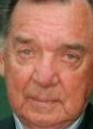

1/1 [==============================] - 1s 1s/step
3 Ray_Price_0001_face_0.jpg Ray_Price_0001_face_0 0.38698671256351663
12214


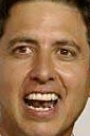

1/1 [==============================] - 1s 1s/step
4 Ray_Romano_0001_face_0.jpg Ray_Romano_0001_face_0 0.4232030199534484
Processing images 12216 to 12220 out of 1000 selected.
12215


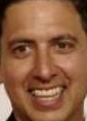

1/1 [==============================] - 1s 1s/step
0 Ray_Romano_0002_face_0.jpg Ray_Romano_0002_face_0 0.22955384501195522
12216


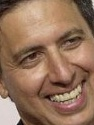

1/1 [==============================] - 1s 1s/step
1 Ray_Romano_0003_face_0.jpg Ray_Romano_0003_face_0 0.147595782956652
12217


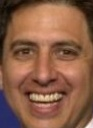

1/1 [==============================] - 1s 1s/step
2 Ray_Romano_0004_face_0.jpg Ray_Romano_0004_face_0 0.6287452754598524
12218


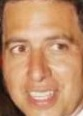

1/1 [==============================] - 1s 1s/step
3 Ray_Romano_0005_face_0.jpg Ray_Romano_0005_face_0 0.6194606101075536
12219


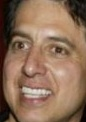

1/1 [==============================] - 2s 2s/step
4 Ray_Romano_0006_face_0.jpg Ray_Romano_0006_face_0 0.5983502414882391
Processing images 12221 to 12225 out of 1000 selected.
12220


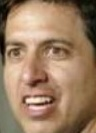

1/1 [==============================] - 2s 2s/step
0 Ray_Romano_0007_face_0.jpg Ray_Romano_0007_face_0 0.434144830725914
12221


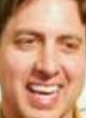

1/1 [==============================] - 2s 2s/step
1 Ray_Romano_0008_face_0.jpg Ray_Romano_0008_face_0 0.30708713138527516
12222


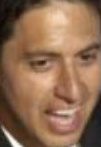

1/1 [==============================] - 2s 2s/step
2 Ray_Romano_0009_face_0.jpg Ray_Romano_0009_face_0 0.7484168553167142
12223


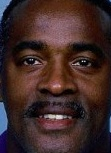

1/1 [==============================] - 2s 2s/step
3 Ray_Sherman_0001_face_0.jpg Ray_Sherman_0001_face_0 0.12117548209329129
12224


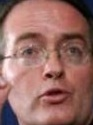

1/1 [==============================] - 2s 2s/step
4 Ray_Wasden_0001_face_0.jpg Ray_Wasden_0001_face_0 0.3275546970215996
Processing images 12226 to 12230 out of 1000 selected.
12225


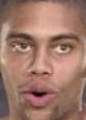

1/1 [==============================] - 1s 1s/step
0 Ray_Young_0001_face_0.jpg Ray_Young_0001_face_0 0.23336532088230175
12226


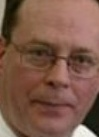

1/1 [==============================] - 1s 1s/step
1 Raymond_Arthurs_0001_face_0.jpg Raymond_Arthurs_0001_face_0 0.3795179254729707
12227


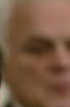

1/1 [==============================] - 1s 1s/step
2 Raymond_Arthurs_0001_face_1.jpg Raymond_Arthurs_0001_face_1 0.5198735880249553
12228


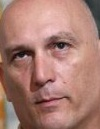

1/1 [==============================] - 1s 1s/step
3 Raymond_Odierno_0001_face_0.jpg Raymond_Odierno_0001_face_0 0.5864432425378343
12229


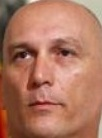

1/1 [==============================] - 2s 2s/step
4 Raymond_Odierno_0002_face_0.jpg Raymond_Odierno_0002_face_0 0.5006037949372357
Processing images 12231 to 12235 out of 1000 selected.
12230


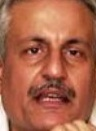

1/1 [==============================] - 1s 1s/step
0 Raza_Rabbani_0001_face_0.jpg Raza_Rabbani_0001_face_0 0.36977390272485183
12231


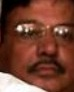

1/1 [==============================] - 1s 1s/step
1 Raza_Rabbani_0001_face_1.jpg Raza_Rabbani_0001_face_1 0.5999612916569622
12232


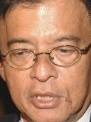

1/1 [==============================] - 2s 2s/step
2 Razali_Ismail_0001_face_0.jpg Razali_Ismail_0001_face_0 0.44032380962552614
12233


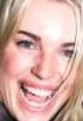

1/1 [==============================] - 2s 2s/step
3 Rebecca_Romijn-Stamos_0001_face_0.jpg Rebecca_Romijn-Stamos_0001_face_0 0.5452487204999489
12234


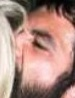

1/1 [==============================] - 2s 2s/step
4 Rebecca_Romijn-Stamos_0001_face_1.jpg Rebecca_Romijn-Stamos_0001_face_1 0.19557556204712231
Processing images 12236 to 12240 out of 1000 selected.
12235


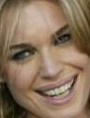

1/1 [==============================] - 1s 1s/step
0 Rebecca_Romijn-Stamos_0002_face_0.jpg Rebecca_Romijn-Stamos_0002_face_0 0.2599602748525542
12236


1/1 [==============================] - 1s 1s/step
1 Rebecca_Romijn-Stamos_0002_face_1.jpg Rebecca_Romijn-Stamos_0002_face_1 0.5206239733174677
12237


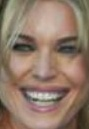

1/1 [==============================] - 1s 1s/step
2 Rebecca_Romijn-Stamos_0003_face_0.jpg Rebecca_Romijn-Stamos_0003_face_0 -0.1034388019399346
12238


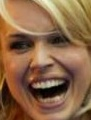

1/1 [==============================] - 1s 1s/step
3 Rebecca_Romijn-Stamos_0004_face_0.jpg Rebecca_Romijn-Stamos_0004_face_0 -0.05155972888502367
12239


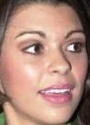

1/1 [==============================] - 1s 1s/step
4 Rebekah_Chantay_Revels_0001_face_0.jpg Rebekah_Chantay_Revels_0001_face_0 0.3020326610758783
Processing images 12241 to 12245 out of 1000 selected.
12240


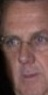

1/1 [==============================] - 2s 2s/step
0 Rebekah_Chantay_Revels_0001_face_1.jpg Rebekah_Chantay_Revels_0001_face_1 0.03671903405371579
12241


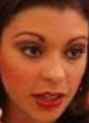

1/1 [==============================] - 2s 2s/step
1 Rebekah_Chantay_Revels_0002_face_0.jpg Rebekah_Chantay_Revels_0002_face_0 0.6233201860910652
12242


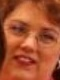

1/1 [==============================] - 2s 2s/step
2 Rebekah_Chantay_Revels_0002_face_1.jpg Rebekah_Chantay_Revels_0002_face_1 0.6442326213523062
12243


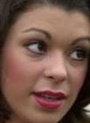

1/1 [==============================] - 1s 1s/step
3 Rebekah_Chantay_Revels_0003_face_0.jpg Rebekah_Chantay_Revels_0003_face_0 0.6328331326197145
12244


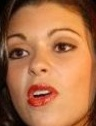

1/1 [==============================] - 1s 1s/step
4 Rebekah_Chantay_Revels_0004_face_0.jpg Rebekah_Chantay_Revels_0004_face_0 0.4857082940036945
Processing images 12246 to 12250 out of 1000 selected.
12245


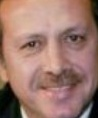

1/1 [==============================] - 1s 1s/step
0 Recep_Tayyip_Erdogan_0001_face_0.jpg Recep_Tayyip_Erdogan_0001_face_0 0.6011068404917203
12246


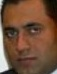

1/1 [==============================] - 1s 1s/step
1 Recep_Tayyip_Erdogan_0002_face_0.jpg Recep_Tayyip_Erdogan_0002_face_0 0.7563154139965201
12247


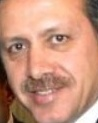

1/1 [==============================] - 1s 1s/step
2 Recep_Tayyip_Erdogan_0002_face_1.jpg Recep_Tayyip_Erdogan_0002_face_1 0.34645184848809946
12248


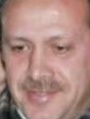

1/1 [==============================] - 1s 1s/step
3 Recep_Tayyip_Erdogan_0003_face_0.jpg Recep_Tayyip_Erdogan_0003_face_0 0.43411788371768134
12249


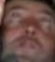

1/1 [==============================] - 2s 2s/step
4 Recep_Tayyip_Erdogan_0003_face_1.jpg Recep_Tayyip_Erdogan_0003_face_1 0.1266540499514345
Processing images 12251 to 12255 out of 1000 selected.
12250


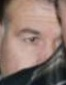

1/1 [==============================] - 2s 2s/step
0 Recep_Tayyip_Erdogan_0003_face_2.jpg Recep_Tayyip_Erdogan_0003_face_2 0.3717078904089783
12251


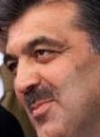

1/1 [==============================] - 2s 2s/step
1 Recep_Tayyip_Erdogan_0004_face_0.jpg Recep_Tayyip_Erdogan_0004_face_0 0.15126449880809684
12252


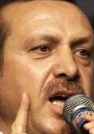

1/1 [==============================] - 1s 1s/step
2 Recep_Tayyip_Erdogan_0005_face_0.jpg Recep_Tayyip_Erdogan_0005_face_0 0.26535893872542976
12253


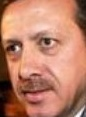

1/1 [==============================] - 1s 1s/step
3 Recep_Tayyip_Erdogan_0006_face_0.jpg Recep_Tayyip_Erdogan_0006_face_0 0.506881337328361
12254


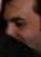

1/1 [==============================] - 1s 1s/step
4 Recep_Tayyip_Erdogan_0006_face_1.jpg Recep_Tayyip_Erdogan_0006_face_1 0.6357723522674364
Processing images 12256 to 12260 out of 1000 selected.
12255


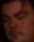

1/1 [==============================] - 1s 1s/step
0 Recep_Tayyip_Erdogan_0006_face_2.jpg Recep_Tayyip_Erdogan_0006_face_2 0.24663059566022588
12256


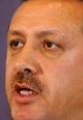

1/1 [==============================] - 1s 1s/step
1 Recep_Tayyip_Erdogan_0007_face_0.jpg Recep_Tayyip_Erdogan_0007_face_0 0.5389980345973803
12257


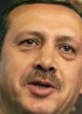

1/1 [==============================] - 1s 1s/step
2 Recep_Tayyip_Erdogan_0008_face_0.jpg Recep_Tayyip_Erdogan_0008_face_0 0.607916471539075
12258


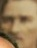

1/1 [==============================] - 1s 1s/step
3 Recep_Tayyip_Erdogan_0008_face_1.jpg Recep_Tayyip_Erdogan_0008_face_1 0.563406011309602
12259


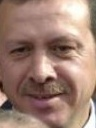

1/1 [==============================] - 2s 2s/step
4 Recep_Tayyip_Erdogan_0009_face_0.jpg Recep_Tayyip_Erdogan_0009_face_0 0.27705505700400807
Processing images 12261 to 12265 out of 1000 selected.
12260


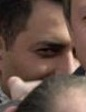

1/1 [==============================] - 2s 2s/step
0 Recep_Tayyip_Erdogan_0009_face_1.jpg Recep_Tayyip_Erdogan_0009_face_1 0.31389108597488863
12261


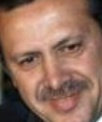

1/1 [==============================] - 2s 2s/step
1 Recep_Tayyip_Erdogan_0010_face_0.jpg Recep_Tayyip_Erdogan_0010_face_0 0.35156626634572563
12262


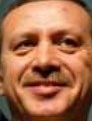

1/1 [==============================] - 2s 2s/step
2 Recep_Tayyip_Erdogan_0011_face_0.jpg Recep_Tayyip_Erdogan_0011_face_0 0.5634519579532776
12263


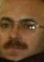

1/1 [==============================] - 1s 1s/step
3 Recep_Tayyip_Erdogan_0012_face_0.jpg Recep_Tayyip_Erdogan_0012_face_0 -0.05235429706556024
12264


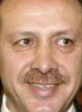

1/1 [==============================] - 1s 1s/step
4 Recep_Tayyip_Erdogan_0012_face_1.jpg Recep_Tayyip_Erdogan_0012_face_1 0.6404009488319913
Processing images 12266 to 12270 out of 1000 selected.
12265


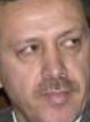

1/1 [==============================] - 1s 1s/step
0 Recep_Tayyip_Erdogan_0013_face_0.jpg Recep_Tayyip_Erdogan_0013_face_0 0.48459457075870066
12266


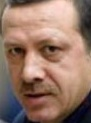

1/1 [==============================] - 1s 1s/step
1 Recep_Tayyip_Erdogan_0014_face_0.jpg Recep_Tayyip_Erdogan_0014_face_0 0.009345986686652492
12267


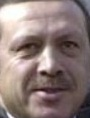

1/1 [==============================] - 3s 3s/step
2 Recep_Tayyip_Erdogan_0015_face_0.jpg Recep_Tayyip_Erdogan_0015_face_0 0.5268839888925338
12268


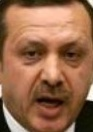

1/1 [==============================] - 2s 2s/step
3 Recep_Tayyip_Erdogan_0016_face_0.jpg Recep_Tayyip_Erdogan_0016_face_0 0.41395223900915407
12269


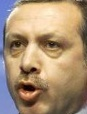

1/1 [==============================] - 2s 2s/step
4 Recep_Tayyip_Erdogan_0017_face_0.jpg Recep_Tayyip_Erdogan_0017_face_0 0.39739933827213275
Processing images 12271 to 12275 out of 1000 selected.
12270


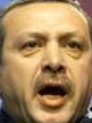

1/1 [==============================] - 1s 1s/step
0 Recep_Tayyip_Erdogan_0018_face_0.jpg Recep_Tayyip_Erdogan_0018_face_0 0.21480545022103806
12271


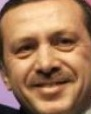

1/1 [==============================] - 1s 1s/step
1 Recep_Tayyip_Erdogan_0019_face_0.jpg Recep_Tayyip_Erdogan_0019_face_0 0.21258810630547276
12272


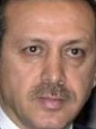

1/1 [==============================] - 1s 1s/step
2 Recep_Tayyip_Erdogan_0020_face_0.jpg Recep_Tayyip_Erdogan_0020_face_0 0.2604848792937761
12273


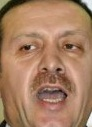

1/1 [==============================] - 1s 1s/step
3 Recep_Tayyip_Erdogan_0021_face_0.jpg Recep_Tayyip_Erdogan_0021_face_0 0.36454950039934786
12274


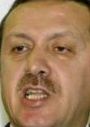

1/1 [==============================] - 1s 1s/step
4 Recep_Tayyip_Erdogan_0022_face_0.jpg Recep_Tayyip_Erdogan_0022_face_0 0.15207609073097403
Processing images 12276 to 12280 out of 1000 selected.
12275


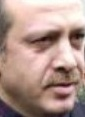

1/1 [==============================] - 1s 1s/step
0 Recep_Tayyip_Erdogan_0023_face_0.jpg Recep_Tayyip_Erdogan_0023_face_0 0.01418902221161926
12276


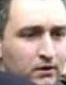

1/1 [==============================] - 1s 1s/step
1 Recep_Tayyip_Erdogan_0023_face_1.jpg Recep_Tayyip_Erdogan_0023_face_1 0.36478240667218037
12277


1/1 [==============================] - 2s 2s/step
2 Recep_Tayyip_Erdogan_0023_face_2.jpg Recep_Tayyip_Erdogan_0023_face_2 0.050380211603718014
12278


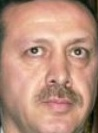

1/1 [==============================] - 2s 2s/step
3 Recep_Tayyip_Erdogan_0024_face_0.jpg Recep_Tayyip_Erdogan_0024_face_0 0.19248292239240836
12279


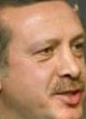

1/1 [==============================] - 2s 2s/step
4 Recep_Tayyip_Erdogan_0025_face_0.jpg Recep_Tayyip_Erdogan_0025_face_0 0.6683116910632451
Processing images 12281 to 12285 out of 1000 selected.
12280


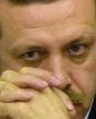

1/1 [==============================] - 2s 2s/step
0 Recep_Tayyip_Erdogan_0026_face_0.jpg Recep_Tayyip_Erdogan_0026_face_0 0.5069150693473988
12281


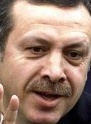

1/1 [==============================] - 1s 1s/step
1 Recep_Tayyip_Erdogan_0027_face_0.jpg Recep_Tayyip_Erdogan_0027_face_0 -0.037900847834807815
12282


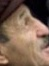

1/1 [==============================] - 1s 1s/step
2 Recep_Tayyip_Erdogan_0027_face_1.jpg Recep_Tayyip_Erdogan_0027_face_1 0.6512894180900757
12283


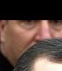

1/1 [==============================] - 1s 1s/step
3 Recep_Tayyip_Erdogan_0027_face_2.jpg Recep_Tayyip_Erdogan_0027_face_2 0.26544145134195263
12284


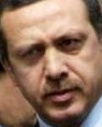

1/1 [==============================] - 1s 1s/step
4 Recep_Tayyip_Erdogan_0028_face_0.jpg Recep_Tayyip_Erdogan_0028_face_0 0.7735637416179322
Processing images 12286 to 12290 out of 1000 selected.
12285


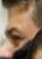

1/1 [==============================] - 1s 1s/step
0 Recep_Tayyip_Erdogan_0028_face_1.jpg Recep_Tayyip_Erdogan_0028_face_1 0.6686081669963161
12286


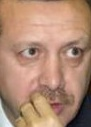

1/1 [==============================] - 2s 2s/step
1 Recep_Tayyip_Erdogan_0029_face_0.jpg Recep_Tayyip_Erdogan_0029_face_0 0.2723843969627586
12287


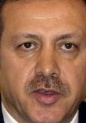

1/1 [==============================] - 2s 2s/step
2 Recep_Tayyip_Erdogan_0030_face_0.jpg Recep_Tayyip_Erdogan_0030_face_0 0.31274879843545195
12288


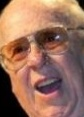

1/1 [==============================] - 2s 2s/step
3 Red_Auerbach_0001_face_0.jpg Red_Auerbach_0001_face_0 0.2734292863566271
12289


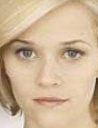

1/1 [==============================] - 2s 2s/step
4 Reese_Witherspoon_0001_face_0.jpg Reese_Witherspoon_0001_face_0 0.47378633986297597
Processing images 12291 to 12295 out of 1000 selected.
12290


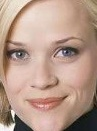

1/1 [==============================] - 2s 2s/step
0 Reese_Witherspoon_0002_face_0.jpg Reese_Witherspoon_0002_face_0 0.18672983663963505
12291


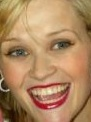

1/1 [==============================] - 1s 1s/step
1 Reese_Witherspoon_0003_face_0.jpg Reese_Witherspoon_0003_face_0 0.7016735975404733
12292


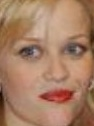

1/1 [==============================] - 1s 1s/step
2 Reese_Witherspoon_0004_face_0.jpg Reese_Witherspoon_0004_face_0 0.18578455896950993
12293


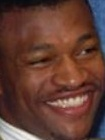

1/1 [==============================] - 1s 1s/step
3 Reggie_Lewis_0001_face_0.jpg Reggie_Lewis_0001_face_0 0.20712710390912994
12294


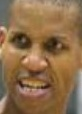

1/1 [==============================] - 1s 1s/step
4 Reggie_Miller_0001_face_0.jpg Reggie_Miller_0001_face_0 0.4092994746880494
Processing images 12296 to 12300 out of 1000 selected.
12295


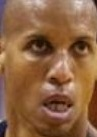

1/1 [==============================] - 1s 1s/step
0 Reggie_Miller_0002_face_0.jpg Reggie_Miller_0002_face_0 0.25732004873170267
12296


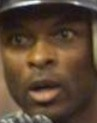

1/1 [==============================] - 1s 1s/step
1 Reggie_Sanders_0001_face_0.jpg Reggie_Sanders_0001_face_0 0.2554817328891582
12297


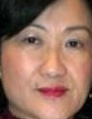

1/1 [==============================] - 2s 2s/step
2 Regina_Ip_0001_face_0.jpg Regina_Ip_0001_face_0 0.46096350454344637
12298


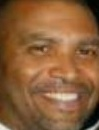

1/1 [==============================] - 2s 2s/step
3 Reginald_Hudlin_0001_face_0.jpg Reginald_Hudlin_0001_face_0 0.13405868164917542
12299


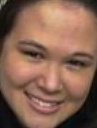

1/1 [==============================] - 2s 2s/step
4 Reina_Hayes_0001_face_0.jpg Reina_Hayes_0001_face_0 0.3889225243430937
Processing images 12301 to 12305 out of 1000 selected.
12300


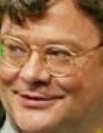

1/1 [==============================] - 2s 2s/step
0 Reinhard_Buetikofer_0001_face_0.jpg Reinhard_Buetikofer_0001_face_0 0.568299006972591
12301


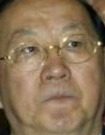

1/1 [==============================] - 1s 1s/step
1 Ren_Qingjin_0001_face_0.jpg Ren_Qingjin_0001_face_0 0.27860874680229125
12302


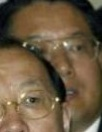

1/1 [==============================] - 1s 1s/step
2 Ren_Qingjin_0001_face_1.jpg Ren_Qingjin_0001_face_1 0.8602636039655625
12303


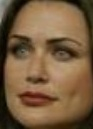

1/1 [==============================] - 1s 1s/step
3 Rena_Sofer_0001_face_0.jpg Rena_Sofer_0001_face_0 0.22989136108443817
12304


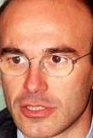

1/1 [==============================] - 1s 1s/step
4 Renato_Soru_0001_face_0.jpg Renato_Soru_0001_face_0 0.2633624318449707
Processing images 12306 to 12310 out of 1000 selected.
12305


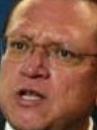

1/1 [==============================] - 1s 1s/step
0 Rene_Antonio_Leon_Rodriguez_0001_face_0.jpg Rene_Antonio_Leon_Rodriguez_0001_face_0 0.6296778173498262
12306


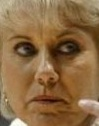

1/1 [==============================] - 1s 1s/step
1 Rene_Portland_0001_face_0.jpg Rene_Portland_0001_face_0 0.36100187129481115
12307


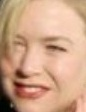

1/1 [==============================] - 1s 1s/step
2 Renee_Zellweger_0001_face_0.jpg Renee_Zellweger_0001_face_0 0.5655047487028216
12308


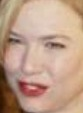

1/1 [==============================] - 1s 1s/step
3 Renee_Zellweger_0002_face_0.jpg Renee_Zellweger_0002_face_0 0.2622449408392191
12309


1/1 [==============================] - 2s 2s/step
4 Renee_Zellweger_0002_face_1.jpg Renee_Zellweger_0002_face_1 0.41770421591671236
Processing images 12311 to 12315 out of 1000 selected.
12310


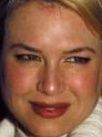

1/1 [==============================] - 2s 2s/step
0 Renee_Zellweger_0003_face_0.jpg Renee_Zellweger_0003_face_0 0.3771789228400112
12311


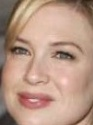

1/1 [==============================] - 2s 2s/step
1 Renee_Zellweger_0004_face_0.jpg Renee_Zellweger_0004_face_0 0.48257123519942996
12312


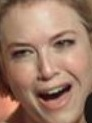

1/1 [==============================] - 1s 1s/step
2 Renee_Zellweger_0005_face_0.jpg Renee_Zellweger_0005_face_0 0.20194540067996433
12313


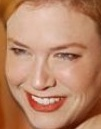

1/1 [==============================] - 2s 2s/step
3 Renee_Zellweger_0006_face_0.jpg Renee_Zellweger_0006_face_0 0.13629779232075726
12314


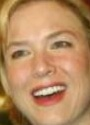

1/1 [==============================] - 1s 1s/step
4 Renee_Zellweger_0007_face_0.jpg Renee_Zellweger_0007_face_0 0.42565279582420457
Processing images 12316 to 12320 out of 1000 selected.
12315


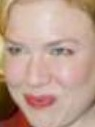

1/1 [==============================] - 1s 1s/step
0 Renee_Zellweger_0008_face_0.jpg Renee_Zellweger_0008_face_0 -0.047239813804122045
12316


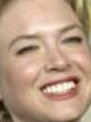

1/1 [==============================] - 1s 1s/step
1 Renee_Zellweger_0009_face_0.jpg Renee_Zellweger_0009_face_0 0.6833350643694842
12317


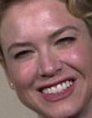

1/1 [==============================] - 1s 1s/step
2 Renee_Zellweger_0010_face_0.jpg Renee_Zellweger_0010_face_0 0.5537370920701343
12318


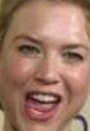

1/1 [==============================] - 2s 2s/step
3 Renee_Zellweger_0011_face_0.jpg Renee_Zellweger_0011_face_0 0.37227879150117943
12319


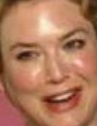

1/1 [==============================] - 2s 2s/step
4 Renee_Zellweger_0012_face_0.jpg Renee_Zellweger_0012_face_0 0.6039069140824921
Processing images 12321 to 12325 out of 1000 selected.
12320


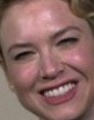

1/1 [==============================] - 1s 1s/step
0 Renee_Zellweger_0013_face_0.jpg Renee_Zellweger_0013_face_0 0.19815411828729984
12321


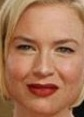

1/1 [==============================] - 1s 1s/step
1 Renee_Zellweger_0014_face_0.jpg Renee_Zellweger_0014_face_0 0.4994524358359266
12322


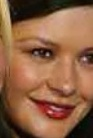

1/1 [==============================] - 1s 1s/step
2 Renee_Zellweger_0015_face_0.jpg Renee_Zellweger_0015_face_0 0.40329153143908486
12323


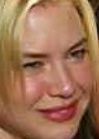

1/1 [==============================] - 1s 1s/step
3 Renee_Zellweger_0015_face_1.jpg Renee_Zellweger_0015_face_1 0.42767478966063754
12324


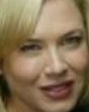

1/1 [==============================] - 1s 1s/step
4 Renee_Zellweger_0016_face_0.jpg Renee_Zellweger_0016_face_0 0.6765665902864354
Processing images 12326 to 12330 out of 1000 selected.
12325


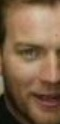

1/1 [==============================] - 1s 1s/step
0 Renee_Zellweger_0016_face_1.jpg Renee_Zellweger_0016_face_1 0.2763857240965257
12326


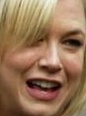

1/1 [==============================] - 2s 2s/step
1 Renee_Zellweger_0017_face_0.jpg Renee_Zellweger_0017_face_0 0.7178797298112084
12327


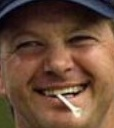

1/1 [==============================] - 2s 2s/step
2 Retief_Goosen_0001_face_0.jpg Retief_Goosen_0001_face_0 0.48301173297207545
12328


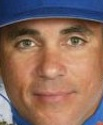

1/1 [==============================] - 2s 2s/step
3 Rey_Sanchez_0001_face_0.jpg Rey_Sanchez_0001_face_0 0.604828506554524
12329


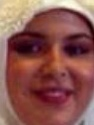

1/1 [==============================] - 1s 1s/step
4 Reyyan_Uzuner_0001_face_0.jpg Reyyan_Uzuner_0001_face_0 0.6250010612624558
Processing images 12331 to 12335 out of 1000 selected.
12330


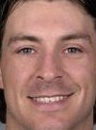

1/1 [==============================] - 1s 1s/step
0 Rhett_Warrener_0001_face_0.jpg Rhett_Warrener_0001_face_0 0.14891478666595598
12331


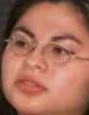

1/1 [==============================] - 1s 1s/step
1 Rhina_Villatoro_0001_face_0.jpg Rhina_Villatoro_0001_face_0 0.23454569895147848
12332


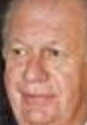

1/1 [==============================] - 1s 1s/step
2 Ricardo_Lagos_0001_face_0.jpg Ricardo_Lagos_0001_face_0 0.32804102659453693
12333


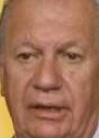

1/1 [==============================] - 1s 1s/step
3 Ricardo_Lagos_0002_face_0.jpg Ricardo_Lagos_0002_face_0 0.7223933920912264
12334


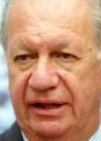

1/1 [==============================] - 2s 2s/step
4 Ricardo_Lagos_0003_face_0.jpg Ricardo_Lagos_0003_face_0 0.4865421815233866
Processing images 12336 to 12340 out of 1000 selected.
12335


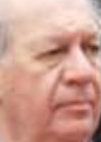

1/1 [==============================] - 2s 2s/step
0 Ricardo_Lagos_0004_face_0.jpg Ricardo_Lagos_0004_face_0 0.5234408535670262
12336


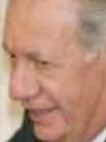

1/1 [==============================] - 2s 2s/step
1 Ricardo_Lagos_0005_face_0.jpg Ricardo_Lagos_0005_face_0 0.41710585681327095
12337


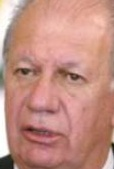

1/1 [==============================] - 1s 1s/step
2 Ricardo_Lagos_0006_face_0.jpg Ricardo_Lagos_0006_face_0 0.2696321831382325
12338


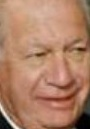

1/1 [==============================] - 1s 1s/step
3 Ricardo_Lagos_0007_face_0.jpg Ricardo_Lagos_0007_face_0 0.5047070490918488
12339


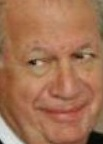

1/1 [==============================] - 1s 1s/step
4 Ricardo_Lagos_0008_face_0.jpg Ricardo_Lagos_0008_face_0 0.28585124932762007
Processing images 12341 to 12345 out of 1000 selected.
12340


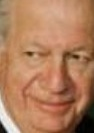

1/1 [==============================] - 1s 1s/step
0 Ricardo_Lagos_0009_face_0.jpg Ricardo_Lagos_0009_face_0 0.43665933023897535
12341


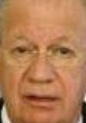

1/1 [==============================] - 1s 1s/step
1 Ricardo_Lagos_0010_face_0.jpg Ricardo_Lagos_0010_face_0 0.5228637125932515
12342


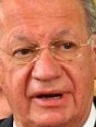

1/1 [==============================] - 2s 2s/step
2 Ricardo_Lagos_0011_face_0.jpg Ricardo_Lagos_0011_face_0 0.3584222560991471
12343


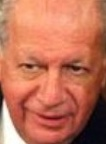

1/1 [==============================] - 2s 2s/step
3 Ricardo_Lagos_0012_face_0.jpg Ricardo_Lagos_0012_face_0 0.13436046238879593
12344


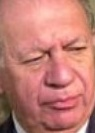

1/1 [==============================] - 2s 2s/step
4 Ricardo_Lagos_0013_face_0.jpg Ricardo_Lagos_0013_face_0 0.46709704169489585
Processing images 12346 to 12350 out of 1000 selected.
12345


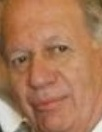

1/1 [==============================] - 1s 1s/step
0 Ricardo_Lagos_0014_face_0.jpg Ricardo_Lagos_0014_face_0 0.7045940823429909
12346


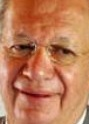

1/1 [==============================] - 1s 1s/step
1 Ricardo_Lagos_0015_face_0.jpg Ricardo_Lagos_0015_face_0 0.1508575158618088
12347


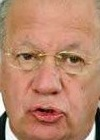

1/1 [==============================] - 1s 1s/step
2 Ricardo_Lagos_0016_face_0.jpg Ricardo_Lagos_0016_face_0 0.29589307587413394
12348


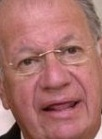

1/1 [==============================] - 2s 2s/step
3 Ricardo_Lagos_0017_face_0.jpg Ricardo_Lagos_0017_face_0 0.6534160482471452
12349


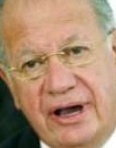

1/1 [==============================] - 2s 2s/step
4 Ricardo_Lagos_0018_face_0.jpg Ricardo_Lagos_0018_face_0 0.8429024749092038
Processing images 12351 to 12355 out of 1000 selected.
12350


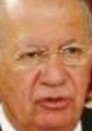

1/1 [==============================] - 2s 2s/step
0 Ricardo_Lagos_0019_face_0.jpg Ricardo_Lagos_0019_face_0 0.5666781185160518
12351


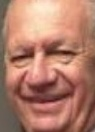

1/1 [==============================] - 2s 2s/step
1 Ricardo_Lagos_0020_face_0.jpg Ricardo_Lagos_0020_face_0 -0.00523983759109624
12352


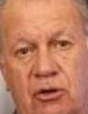

1/1 [==============================] - 1s 1s/step
2 Ricardo_Lagos_0021_face_0.jpg Ricardo_Lagos_0021_face_0 0.3749552028969688
12353


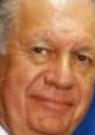

1/1 [==============================] - 1s 1s/step
3 Ricardo_Lagos_0022_face_0.jpg Ricardo_Lagos_0022_face_0 0.48041486990316784
12354


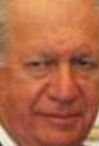

1/1 [==============================] - 1s 1s/step
4 Ricardo_Lagos_0023_face_0.jpg Ricardo_Lagos_0023_face_0 0.5118845316551128
Processing images 12356 to 12360 out of 1000 selected.
12355


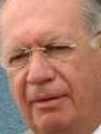

1/1 [==============================] - 1s 1s/step
0 Ricardo_Lagos_0024_face_0.jpg Ricardo_Lagos_0024_face_0 0.28318482137465656
12356


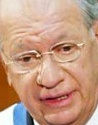

1/1 [==============================] - 1s 1s/step
1 Ricardo_Lagos_0025_face_0.jpg Ricardo_Lagos_0025_face_0 0.45676100971898337
12357


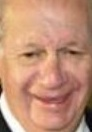

1/1 [==============================] - 1s 1s/step
2 Ricardo_Lagos_0026_face_0.jpg Ricardo_Lagos_0026_face_0 0.6406299541859287
12358


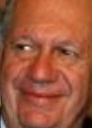

1/1 [==============================] - 2s 2s/step
3 Ricardo_Lagos_0027_face_0.jpg Ricardo_Lagos_0027_face_0 0.47739286364110733
12359


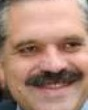

1/1 [==============================] - 2s 2s/step
4 Ricardo_Lopez_Murphy_0001_face_0.jpg Ricardo_Lopez_Murphy_0001_face_0 0.2597621538479121
Processing images 12361 to 12365 out of 1000 selected.
12360


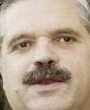

1/1 [==============================] - 2s 2s/step
0 Ricardo_Lopez_Murphy_0002_face_0.jpg Ricardo_Lopez_Murphy_0002_face_0 0.31296039291283906
12361


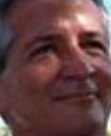

1/1 [==============================] - 2s 2s/step
1 Ricardo_Maduro_0001_face_0.jpg Ricardo_Maduro_0001_face_0 0.08969394499588679
12362


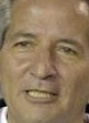

1/1 [==============================] - 1s 1s/step
2 Ricardo_Maduro_0002_face_0.jpg Ricardo_Maduro_0002_face_0 0.5785761934345052
12363


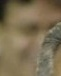

1/1 [==============================] - 1s 1s/step
3 Ricardo_Maduro_0002_face_1.jpg Ricardo_Maduro_0002_face_1 0.7820040442880786
12364


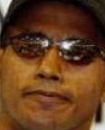

1/1 [==============================] - 1s 1s/step
4 Ricardo_Mayorga_0001_face_0.jpg Ricardo_Mayorga_0001_face_0 0.4612818186339724
Processing images 12366 to 12370 out of 1000 selected.
12365


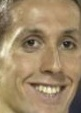

1/1 [==============================] - 1s 1s/step
0 Ricardo_Monasterio_0001_face_0.jpg Ricardo_Monasterio_0001_face_0 0.3745112107678441
12366


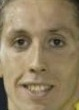

1/1 [==============================] - 1s 1s/step
1 Ricardo_Monasterio_0002_face_0.jpg Ricardo_Monasterio_0002_face_0 0.04642878629988713
12367


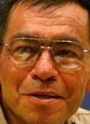

1/1 [==============================] - 1s 1s/step
2 Ricardo_Sanchez_0001_face_0.jpg Ricardo_Sanchez_0001_face_0 0.2115020888664458
12368


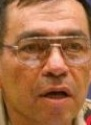

1/1 [==============================] - 1s 1s/step
3 Ricardo_Sanchez_0002_face_0.jpg Ricardo_Sanchez_0002_face_0 0.5326180084316626
12369


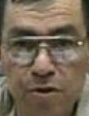

1/1 [==============================] - 2s 2s/step
4 Ricardo_Sanchez_0003_face_0.jpg Ricardo_Sanchez_0003_face_0 0.27282578384201894
Processing images 12371 to 12375 out of 1000 selected.
12370


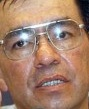

1/1 [==============================] - 2s 2s/step
0 Ricardo_Sanchez_0004_face_0.jpg Ricardo_Sanchez_0004_face_0 0.28888289778411674
12371


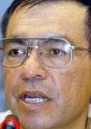

1/1 [==============================] - 2s 2s/step
1 Ricardo_Sanchez_0005_face_0.jpg Ricardo_Sanchez_0005_face_0 0.5576239174707498
12372


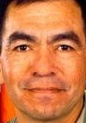

1/1 [==============================] - 1s 1s/step
2 Ricardo_Sanchez_0006_face_0.jpg Ricardo_Sanchez_0006_face_0 0.169922422963094
12373


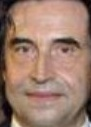

1/1 [==============================] - 1s 1s/step
3 Riccardo_Muti_0001_face_0.jpg Riccardo_Muti_0001_face_0 0.6004973002255274
12374


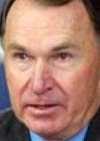

1/1 [==============================] - 1s 1s/step
4 Rich_Brooks_0001_face_0.jpg Rich_Brooks_0001_face_0 0.1688825596522096
Processing images 12376 to 12380 out of 1000 selected.
12375


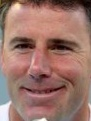

1/1 [==============================] - 1s 1s/step
0 Rich_Gannon_0001_face_0.jpg Rich_Gannon_0001_face_0 0.2640752254563069
12376


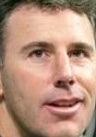

1/1 [==============================] - 1s 1s/step
1 Rich_Gannon_0002_face_0.jpg Rich_Gannon_0002_face_0 0.4772015730299475
12377


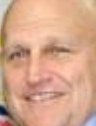

1/1 [==============================] - 1s 1s/step
2 Richard_Armitage_0001_face_0.jpg Richard_Armitage_0001_face_0 0.26474650500657115
12378


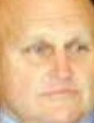

1/1 [==============================] - 2s 2s/step
3 Richard_Armitage_0002_face_0.jpg Richard_Armitage_0002_face_0 0.36277685731950987
12379


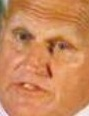

1/1 [==============================] - 2s 2s/step
4 Richard_Armitage_0003_face_0.jpg Richard_Armitage_0003_face_0 0.39534559412019865
Processing images 12381 to 12385 out of 1000 selected.
12380


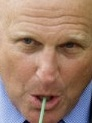

1/1 [==============================] - 2s 2s/step
0 Richard_Armitage_0004_face_0.jpg Richard_Armitage_0004_face_0 0.41712150436103995
12381


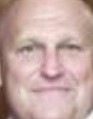

1/1 [==============================] - 2s 2s/step
1 Richard_Armitage_0005_face_0.jpg Richard_Armitage_0005_face_0 0.2438537406245332
12382


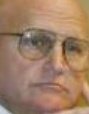

1/1 [==============================] - 1s 1s/step
2 Richard_Armitage_0006_face_0.jpg Richard_Armitage_0006_face_0 0.33547602490858613
12383


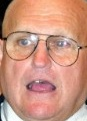

1/1 [==============================] - 1s 1s/step
3 Richard_Armitage_0007_face_0.jpg Richard_Armitage_0007_face_0 0.3645372410473208
12384


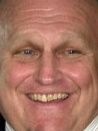

1/1 [==============================] - 1s 1s/step
4 Richard_Armitage_0008_face_0.jpg Richard_Armitage_0008_face_0 0.26136183097287324
Processing images 12386 to 12390 out of 1000 selected.
12385


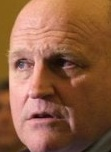

1/1 [==============================] - 1s 1s/step
0 Richard_Armitage_0009_face_0.jpg Richard_Armitage_0009_face_0 0.7750683728580087
12386


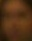

1/1 [==============================] - 1s 1s/step
1 Richard_Armitage_0009_face_1.jpg Richard_Armitage_0009_face_1 0.10224187127235372
12387


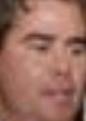

1/1 [==============================] - 1s 1s/step
2 Richard_Barry_0001_face_0.jpg Richard_Barry_0001_face_0 0.326254274571945
12388


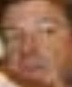

1/1 [==============================] - 1s 1s/step
3 Richard_Barry_0001_face_1.jpg Richard_Barry_0001_face_1 0.6037104393787075
12389


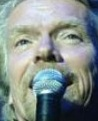

1/1 [==============================] - 1s 1s/step
4 Richard_Branson_0001_face_0.jpg Richard_Branson_0001_face_0 0.6280033009028629
Processing images 12391 to 12395 out of 1000 selected.
12390


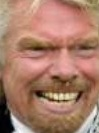

1/1 [==============================] - 1s 1s/step
0 Richard_Branson_0002_face_0.jpg Richard_Branson_0002_face_0 0.23738417343359955
12391


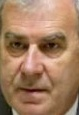

1/1 [==============================] - 2s 2s/step
1 Richard_Butler_0001_face_0.jpg Richard_Butler_0001_face_0 0.6178472268229025
12392


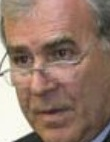

1/1 [==============================] - 2s 2s/step
2 Richard_Butler_0002_face_0.jpg Richard_Butler_0002_face_0 0.5881473252178268
12393


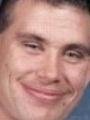

1/1 [==============================] - 2s 2s/step
3 Richard_Carl_0001_face_0.jpg Richard_Carl_0001_face_0 0.2468627601558884
12394


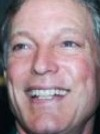

1/1 [==============================] - 2s 2s/step
4 Richard_Chamberlain_0001_face_0.jpg Richard_Chamberlain_0001_face_0 0.40466497023880316
Processing images 12396 to 12400 out of 1000 selected.
12395


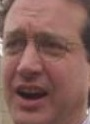

1/1 [==============================] - 1s 1s/step
0 Richard_Cohen_0001_face_0.jpg Richard_Cohen_0001_face_0 0.2673231409686615
12396


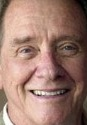

1/1 [==============================] - 1s 1s/step
1 Richard_Crenna_0001_face_0.jpg Richard_Crenna_0001_face_0 0.4557277015551536
12397


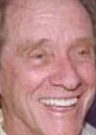

1/1 [==============================] - 1s 1s/step
2 Richard_Crenna_0002_face_0.jpg Richard_Crenna_0002_face_0 0.22615188484354118
12398


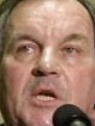

1/1 [==============================] - 1s 1s/step
3 Richard_Daley_0001_face_0.jpg Richard_Daley_0001_face_0 0.5556476295365599
12399


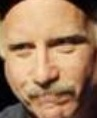

1/1 [==============================] - 1s 1s/step
4 Richard_Dreyfuss_0001_face_0.jpg Richard_Dreyfuss_0001_face_0 0.3882789324964267
Processing images 12401 to 12405 out of 1000 selected.
12400


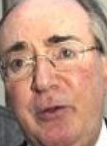

1/1 [==============================] - 2s 2s/step
0 Richard_Fine_0001_face_0.jpg Richard_Fine_0001_face_0 0.25061568377217486
12401


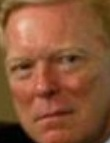

1/1 [==============================] - 2s 2s/step
1 Richard_Gephardt_0001_face_0.jpg Richard_Gephardt_0001_face_0 0.2603542845568193
12402


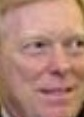

1/1 [==============================] - 2s 2s/step
2 Richard_Gephardt_0002_face_0.jpg Richard_Gephardt_0002_face_0 0.219896910904283
12403


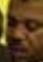

1/1 [==============================] - 1s 1s/step
3 Richard_Gephardt_0002_face_1.jpg Richard_Gephardt_0002_face_1 0.4154851257474924
12404


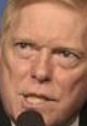

1/1 [==============================] - 1s 1s/step
4 Richard_Gephardt_0003_face_0.jpg Richard_Gephardt_0003_face_0 0.4015099540311939
Processing images 12406 to 12410 out of 1000 selected.
12405


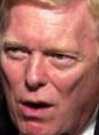

1/1 [==============================] - 1s 1s/step
0 Richard_Gephardt_0004_face_0.jpg Richard_Gephardt_0004_face_0 0.36088099727548256
12406


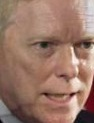

1/1 [==============================] - 1s 1s/step
1 Richard_Gephardt_0005_face_0.jpg Richard_Gephardt_0005_face_0 -0.14754885557176337
12407


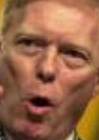

1/1 [==============================] - 1s 1s/step
2 Richard_Gephardt_0006_face_0.jpg Richard_Gephardt_0006_face_0 0.3145401439157997
12408


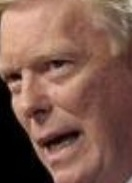

1/1 [==============================] - 1s 1s/step
3 Richard_Gephardt_0007_face_0.jpg Richard_Gephardt_0007_face_0 0.7578234507811451
12409


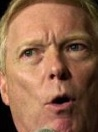

1/1 [==============================] - 2s 2s/step
4 Richard_Gephardt_0008_face_0.jpg Richard_Gephardt_0008_face_0 0.709788263094161
Processing images 12411 to 12415 out of 1000 selected.
12410


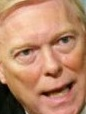

1/1 [==============================] - 2s 2s/step
0 Richard_Gephardt_0009_face_0.jpg Richard_Gephardt_0009_face_0 0.5166139280192492
12411


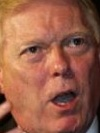

1/1 [==============================] - 2s 2s/step
1 Richard_Gephardt_0010_face_0.jpg Richard_Gephardt_0010_face_0 0.22649648387307672
12412


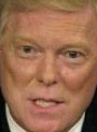

1/1 [==============================] - 1s 1s/step
2 Richard_Gephardt_0011_face_0.jpg Richard_Gephardt_0011_face_0 0.5140813399905831
12413


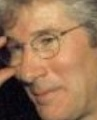

1/1 [==============================] - 2s 2s/step
3 Richard_Gere_0001_face_0.jpg Richard_Gere_0001_face_0 0.6706242625077418
12414


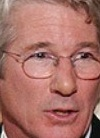

1/1 [==============================] - 1s 1s/step
4 Richard_Gere_0002_face_0.jpg Richard_Gere_0002_face_0 0.5268926373199114
Processing images 12416 to 12420 out of 1000 selected.
12415


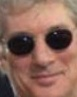

1/1 [==============================] - 1s 1s/step
0 Richard_Gere_0003_face_0.jpg Richard_Gere_0003_face_0 0.4882837928275973
12416


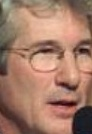

1/1 [==============================] - 1s 1s/step
1 Richard_Gere_0004_face_0.jpg Richard_Gere_0004_face_0 0.5662240587820462
12417


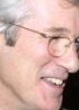

1/1 [==============================] - 2s 2s/step
2 Richard_Gere_0005_face_0.jpg Richard_Gere_0005_face_0 0.7203062441724517
12418


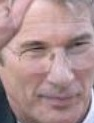

1/1 [==============================] - 2s 2s/step
3 Richard_Gere_0006_face_0.jpg Richard_Gere_0006_face_0 0.5740931595706885
12419


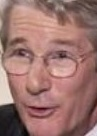

1/1 [==============================] - 2s 2s/step
4 Richard_Gere_0007_face_0.jpg Richard_Gere_0007_face_0 0.5086016144704669
Processing images 12421 to 12425 out of 1000 selected.
12420


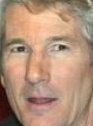

1/1 [==============================] - 2s 2s/step
0 Richard_Gere_0008_face_0.jpg Richard_Gere_0008_face_0 0.13036103387676468
12421


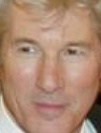

1/1 [==============================] - 2s 2s/step
1 Richard_Gere_0009_face_0.jpg Richard_Gere_0009_face_0 0.5644521331780897
12422


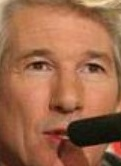

1/1 [==============================] - 1s 1s/step
2 Richard_Gere_0010_face_0.jpg Richard_Gere_0010_face_0 0.40785470551153347
12423


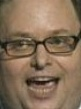

1/1 [==============================] - 1s 1s/step
3 Richard_Greenberg_0001_face_0.jpg Richard_Greenberg_0001_face_0 0.5306554407291699
12424


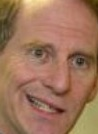

1/1 [==============================] - 1s 1s/step
4 Richard_Haass_0001_face_0.jpg Richard_Haass_0001_face_0 0.6095186095085074
Processing images 12426 to 12430 out of 1000 selected.
12425


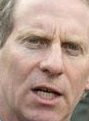

1/1 [==============================] - 1s 1s/step
0 Richard_Haass_0002_face_0.jpg Richard_Haass_0002_face_0 0.35402490423937283
12426


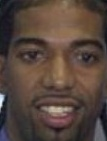

1/1 [==============================] - 1s 1s/step
1 Richard_Hamilton_0001_face_0.jpg Richard_Hamilton_0001_face_0 0.4971610074686926
12427


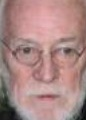

1/1 [==============================] - 1s 1s/step
2 Richard_Harris_0001_face_0.jpg Richard_Harris_0001_face_0 0.52364587503825
12428


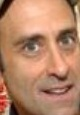

1/1 [==============================] - 2s 2s/step
3 Richard_Hellfant_0001_face_0.jpg Richard_Hellfant_0001_face_0 0.5176092228330396
12429


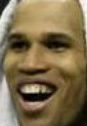

1/1 [==============================] - 2s 2s/step
4 Richard_Jefferson_0001_face_0.jpg Richard_Jefferson_0001_face_0 0.31773726608812863
Processing images 12431 to 12435 out of 1000 selected.
12430


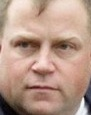

1/1 [==============================] - 2s 2s/step
0 Richard_Jewell_0001_face_0.jpg Richard_Jewell_0001_face_0 0.17523645210984512
12431


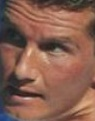

1/1 [==============================] - 2s 2s/step
1 Richard_Krajicek_0001_face_0.jpg Richard_Krajicek_0001_face_0 0.22888308939275437
12432


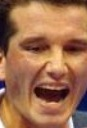

1/1 [==============================] - 2s 2s/step
2 Richard_Krajicek_0002_face_0.jpg Richard_Krajicek_0002_face_0 0.431381022640996
12433


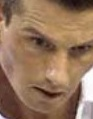

1/1 [==============================] - 1s 1s/step
3 Richard_Krajicek_0003_face_0.jpg Richard_Krajicek_0003_face_0 0.4936171220518922
12434


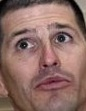

1/1 [==============================] - 1s 1s/step
4 Richard_Langille_0001_face_0.jpg Richard_Langille_0001_face_0 0.5445250722810915
Processing images 12436 to 12440 out of 1000 selected.
12435


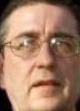

1/1 [==============================] - 1s 1s/step
0 Richard_Lennon_0001_face_0.jpg Richard_Lennon_0001_face_0 0.6822534977187116
12436


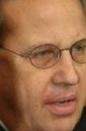

1/1 [==============================] - 1s 1s/step
1 Richard_Levin_0001_face_0.jpg Richard_Levin_0001_face_0 0.4511500333560826
12437


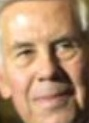

1/1 [==============================] - 2s 2s/step
2 Richard_Lugar_0001_face_0.jpg Richard_Lugar_0001_face_0 0.6347670139538312
12438


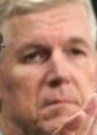

1/1 [==============================] - 2s 2s/step
3 Richard_Myers_0001_face_0.jpg Richard_Myers_0001_face_0 0.6238692465496003
12439


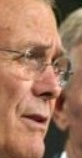

1/1 [==============================] - 2s 2s/step
4 Richard_Myers_0001_face_1.jpg Richard_Myers_0001_face_1 0.5040783725743032
Processing images 12441 to 12445 out of 1000 selected.
12440


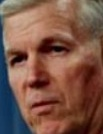

1/1 [==============================] - 2s 2s/step
0 Richard_Myers_0002_face_0.jpg Richard_Myers_0002_face_0 0.6044070006045579
12441


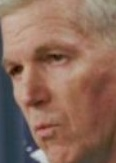

1/1 [==============================] - 1s 1s/step
1 Richard_Myers_0003_face_0.jpg Richard_Myers_0003_face_0 0.5086901872508826
12442


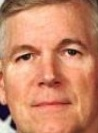

1/1 [==============================] - 1s 1s/step
2 Richard_Myers_0004_face_0.jpg Richard_Myers_0004_face_0 0.1583082351494321
12443


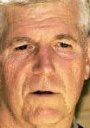

1/1 [==============================] - 1s 1s/step
3 Richard_Myers_0005_face_0.jpg Richard_Myers_0005_face_0 0.7559620834920158
12444


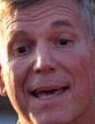

1/1 [==============================] - 1s 1s/step
4 Richard_Myers_0006_face_0.jpg Richard_Myers_0006_face_0 0.2777457396558931
Processing images 12446 to 12450 out of 1000 selected.
12445


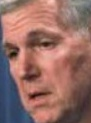

1/1 [==============================] - 1s 1s/step
0 Richard_Myers_0007_face_0.jpg Richard_Myers_0007_face_0 0.44188559148280965
12446


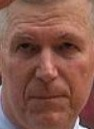

1/1 [==============================] - 2s 2s/step
1 Richard_Myers_0008_face_0.jpg Richard_Myers_0008_face_0 0.5108076510334741
12447


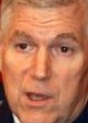

1/1 [==============================] - 2s 2s/step
2 Richard_Myers_0009_face_0.jpg Richard_Myers_0009_face_0 0.5040213576899047
12448


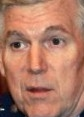

1/1 [==============================] - 2s 2s/step
3 Richard_Myers_0010_face_0.jpg Richard_Myers_0010_face_0 0.7526690864580277
12449


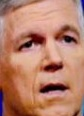

1/1 [==============================] - 2s 2s/step
4 Richard_Myers_0011_face_0.jpg Richard_Myers_0011_face_0 0.4082195216316629
Processing images 12451 to 12455 out of 1000 selected.
12450


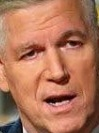

1/1 [==============================] - 1s 1s/step
0 Richard_Myers_0012_face_0.jpg Richard_Myers_0012_face_0 0.5237709453255831
12451


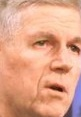

1/1 [==============================] - 1s 1s/step
1 Richard_Myers_0013_face_0.jpg Richard_Myers_0013_face_0 0.006217181024486952
12452


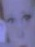

1/1 [==============================] - 1s 1s/step
2 Richard_Myers_0013_face_1.jpg Richard_Myers_0013_face_1 0.29357506460488253
12453


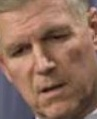

1/1 [==============================] - 1s 1s/step
3 Richard_Myers_0014_face_0.jpg Richard_Myers_0014_face_0 0.44119389049023766
12454


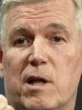

1/1 [==============================] - 1s 1s/step
4 Richard_Myers_0015_face_0.jpg Richard_Myers_0015_face_0 0.45894812455148076
Processing images 12456 to 12460 out of 1000 selected.
12455


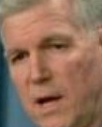

1/1 [==============================] - 1s 1s/step
0 Richard_Myers_0016_face_0.jpg Richard_Myers_0016_face_0 0.29211943351706793
12456


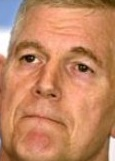

1/1 [==============================] - 1s 1s/step
1 Richard_Myers_0017_face_0.jpg Richard_Myers_0017_face_0 0.19314908172386677
12457


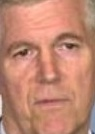

1/1 [==============================] - 2s 2s/step
2 Richard_Myers_0018_face_0.jpg Richard_Myers_0018_face_0 0.5393211566172966
12458


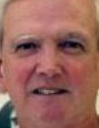

1/1 [==============================] - 2s 2s/step
3 Richard_Naughton_0001_face_0.jpg Richard_Naughton_0001_face_0 0.2084750014891733
12459


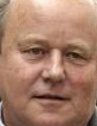

1/1 [==============================] - 3s 3s/step
4 Richard_Norton-Taylor_0001_face_0.jpg Richard_Norton-Taylor_0001_face_0 0.5833051457570132
Processing images 12461 to 12465 out of 1000 selected.
12460


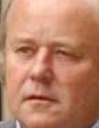

1/1 [==============================] - 1s 1s/step
0 Richard_Norton-Taylor_0002_face_0.jpg Richard_Norton-Taylor_0002_face_0 0.29623282640460524
12461


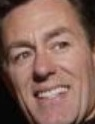

1/1 [==============================] - 1s 1s/step
1 Richard_Palmer_0001_face_0.jpg Richard_Palmer_0001_face_0 0.6778224962212238
12462


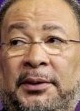

1/1 [==============================] - 1s 1s/step
2 Richard_Parsons_0001_face_0.jpg Richard_Parsons_0001_face_0 0.21434392896136123
12463


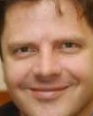

1/1 [==============================] - 1s 1s/step
3 Richard_Paul_Evans_0001_face_0.jpg Richard_Paul_Evans_0001_face_0 0.5754730259381908
12464


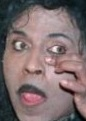

1/1 [==============================] - 2s 2s/step
4 Richard_Penniman_0001_face_0.jpg Richard_Penniman_0001_face_0 0.10509664857829676
Processing images 12466 to 12470 out of 1000 selected.
12465


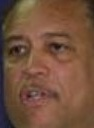

1/1 [==============================] - 2s 2s/step
0 Richard_Pennington_0001_face_0.jpg Richard_Pennington_0001_face_0 0.728972608162168
12466


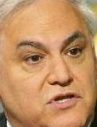

1/1 [==============================] - 2s 2s/step
1 Richard_Perle_0001_face_0.jpg Richard_Perle_0001_face_0 0.6187710390108891
12467


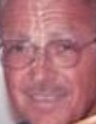

1/1 [==============================] - 1s 1s/step
2 Richard_Regenhard_0001_face_0.jpg Richard_Regenhard_0001_face_0 0.3783297597029379
12468


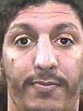

1/1 [==============================] - 1s 1s/step
3 Richard_Reid_0001_face_0.jpg Richard_Reid_0001_face_0 0.4278607036645038
12469


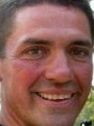

1/1 [==============================] - 1s 1s/step
4 Richard_Rodriguez_0001_face_0.jpg Richard_Rodriguez_0001_face_0 0.5645946556317519
Processing images 12471 to 12475 out of 1000 selected.
12470


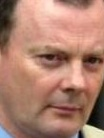

1/1 [==============================] - 1s 1s/step
0 Richard_Sambrook_0001_face_0.jpg Richard_Sambrook_0001_face_0 0.27117440873540827
12471


1/1 [==============================] - 1s 1s/step
1 Richard_Sambrook_0001_face_1.jpg Richard_Sambrook_0001_face_1 0.6778435942651498
12472


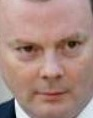

1/1 [==============================] - 1s 1s/step
2 Richard_Sambrook_0002_face_0.jpg Richard_Sambrook_0002_face_0 0.6598850447088178
12473


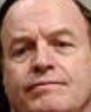

1/1 [==============================] - 2s 2s/step
3 Richard_Shelby_0001_face_0.jpg Richard_Shelby_0001_face_0 0.6258107317769274
12474


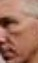

1/1 [==============================] - 2s 2s/step
4 Richard_Shelby_0001_face_1.jpg Richard_Shelby_0001_face_1 0.35655113990650256
Processing images 12476 to 12480 out of 1000 selected.
12475


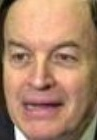

1/1 [==============================] - 2s 2s/step
0 Richard_Shelby_0002_face_0.jpg Richard_Shelby_0002_face_0 0.438966511125223
12476


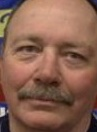

1/1 [==============================] - 1s 1s/step
1 Richard_Sterner_0001_face_0.jpg Richard_Sterner_0001_face_0 0.5043046104447028
12477


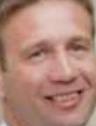

1/1 [==============================] - 1s 1s/step
2 Richard_Tubb_0001_face_0.jpg Richard_Tubb_0001_face_0 0.12586327283846405
12478


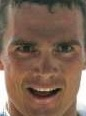

1/1 [==============================] - 1s 1s/step
3 Richard_Virenque_0001_face_0.jpg Richard_Virenque_0001_face_0 0.28999382614151953
12479


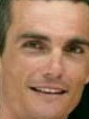

1/1 [==============================] - 1s 1s/step
4 Richard_Virenque_0002_face_0.jpg Richard_Virenque_0002_face_0 0.6515944133072306
Processing images 12481 to 12485 out of 1000 selected.
12480


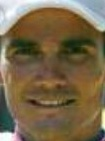

1/1 [==============================] - 1s 1s/step
0 Richard_Virenque_0003_face_0.jpg Richard_Virenque_0003_face_0 0.04725297457201902
12481


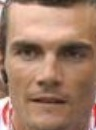

1/1 [==============================] - 1s 1s/step
1 Richard_Virenque_0004_face_0.jpg Richard_Virenque_0004_face_0 0.4553754802120743
12482


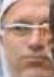

1/1 [==============================] - 2s 2s/step
2 Richard_Virenque_0004_face_1.jpg Richard_Virenque_0004_face_1 0.3933002678443091
12483


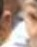

1/1 [==============================] - 2s 2s/step
3 Richard_Virenque_0004_face_2.jpg Richard_Virenque_0004_face_2 0.25874731001066975
12484


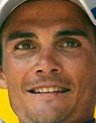

1/1 [==============================] - 2s 2s/step
4 Richard_Virenque_0005_face_0.jpg Richard_Virenque_0005_face_0 0.37250220736654294
Processing images 12486 to 12490 out of 1000 selected.
12485


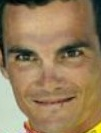

1/1 [==============================] - 1s 1s/step
0 Richard_Virenque_0006_face_0.jpg Richard_Virenque_0006_face_0 0.744716535795965
12486


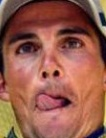

1/1 [==============================] - 2s 2s/step
1 Richard_Virenque_0007_face_0.jpg Richard_Virenque_0007_face_0 0.6902760995205379
12487


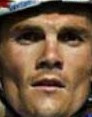

1/1 [==============================] - 1s 1s/step
2 Richard_Virenque_0008_face_0.jpg Richard_Virenque_0008_face_0 0.3683301889032727
12488


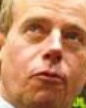

1/1 [==============================] - 1s 1s/step
3 Richard_Ward_0001_face_0.jpg Richard_Ward_0001_face_0 0.4754135791210428
12489


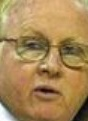

1/1 [==============================] - 1s 1s/step
4 Richie_Adubato_0001_face_0.jpg Richie_Adubato_0001_face_0 0.20234877666400594
Processing images 12491 to 12495 out of 1000 selected.
12490


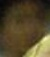

1/1 [==============================] - 1s 1s/step
0 Richie_Adubato_0001_face_1.jpg Richie_Adubato_0001_face_1 0.21669952837116513
12491


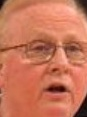

1/1 [==============================] - 1s 1s/step
1 Richie_Adubato_0002_face_0.jpg Richie_Adubato_0002_face_0 0.486687755219647
12492


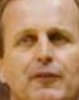

1/1 [==============================] - 2s 2s/step
2 Rick_Barnes_0001_face_0.jpg Rick_Barnes_0001_face_0 0.5727328895105136
12493


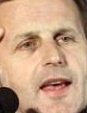

1/1 [==============================] - 2s 2s/step
3 Rick_Barnes_0002_face_0.jpg Rick_Barnes_0002_face_0 0.4257847407741456
12494


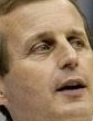

1/1 [==============================] - 1s 1s/step
4 Rick_Barnes_0003_face_0.jpg Rick_Barnes_0003_face_0 0.2939901320686185
Processing images 12496 to 12500 out of 1000 selected.
12495


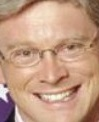

1/1 [==============================] - 1s 1s/step
0 Rick_Bland_0001_face_0.jpg Rick_Bland_0001_face_0 0.5264341315053978
12496


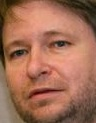

1/1 [==============================] - 1s 1s/step
1 Rick_Bragg_0001_face_0.jpg Rick_Bragg_0001_face_0 0.6248667315591442
12497


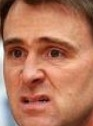

1/1 [==============================] - 1s 1s/step
2 Rick_Carlisle_0001_face_0.jpg Rick_Carlisle_0001_face_0 0.08071240342729104
12498


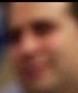

1/1 [==============================] - 1s 1s/step
3 Rick_Carlisle_0001_face_1.jpg Rick_Carlisle_0001_face_1 0.4439578221806466
12499


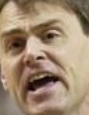

1/1 [==============================] - 1s 1s/step
4 Rick_Carlisle_0002_face_0.jpg Rick_Carlisle_0002_face_0 0.6113675125343374
Processing images 12501 to 12505 out of 1000 selected.
12500


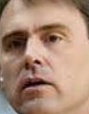

1/1 [==============================] - 2s 2s/step
0 Rick_Carlisle_0003_face_0.jpg Rick_Carlisle_0003_face_0 0.19912692760941883
12501


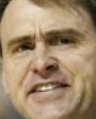

1/1 [==============================] - 2s 2s/step
1 Rick_Carlisle_0004_face_0.jpg Rick_Carlisle_0004_face_0 0.7783418291766111
12502


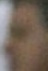

1/1 [==============================] - 2s 2s/step
2 Rick_Carlisle_0004_face_1.jpg Rick_Carlisle_0004_face_1 0.4101264750737012
12503


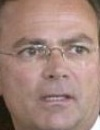

1/1 [==============================] - 1s 1s/step
3 Rick_Caruso_0001_face_0.jpg Rick_Caruso_0001_face_0 0.7301411601971605
12504


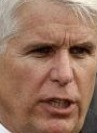

1/1 [==============================] - 1s 1s/step
4 Rick_Dinse_0001_face_0.jpg Rick_Dinse_0001_face_0 0.17326736399743928
Processing images 12506 to 12510 out of 1000 selected.
12505


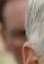

1/1 [==============================] - 2s 2s/step
0 Rick_Dinse_0001_face_1.jpg Rick_Dinse_0001_face_1 0.44925219362597607
12506


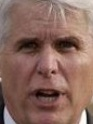

1/1 [==============================] - 1s 1s/step
1 Rick_Dinse_0002_face_0.jpg Rick_Dinse_0002_face_0 0.2702496487229146
12507


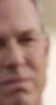

1/1 [==============================] - 1s 1s/step
2 Rick_Dinse_0002_face_1.jpg Rick_Dinse_0002_face_1 0.22690729082900196
12508


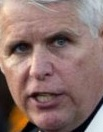

1/1 [==============================] - 1s 1s/step
3 Rick_Dinse_0003_face_0.jpg Rick_Dinse_0003_face_0 0.3433764653644842
12509


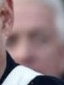

1/1 [==============================] - 1s 1s/step
4 Rick_Dinse_0003_face_1.jpg Rick_Dinse_0003_face_1 0.2048168542131927
Processing images 12511 to 12515 out of 1000 selected.
12510


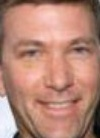

1/1 [==============================] - 2s 2s/step
0 Rick_Husband_0001_face_0.jpg Rick_Husband_0001_face_0 0.04594800568320491
12511


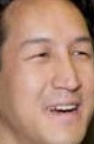

1/1 [==============================] - 2s 2s/step
1 Rick_Lu_0001_face_0.jpg Rick_Lu_0001_face_0 0.342946966492692
12512


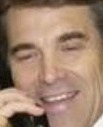

1/1 [==============================] - 1s 1s/step
2 Rick_Perry_0001_face_0.jpg Rick_Perry_0001_face_0 0.5786546949400974
12513


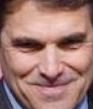

1/1 [==============================] - 1s 1s/step
3 Rick_Perry_0002_face_0.jpg Rick_Perry_0002_face_0 -0.07212816434505395
12514


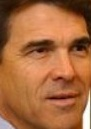

1/1 [==============================] - 1s 1s/step
4 Rick_Perry_0003_face_0.jpg Rick_Perry_0003_face_0 -0.05525233545417018
Processing images 12516 to 12520 out of 1000 selected.
12515


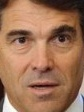

1/1 [==============================] - 1s 1s/step
0 Rick_Perry_0004_face_0.jpg Rick_Perry_0004_face_0 0.45102703264948385
12516


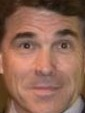

1/1 [==============================] - 1s 1s/step
1 Rick_Perry_0005_face_0.jpg Rick_Perry_0005_face_0 0.16850660747160337
12517


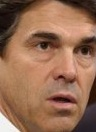

1/1 [==============================] - 1s 1s/step
2 Rick_Perry_0006_face_0.jpg Rick_Perry_0006_face_0 0.1424722856490198
12518


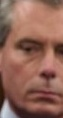

1/1 [==============================] - 2s 2s/step
3 Rick_Perry_0006_face_1.jpg Rick_Perry_0006_face_1 0.4482923941173841
12519


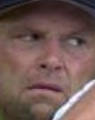

1/1 [==============================] - 2s 2s/step
4 Rick_Reed_0001_face_0.jpg Rick_Reed_0001_face_0 0.6075003439274741
Processing images 12521 to 12525 out of 1000 selected.
12520


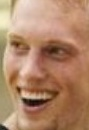

1/1 [==============================] - 2s 2s/step
0 Rick_Rickert_0001_face_0.jpg Rick_Rickert_0001_face_0 0.6728739274599914
12521


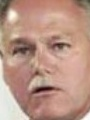

1/1 [==============================] - 1s 1s/step
1 Rick_Romley_0001_face_0.jpg Rick_Romley_0001_face_0 0.2971918968453704
12522


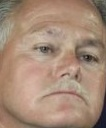

1/1 [==============================] - 1s 1s/step
2 Rick_Romley_0002_face_0.jpg Rick_Romley_0002_face_0 0.6513342004289066
12523


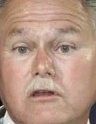

1/1 [==============================] - 1s 1s/step
3 Rick_Romley_0003_face_0.jpg Rick_Romley_0003_face_0 0.5563064900977186
12524


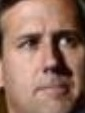

1/1 [==============================] - 2s 2s/step
4 Rick_Santorum_0001_face_0.jpg Rick_Santorum_0001_face_0 0.5968667418313625
Processing images 12526 to 12530 out of 1000 selected.
12525


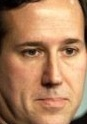

1/1 [==============================] - 1s 1s/step
0 Rick_Santorum_0002_face_0.jpg Rick_Santorum_0002_face_0 0.669036355850499
12526


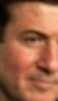

1/1 [==============================] - 1s 1s/step
1 Rick_Santorum_0002_face_1.jpg Rick_Santorum_0002_face_1 0.35024551966500755
12527


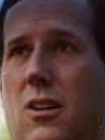

1/1 [==============================] - 2s 2s/step
2 Rick_Santorum_0003_face_0.jpg Rick_Santorum_0003_face_0 0.13967160356735756
12528


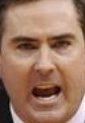

1/1 [==============================] - 2s 2s/step
3 Rick_Stansbury_0001_face_0.jpg Rick_Stansbury_0001_face_0 0.1871889374287359
12529


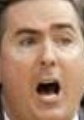

1/1 [==============================] - 2s 2s/step
4 Rick_Stansbury_0002_face_0.jpg Rick_Stansbury_0002_face_0 0.37436926305016244
Processing images 12531 to 12535 out of 1000 selected.
12530


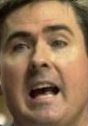

1/1 [==============================] - 1s 1s/step
0 Rick_Stansbury_0003_face_0.jpg Rick_Stansbury_0003_face_0 0.48866508889006266
12531


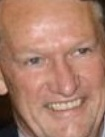

1/1 [==============================] - 1s 1s/step
1 Rick_Wagoner_0001_face_0.jpg Rick_Wagoner_0001_face_0 0.40107157048682096
12532


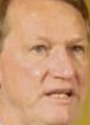

1/1 [==============================] - 2s 2s/step
2 Rick_Wagoner_0002_face_0.jpg Rick_Wagoner_0002_face_0 0.3995726760333734
12533


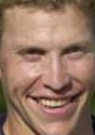

1/1 [==============================] - 1s 1s/step
3 Ricky_Barnes_0001_face_0.jpg Ricky_Barnes_0001_face_0 0.4420593968991826
12534


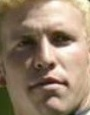

1/1 [==============================] - 1s 1s/step
4 Ricky_Barnes_0002_face_0.jpg Ricky_Barnes_0002_face_0 0.6358893896867691
Processing images 12536 to 12540 out of 1000 selected.
12535


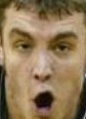

1/1 [==============================] - 1s 1s/step
0 Ricky_Cottrill_0001_face_0.jpg Ricky_Cottrill_0001_face_0 0.34605639567354085
12536


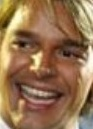

1/1 [==============================] - 1s 1s/step
1 Ricky_Martin_0001_face_0.jpg Ricky_Martin_0001_face_0 0.26102458509379106
12537


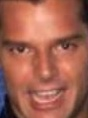

1/1 [==============================] - 2s 2s/step
2 Ricky_Martin_0002_face_0.jpg Ricky_Martin_0002_face_0 0.5080451503021606
12538


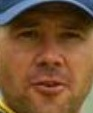

1/1 [==============================] - 2s 2s/step
3 Ricky_Ponting_0001_face_0.jpg Ricky_Ponting_0001_face_0 0.40400418326380094
12539


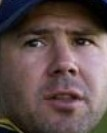

1/1 [==============================] - 2s 2s/step
4 Ricky_Ponting_0002_face_0.jpg Ricky_Ponting_0002_face_0 0.5334601829012904
Processing images 12541 to 12545 out of 1000 selected.
12540


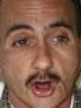

1/1 [==============================] - 1s 1s/step
0 Ricky_Quick_0001_face_0.jpg Ricky_Quick_0001_face_0 0.7961453541476842
12541


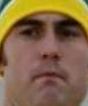

1/1 [==============================] - 1s 1s/step
1 Ricky_Ray_0001_face_0.jpg Ricky_Ray_0001_face_0 -0.03671740558436951
12542


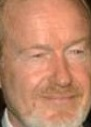

1/1 [==============================] - 1s 1s/step
2 Ridley_Scott_0001_face_0.jpg Ridley_Scott_0001_face_0 0.006308657468406706
12543


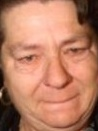

1/1 [==============================] - 1s 1s/step
3 Riek_Blanjaar_0001_face_0.jpg Riek_Blanjaar_0001_face_0 0.5560791985199584
12544


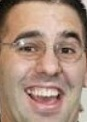

1/1 [==============================] - 1s 1s/step
4 Rien_Long_0001_face_0.jpg Rien_Long_0001_face_0 0.015680849656670253
Processing images 12546 to 12550 out of 1000 selected.
12545


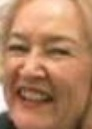

1/1 [==============================] - 2s 2s/step
0 Rina_Lazo_0001_face_0.jpg Rina_Lazo_0001_face_0 0.4555468983218795
12546


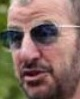

1/1 [==============================] - 2s 2s/step
1 Ringo_Starr_0001_face_0.jpg Ringo_Starr_0001_face_0 0.6620394199489458
12547


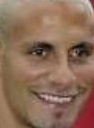

1/1 [==============================] - 2s 2s/step
2 Rio_Ferdinand_0001_face_0.jpg Rio_Ferdinand_0001_face_0 0.5007522964163345
12548


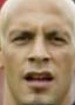

1/1 [==============================] - 2s 2s/step
3 Rio_Ferdinand_0002_face_0.jpg Rio_Ferdinand_0002_face_0 0.1655990387071094
12549


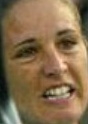

1/1 [==============================] - 1s 1s/step
4 Rita_Grande_0001_face_0.jpg Rita_Grande_0001_face_0 0.18585400802016694
Processing images 12551 to 12555 out of 1000 selected.
12550


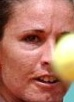

1/1 [==============================] - 1s 1s/step
0 Rita_Grande_0002_face_0.jpg Rita_Grande_0002_face_0 0.26009307085727823
12551


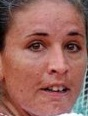

1/1 [==============================] - 2s 2s/step
1 Rita_Grande_0003_face_0.jpg Rita_Grande_0003_face_0 0.7242381068581627
12552


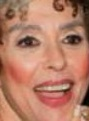

1/1 [==============================] - 1s 1s/step
2 Rita_Moreno_0001_face_0.jpg Rita_Moreno_0001_face_0 0.3598028977140058
12553


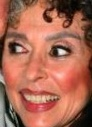

1/1 [==============================] - 1s 1s/step
3 Rita_Moreno_0002_face_0.jpg Rita_Moreno_0002_face_0 0.19107637287412665
12554


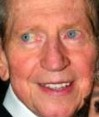

1/1 [==============================] - 2s 2s/step
4 Rita_Moreno_0002_face_1.jpg Rita_Moreno_0002_face_1 0.682849360147965
Processing images 12556 to 12560 out of 1000 selected.
12555


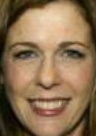

1/1 [==============================] - 2s 2s/step
0 Rita_Wilson_0001_face_0.jpg Rita_Wilson_0001_face_0 0.2228050946325844
12556


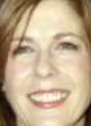

1/1 [==============================] - 2s 2s/step
1 Rita_Wilson_0002_face_0.jpg Rita_Wilson_0002_face_0 0.5695339288335127
12557


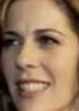

1/1 [==============================] - 2s 2s/step
2 Rita_Wilson_0003_face_0.jpg Rita_Wilson_0003_face_0 0.56411290207489
12558


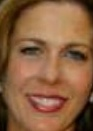

1/1 [==============================] - 1s 1s/step
3 Rita_Wilson_0004_face_0.jpg Rita_Wilson_0004_face_0 -0.10881237307097522
12559


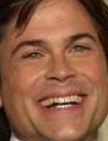

1/1 [==============================] - 2s 2s/step
4 Rob_Lowe_0001_face_0.jpg Rob_Lowe_0001_face_0 0.701698452169918
Processing images 12561 to 12565 out of 1000 selected.
12560


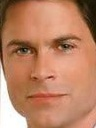

1/1 [==============================] - 1s 1s/step
0 Rob_Lowe_0002_face_0.jpg Rob_Lowe_0002_face_0 0.2859543895761791
12561


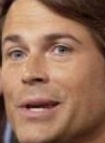

1/1 [==============================] - 1s 1s/step
1 Rob_Lowe_0003_face_0.jpg Rob_Lowe_0003_face_0 0.17483193287454346
12562


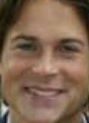

1/1 [==============================] - 1s 1s/step
2 Rob_Lowe_0004_face_0.jpg Rob_Lowe_0004_face_0 0.4443656533096303
12563


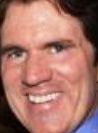

1/1 [==============================] - 2s 2s/step
3 Rob_Marshall_0001_face_0.jpg Rob_Marshall_0001_face_0 0.3115739566517879
12564


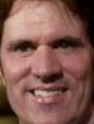

1/1 [==============================] - 2s 2s/step
4 Rob_Marshall_0002_face_0.jpg Rob_Marshall_0002_face_0 0.5401232225049281
Processing images 12566 to 12570 out of 1000 selected.
12565


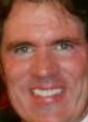

1/1 [==============================] - 2s 2s/step
0 Rob_Marshall_0003_face_0.jpg Rob_Marshall_0003_face_0 0.15730141777967724
12566


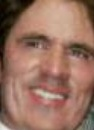

1/1 [==============================] - 2s 2s/step
1 Rob_Marshall_0004_face_0.jpg Rob_Marshall_0004_face_0 0.4174715596657267
12567


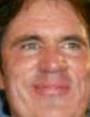

1/1 [==============================] - 1s 1s/step
2 Rob_Marshall_0005_face_0.jpg Rob_Marshall_0005_face_0 0.2056361141820674
12568


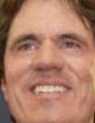

1/1 [==============================] - 1s 1s/step
3 Rob_Marshall_0006_face_0.jpg Rob_Marshall_0006_face_0 0.247762720017392
12569


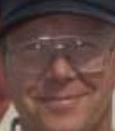

1/1 [==============================] - 1s 1s/step
4 Rob_Moore_0001_face_0.jpg Rob_Moore_0001_face_0 0.7008661888566039
Processing images 12571 to 12575 out of 1000 selected.
12570


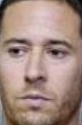

1/1 [==============================] - 1s 1s/step
0 Rob_Morrow_0001_face_0.jpg Rob_Morrow_0001_face_0 0.7241271152159887
12571


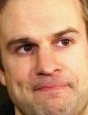

1/1 [==============================] - 1s 1s/step
1 Rob_Niedermayer_0001_face_0.jpg Rob_Niedermayer_0001_face_0 0.613166422319537
12572


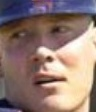

1/1 [==============================] - 2s 2s/step
2 Rob_Ramsay_0001_face_0.jpg Rob_Ramsay_0001_face_0 0.2744066129369541
12573


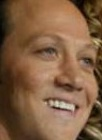

1/1 [==============================] - 2s 2s/step
3 Rob_Schneider_0001_face_0.jpg Rob_Schneider_0001_face_0 0.6104309471093758
12574


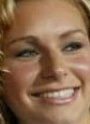

1/1 [==============================] - 2s 2s/step
4 Rob_Schneider_0001_face_1.jpg Rob_Schneider_0001_face_1 0.31908053910636425
Processing images 12576 to 12580 out of 1000 selected.
12575


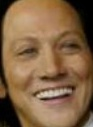

1/1 [==============================] - 1s 1s/step
0 Rob_Schneider_0002_face_0.jpg Rob_Schneider_0002_face_0 0.5975639664396175
12576


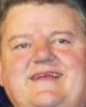

1/1 [==============================] - 1s 1s/step
1 Robbie_Coltrane_0001_face_0.jpg Robbie_Coltrane_0001_face_0 0.06131437762122363
12577


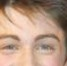

1/1 [==============================] - 1s 1s/step
2 Robbie_Coltrane_0001_face_1.jpg Robbie_Coltrane_0001_face_1 0.4690743189387898
12578


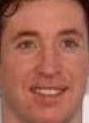

1/1 [==============================] - 2s 2s/step
3 Robbie_Fowler_0001_face_0.jpg Robbie_Fowler_0001_face_0 0.4158200381541235
12579


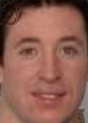

1/1 [==============================] - 1s 1s/step
4 Robbie_Fowler_0002_face_0.jpg Robbie_Fowler_0002_face_0 0.5371466076253455
Processing images 12581 to 12585 out of 1000 selected.
12580


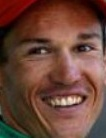

1/1 [==============================] - 1s 1s/step
0 Robbie_Mc_Ewen_0001_face_0.jpg Robbie_Mc_Ewen_0001_face_0 0.4187183297574422
12581


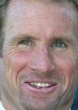

1/1 [==============================] - 2s 2s/step
1 Robbie_Naish_0001_face_0.jpg Robbie_Naish_0001_face_0 0.3092938772693053
12582


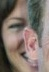

1/1 [==============================] - 2s 2s/step
2 Robbie_Naish_0001_face_1.jpg Robbie_Naish_0001_face_1 0.519298954546474
12583


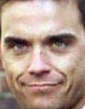

1/1 [==============================] - 2s 2s/step
3 Robbie_Williams_0001_face_0.jpg Robbie_Williams_0001_face_0 0.376197156771938
12584


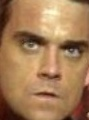

1/1 [==============================] - 1s 1s/step
4 Robbie_Williams_0002_face_0.jpg Robbie_Williams_0002_face_0 0.2269094992886507
Processing images 12586 to 12590 out of 1000 selected.
12585


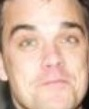

1/1 [==============================] - 1s 1s/step
0 Robbie_Williams_0003_face_0.jpg Robbie_Williams_0003_face_0 0.20927987584382818
12586


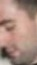

1/1 [==============================] - 2s 2s/step
1 Robbie_Williams_0003_face_1.jpg Robbie_Williams_0003_face_1 0.11067764442295479
12587


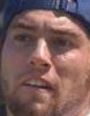

1/1 [==============================] - 2s 2s/step
2 Robby_Ginepri_0001_face_0.jpg Robby_Ginepri_0001_face_0 0.3084009179122769
12588


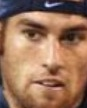

1/1 [==============================] - 2s 2s/step
3 Robby_Ginepri_0002_face_0.jpg Robby_Ginepri_0002_face_0 0.6519313565032192
12589


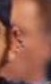

1/1 [==============================] - 2s 2s/step
4 Robby_Ginepri_0002_face_1.jpg Robby_Ginepri_0002_face_1 0.5584263507371446
Processing images 12591 to 12595 out of 1000 selected.
12590


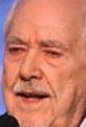

1/1 [==============================] - 2s 2s/step
0 Robert_Altman_0001_face_0.jpg Robert_Altman_0001_face_0 0.13523167061080985
12591


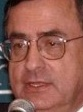

1/1 [==============================] - 1s 1s/step
1 Robert_Beck_0001_face_0.jpg Robert_Beck_0001_face_0 0.09192499443792297
12592


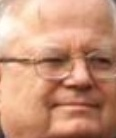

1/1 [==============================] - 1s 1s/step
2 Robert_Blackwill_0001_face_0.jpg Robert_Blackwill_0001_face_0 0.43693769742093774
12593


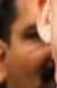

1/1 [==============================] - 1s 1s/step
3 Robert_Blackwill_0001_face_1.jpg Robert_Blackwill_0001_face_1 0.1601203354190972
12594


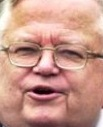

1/1 [==============================] - 1s 1s/step
4 Robert_Blackwill_0002_face_0.jpg Robert_Blackwill_0002_face_0 -0.08362930212083945
Processing images 12596 to 12600 out of 1000 selected.
12595


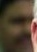

1/1 [==============================] - 1s 1s/step
0 Robert_Blackwill_0002_face_1.jpg Robert_Blackwill_0002_face_1 0.41652086917369674
12596


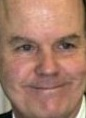

1/1 [==============================] - 1s 1s/step
1 Robert_Bonner_0001_face_0.jpg Robert_Bonner_0001_face_0 0.6863923685031127
12597


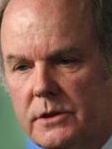

1/1 [==============================] - 2s 2s/step
2 Robert_Bonner_0002_face_0.jpg Robert_Bonner_0002_face_0 0.033880094263669815
12598


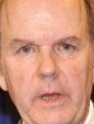

1/1 [==============================] - 2s 2s/step
3 Robert_Bonner_0003_face_0.jpg Robert_Bonner_0003_face_0 0.26095495340435454
12599


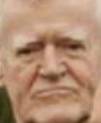

1/1 [==============================] - 2s 2s/step
4 Robert_Bullock_0001_face_0.jpg Robert_Bullock_0001_face_0 0.24925091565852192
Processing images 12601 to 12605 out of 1000 selected.
12600


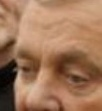

1/1 [==============================] - 1s 1s/step
0 Robert_Bullock_0001_face_1.jpg Robert_Bullock_0001_face_1 0.3475858402873449
12601


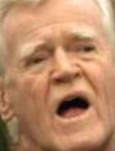

1/1 [==============================] - 1s 1s/step
1 Robert_Bullock_0002_face_0.jpg Robert_Bullock_0002_face_0 -0.0621742478597599
12602


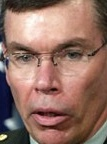

1/1 [==============================] - 1s 1s/step
2 Robert_DeFraites_0001_face_0.jpg Robert_DeFraites_0001_face_0 0.42808530589561294
12603


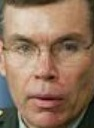

1/1 [==============================] - 1s 1s/step
3 Robert_DeFraites_0002_face_0.jpg Robert_DeFraites_0002_face_0 0.4914270625815881
12604


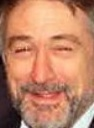

1/1 [==============================] - 1s 1s/step
4 Robert_De_Niro_0001_face_0.jpg Robert_De_Niro_0001_face_0 0.4288981191137341
Processing images 12606 to 12610 out of 1000 selected.
12605


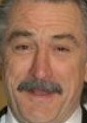

1/1 [==============================] - 2s 2s/step
0 Robert_De_Niro_0002_face_0.jpg Robert_De_Niro_0002_face_0 0.6138180033475289
12606


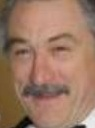

1/1 [==============================] - 2s 2s/step
1 Robert_De_Niro_0003_face_0.jpg Robert_De_Niro_0003_face_0 0.2752473311180711
12607


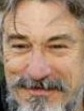

1/1 [==============================] - 2s 2s/step
2 Robert_De_Niro_0004_face_0.jpg Robert_De_Niro_0004_face_0 0.7397958041478205
12608


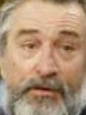

1/1 [==============================] - 1s 1s/step
3 Robert_De_Niro_0005_face_0.jpg Robert_De_Niro_0005_face_0 0.6683467395553252
12609


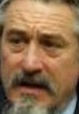

1/1 [==============================] - 2s 2s/step
4 Robert_De_Niro_0006_face_0.jpg Robert_De_Niro_0006_face_0 0.5167839906522848
Processing images 12611 to 12615 out of 1000 selected.
12610


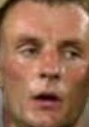

1/1 [==============================] - 1s 1s/step
0 Robert_Douglas_0001_face_0.jpg Robert_Douglas_0001_face_0 0.09995183251781509
12611


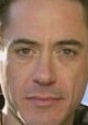

1/1 [==============================] - 1s 1s/step
1 Robert_Downey_Jr_0001_face_0.jpg Robert_Downey_Jr_0001_face_0 0.3830112367429077
12612


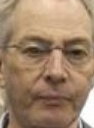

1/1 [==============================] - 1s 1s/step
2 Robert_Durst_0001_face_0.jpg Robert_Durst_0001_face_0 0.21078450703829832
12613


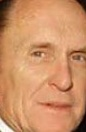

1/1 [==============================] - 3s 3s/step
3 Robert_Duvall_0001_face_0.jpg Robert_Duvall_0001_face_0 0.3259143076139624
12614


1/1 [==============================] - 2s 2s/step
4 Robert_Duvall_0001_face_1.jpg Robert_Duvall_0001_face_1 0.48969010470310803
Processing images 12616 to 12620 out of 1000 selected.
12615


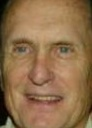

1/1 [==============================] - 2s 2s/step
0 Robert_Duvall_0002_face_0.jpg Robert_Duvall_0002_face_0 0.05211315729376354
12616


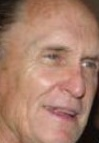

1/1 [==============================] - 2s 2s/step
1 Robert_Duvall_0003_face_0.jpg Robert_Duvall_0003_face_0 0.3308365400810532
12617


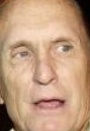

1/1 [==============================] - 1s 1s/step
2 Robert_Duvall_0004_face_0.jpg Robert_Duvall_0004_face_0 0.8531963514578934
12618


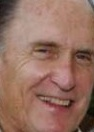

1/1 [==============================] - 1s 1s/step
3 Robert_Duvall_0005_face_0.jpg Robert_Duvall_0005_face_0 0.4642518611992351
12619


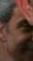

1/1 [==============================] - 1s 1s/step
4 Robert_Duvall_0005_face_1.jpg Robert_Duvall_0005_face_1 0.13991865419205507
Processing images 12621 to 12625 out of 1000 selected.
12620


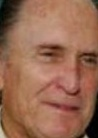

1/1 [==============================] - 1s 1s/step
0 Robert_Duvall_0006_face_0.jpg Robert_Duvall_0006_face_0 0.19603338626723824
12621


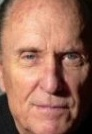

1/1 [==============================] - 1s 1s/step
1 Robert_Duvall_0007_face_0.jpg Robert_Duvall_0007_face_0 0.08820249276228168
12622


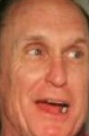

1/1 [==============================] - 2s 2s/step
2 Robert_Duvall_0008_face_0.jpg Robert_Duvall_0008_face_0 0.25454343680956304
12623


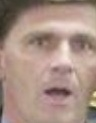

1/1 [==============================] - 2s 2s/step
3 Robert_Ehrlich_0001_face_0.jpg Robert_Ehrlich_0001_face_0 0.5841170023778095
12624


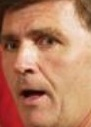

1/1 [==============================] - 2s 2s/step
4 Robert_Ehrlich_0002_face_0.jpg Robert_Ehrlich_0002_face_0 0.588128400149801
Processing images 12626 to 12630 out of 1000 selected.
12625


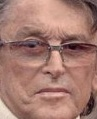

1/1 [==============================] - 1s 1s/step
0 Robert_Evans_0001_face_0.jpg Robert_Evans_0001_face_0 0.3587054734183894
12626


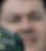

1/1 [==============================] - 1s 1s/step
1 Robert_Evans_0002_face_0.jpg Robert_Evans_0002_face_0 0.3428411284378078
12627


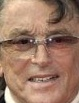

1/1 [==============================] - 1s 1s/step
2 Robert_Evans_0002_face_1.jpg Robert_Evans_0002_face_1 0.49368749887845315
12628


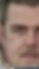

1/1 [==============================] - 3s 3s/step
3 Robert_Evans_0002_face_2.jpg Robert_Evans_0002_face_2 0.3465760519947417
12629


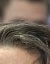

1/1 [==============================] - 1s 1s/step
4 Robert_Evans_0002_face_3.jpg Robert_Evans_0002_face_3 0.19210507144034508
Processing images 12631 to 12635 out of 1000 selected.
12630


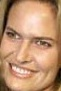

1/1 [==============================] - 2s 2s/step
0 Robert_Evans_0003_face_0.jpg Robert_Evans_0003_face_0 0.4934727407047136
12631


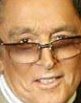

1/1 [==============================] - 2s 2s/step
1 Robert_Evans_0003_face_1.jpg Robert_Evans_0003_face_1 0.21442603220143897
12632


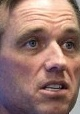

1/1 [==============================] - 2s 2s/step
2 Robert_F_Kennedy_Jr_0001_face_0.jpg Robert_F_Kennedy_Jr_0001_face_0 0.23798004601164693
12633


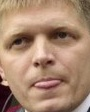

1/1 [==============================] - 1s 1s/step
3 Robert_Fico_0001_face_0.jpg Robert_Fico_0001_face_0 0.1315575455636595
12634


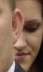

1/1 [==============================] - 1s 1s/step
4 Robert_Fico_0001_face_1.jpg Robert_Fico_0001_face_1 0.27884600618493316
Processing images 12636 to 12640 out of 1000 selected.
12635


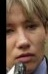

1/1 [==============================] - 1s 1s/step
0 Robert_Fico_0001_face_2.jpg Robert_Fico_0001_face_2 0.21206180745185804
12636


1/1 [==============================] - 1s 1s/step
1 Robert_Fico_0001_face_3.jpg Robert_Fico_0001_face_3 0.6187501289499182
12637


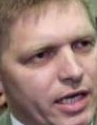

1/1 [==============================] - 1s 1s/step
2 Robert_Fico_0002_face_0.jpg Robert_Fico_0002_face_0 0.30046248132762143
12638


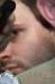

1/1 [==============================] - 1s 1s/step
3 Robert_Fico_0002_face_1.jpg Robert_Fico_0002_face_1 0.31358443844195666
12639


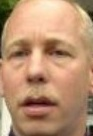

1/1 [==============================] - 2s 2s/step
4 Robert_Flodquist_0001_face_0.jpg Robert_Flodquist_0001_face_0 0.1360845857706468
Processing images 12641 to 12645 out of 1000 selected.
12640


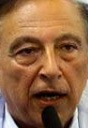

1/1 [==============================] - 2s 2s/step
0 Robert_Gallo_0001_face_0.jpg Robert_Gallo_0001_face_0 0.3091178682327132
12641


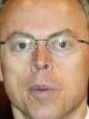

1/1 [==============================] - 2s 2s/step
1 Robert_Gordon_Card_0001_face_0.jpg Robert_Gordon_Card_0001_face_0 0.43509714558662665
12642


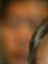

1/1 [==============================] - 1s 1s/step
2 Robert_Gordon_Card_0001_face_1.jpg Robert_Gordon_Card_0001_face_1 0.3282652736428714
12643


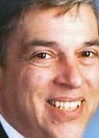

1/1 [==============================] - 1s 1s/step
3 Robert_Hanssen_0001_face_0.jpg Robert_Hanssen_0001_face_0 0.32022049113218276
12644


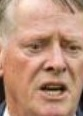

1/1 [==============================] - 1s 1s/step
4 Robert_Horan_0001_face_0.jpg Robert_Horan_0001_face_0 0.1742115815305306
Processing images 12646 to 12650 out of 1000 selected.
12645


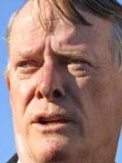

1/1 [==============================] - 1s 1s/step
0 Robert_Horan_0002_face_0.jpg Robert_Horan_0002_face_0 0.4872134331555611
12646


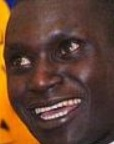

1/1 [==============================] - 1s 1s/step
1 Robert_Kipkoech_Cheruiyot_0001_face_0.jpg Robert_Kipkoech_Cheruiyot_0001_face_0 -0.10046604676093936
12647


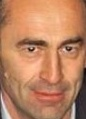

1/1 [==============================] - 2s 2s/step
2 Robert_Kocharian_0001_face_0.jpg Robert_Kocharian_0001_face_0 0.35387252459543456
12648


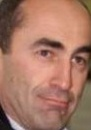

1/1 [==============================] - 2s 2s/step
3 Robert_Kocharian_0002_face_0.jpg Robert_Kocharian_0002_face_0 0.3759622304062819
12649


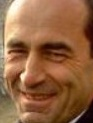

1/1 [==============================] - 2s 2s/step
4 Robert_Kocharian_0003_face_0.jpg Robert_Kocharian_0003_face_0 0.12874180486421993
Processing images 12651 to 12655 out of 1000 selected.
12650


1/1 [==============================] - 1s 1s/step
0 Robert_Kocharian_0003_face_1.jpg Robert_Kocharian_0003_face_1 0.352013800464238
12651


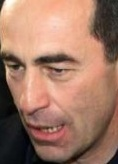

1/1 [==============================] - 2s 2s/step
1 Robert_Kocharian_0004_face_0.jpg Robert_Kocharian_0004_face_0 0.23904388968188345
12652


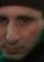

1/1 [==============================] - 1s 1s/step
2 Robert_Kocharian_0004_face_1.jpg Robert_Kocharian_0004_face_1 0.016488587176059125
12653


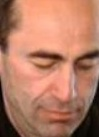

1/1 [==============================] - 1s 1s/step
3 Robert_Kocharian_0005_face_0.jpg Robert_Kocharian_0005_face_0 0.4677144724675278
12654


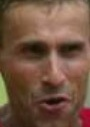

1/1 [==============================] - 1s 1s/step
4 Robert_Korzeniowski_0001_face_0.jpg Robert_Korzeniowski_0001_face_0 0.04331511636147975
Processing images 12656 to 12660 out of 1000 selected.
12655


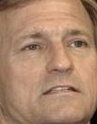

1/1 [==============================] - 3s 3s/step
0 Robert_Lange_0001_face_0.jpg Robert_Lange_0001_face_0 0.27692984447697766
12656


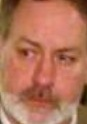

1/1 [==============================] - 2s 2s/step
1 Robert_Lee_Yates_Jr_0001_face_0.jpg Robert_Lee_Yates_Jr_0001_face_0 0.434042813326569
12657


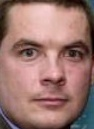

1/1 [==============================] - 2s 2s/step
2 Robert_Marshall_0001_face_0.jpg Robert_Marshall_0001_face_0 0.15429306403329196
12658


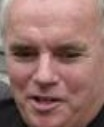

1/1 [==============================] - 1s 1s/step
3 Robert_McKee_0001_face_0.jpg Robert_McKee_0001_face_0 0.37288598629651726
12659


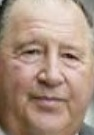

1/1 [==============================] - 1s 1s/step
4 Robert_Morvillo_0001_face_0.jpg Robert_Morvillo_0001_face_0 0.6079865575337088
Processing images 12661 to 12665 out of 1000 selected.
12660


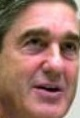

1/1 [==============================] - 1s 1s/step
0 Robert_Mueller_0001_face_0.jpg Robert_Mueller_0001_face_0 0.534595822089725
12661


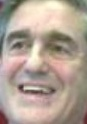

1/1 [==============================] - 1s 1s/step
1 Robert_Mueller_0002_face_0.jpg Robert_Mueller_0002_face_0 0.35016912613437917
12662


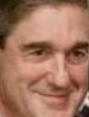

1/1 [==============================] - 2s 2s/step
2 Robert_Mueller_0003_face_0.jpg Robert_Mueller_0003_face_0 0.6340801993353342
12663


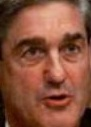

1/1 [==============================] - 2s 2s/step
3 Robert_Mueller_0004_face_0.jpg Robert_Mueller_0004_face_0 0.508734469914613
12664


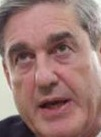

1/1 [==============================] - 2s 2s/step
4 Robert_Mueller_0005_face_0.jpg Robert_Mueller_0005_face_0 0.43103357919888163
Processing images 12666 to 12670 out of 1000 selected.
12665


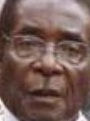

1/1 [==============================] - 1s 1s/step
0 Robert_Mugabe_0001_face_0.jpg Robert_Mugabe_0001_face_0 0.8098821851876347
12666


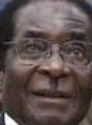

1/1 [==============================] - 1s 1s/step
1 Robert_Mugabe_0002_face_0.jpg Robert_Mugabe_0002_face_0 0.39221732002383153
12667


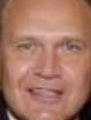

1/1 [==============================] - 1s 1s/step
2 Robert_Nardelli_0001_face_0.jpg Robert_Nardelli_0001_face_0 0.22890736329246322
12668


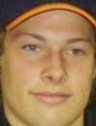

1/1 [==============================] - 1s 1s/step
3 Robert_Nillson_0001_face_0.jpg Robert_Nillson_0001_face_0 0.5375558004523566
12669


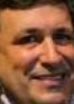

1/1 [==============================] - 1s 1s/step
4 Robert_Pollack_0001_face_0.jpg Robert_Pollack_0001_face_0 0.3513847371801334
Processing images 12671 to 12675 out of 1000 selected.
12670


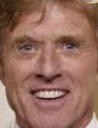

1/1 [==============================] - 1s 1s/step
0 Robert_Redford_0001_face_0.jpg Robert_Redford_0001_face_0 0.06863850227303513
12671


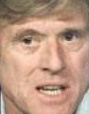

1/1 [==============================] - 2s 2s/step
1 Robert_Redford_0002_face_0.jpg Robert_Redford_0002_face_0 0.28793013869607725
12672


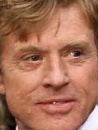

1/1 [==============================] - 2s 2s/step
2 Robert_Redford_0003_face_0.jpg Robert_Redford_0003_face_0 0.4064594327405984
12673


1/1 [==============================] - 2s 2s/step
3 Robert_Redford_0003_face_1.jpg Robert_Redford_0003_face_1 0.6661007086323475
12674


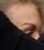

1/1 [==============================] - 2s 2s/step
4 Robert_Redford_0003_face_2.jpg Robert_Redford_0003_face_2 0.2619904867548158
Processing images 12676 to 12680 out of 1000 selected.
12675


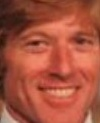

1/1 [==============================] - 1s 1s/step
0 Robert_Redford_0004_face_0.jpg Robert_Redford_0004_face_0 0.4577011127431991
12676


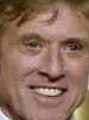

1/1 [==============================] - 1s 1s/step
1 Robert_Redford_0005_face_0.jpg Robert_Redford_0005_face_0 0.397357542099928
12677


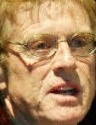

1/1 [==============================] - 1s 1s/step
2 Robert_Redford_0006_face_0.jpg Robert_Redford_0006_face_0 0.5162473763595534
12678


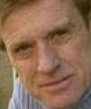

1/1 [==============================] - 2s 2s/step
3 Robert_Redford_0007_face_0.jpg Robert_Redford_0007_face_0 0.08811569401700102
12679


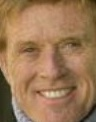

1/1 [==============================] - 1s 1s/step
4 Robert_Redford_0008_face_0.jpg Robert_Redford_0008_face_0 0.30033885205514677
Processing images 12681 to 12685 out of 1000 selected.
12680


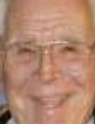

1/1 [==============================] - 2s 2s/step
0 Robert_Schuller_0001_face_0.jpg Robert_Schuller_0001_face_0 0.6996375196675355
12681


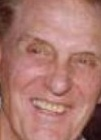

1/1 [==============================] - 2s 2s/step
1 Robert_Stack_0001_face_0.jpg Robert_Stack_0001_face_0 0.6685381089256415
12682


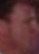

1/1 [==============================] - 2s 2s/step
2 Robert_Stack_0001_face_1.jpg Robert_Stack_0001_face_1 0.5438783816141323
12683


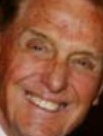

1/1 [==============================] - 1s 1s/step
3 Robert_Stack_0002_face_0.jpg Robert_Stack_0002_face_0 -0.25674041526476954
12684


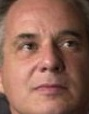

1/1 [==============================] - 1s 1s/step
4 Robert_Torricelli_0001_face_0.jpg Robert_Torricelli_0001_face_0 0.5161193051451155
Processing images 12686 to 12690 out of 1000 selected.
12685


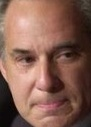

1/1 [==============================] - 1s 1s/step
0 Robert_Torricelli_0002_face_0.jpg Robert_Torricelli_0002_face_0 0.5839328017164265
12686


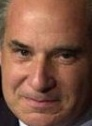

1/1 [==============================] - 1s 1s/step
1 Robert_Torricelli_0003_face_0.jpg Robert_Torricelli_0003_face_0 0.49833713019331266
12687


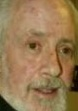

1/1 [==============================] - 2s 2s/step
2 Robert_Towne_0001_face_0.jpg Robert_Towne_0001_face_0 0.6105917015175832
12688


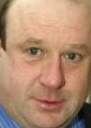

1/1 [==============================] - 2s 2s/step
3 Robert_Tyrrell_0001_face_0.jpg Robert_Tyrrell_0001_face_0 0.44153980074929444
12689


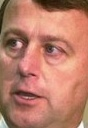

1/1 [==============================] - 2s 2s/step
4 Robert_Vowler_0001_face_0.jpg Robert_Vowler_0001_face_0 0.198964070822306
Processing images 12691 to 12695 out of 1000 selected.
12690


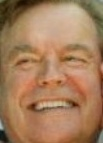

1/1 [==============================] - 1s 1s/step
0 Robert_Wagner_0001_face_0.jpg Robert_Wagner_0001_face_0 0.34913430987159716
12691


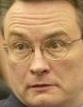

1/1 [==============================] - 1s 1s/step
1 Robert_Weitzel_0001_face_0.jpg Robert_Weitzel_0001_face_0 0.20845054039644179
12692


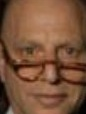

1/1 [==============================] - 1s 1s/step
2 Robert_Wiener_0001_face_0.jpg Robert_Wiener_0001_face_0 0.5113798181685644
12693


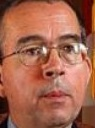

1/1 [==============================] - 2s 2s/step
3 Robert_Witt_0001_face_0.jpg Robert_Witt_0001_face_0 0.2712826665348318
12694


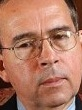

1/1 [==============================] - 1s 1s/step
4 Robert_Witt_0002_face_0.jpg Robert_Witt_0002_face_0 0.49593461240292913
Processing images 12696 to 12700 out of 1000 selected.
12695


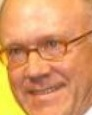

1/1 [==============================] - 2s 2s/step
0 Robert_Woody_Johnson_0001_face_0.jpg Robert_Woody_Johnson_0001_face_0 0.33124235575343486
12696


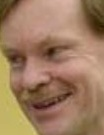

1/1 [==============================] - 2s 2s/step
1 Robert_Zoellick_0001_face_0.jpg Robert_Zoellick_0001_face_0 0.08241970238651543
12697


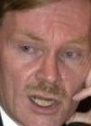

1/1 [==============================] - 2s 2s/step
2 Robert_Zoellick_0002_face_0.jpg Robert_Zoellick_0002_face_0 0.256772861305544
12698


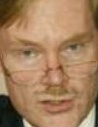

1/1 [==============================] - 1s 1s/step
3 Robert_Zoellick_0003_face_0.jpg Robert_Zoellick_0003_face_0 0.2982507559087344
12699


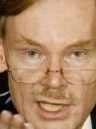

1/1 [==============================] - 1s 1s/step
4 Robert_Zoellick_0004_face_0.jpg Robert_Zoellick_0004_face_0 0.672788541467592
Processing images 12701 to 12705 out of 1000 selected.
12700


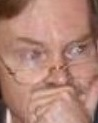

1/1 [==============================] - 1s 1s/step
0 Robert_Zoellick_0005_face_0.jpg Robert_Zoellick_0005_face_0 0.47714086637127956
12701


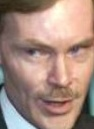

1/1 [==============================] - 2s 2s/step
1 Robert_Zoellick_0006_face_0.jpg Robert_Zoellick_0006_face_0 0.3273785745183914
12702


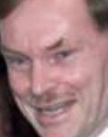

1/1 [==============================] - 2s 2s/step
2 Robert_Zoellick_0007_face_0.jpg Robert_Zoellick_0007_face_0 0.4840764067570187
12703


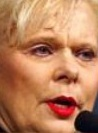

1/1 [==============================] - 2s 2s/step
3 Roberta_Combs_0001_face_0.jpg Roberta_Combs_0001_face_0 0.24321110041712954
12704


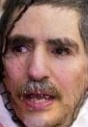

1/1 [==============================] - 2s 2s/step
4 Roberto_Arguelles_0001_face_0.jpg Roberto_Arguelles_0001_face_0 0.6142022499756891
Processing images 12706 to 12710 out of 1000 selected.
12705


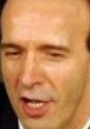

1/1 [==============================] - 2s 2s/step
0 Roberto_Benigni_0001_face_0.jpg Roberto_Benigni_0001_face_0 0.18657081602182668
12706


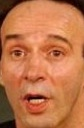

1/1 [==============================] - 1s 1s/step
1 Roberto_Benigni_0002_face_0.jpg Roberto_Benigni_0002_face_0 0.1403605943873276
12707


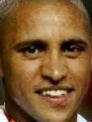

1/1 [==============================] - 1s 1s/step
2 Roberto_Carlos_0001_face_0.jpg Roberto_Carlos_0001_face_0 0.298169656120108
12708


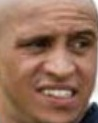

1/1 [==============================] - 1s 1s/step
3 Roberto_Carlos_0002_face_0.jpg Roberto_Carlos_0002_face_0 0.3144872986410801
12709


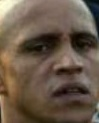

1/1 [==============================] - 2s 2s/step
4 Roberto_Carlos_0003_face_0.jpg Roberto_Carlos_0003_face_0 0.38023270947079796
Processing images 12711 to 12715 out of 1000 selected.
12710


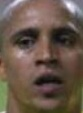

1/1 [==============================] - 2s 2s/step
0 Roberto_Carlos_0004_face_0.jpg Roberto_Carlos_0004_face_0 0.49943093309221626
12711


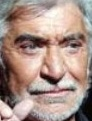

1/1 [==============================] - 2s 2s/step
1 Roberto_Cavalli_0001_face_0.jpg Roberto_Cavalli_0001_face_0 0.7265340469812414
12712


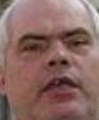

1/1 [==============================] - 2s 2s/step
2 Roberto_Cercelletta_0001_face_0.jpg Roberto_Cercelletta_0001_face_0 0.42393796141304785
12713


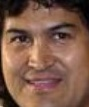

1/1 [==============================] - 2s 2s/step
3 Roberto_Guaterroma_0001_face_0.jpg Roberto_Guaterroma_0001_face_0 0.08610541579198264
12714


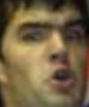

1/1 [==============================] - 1s 1s/step
4 Roberto_Laratro_0001_face_0.jpg Roberto_Laratro_0001_face_0 0.3876510524456072
Processing images 12716 to 12720 out of 1000 selected.
12715


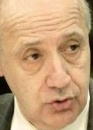

1/1 [==============================] - 1s 1s/step
0 Roberto_Lavagna_0001_face_0.jpg Roberto_Lavagna_0001_face_0 0.5476386355403917
12716


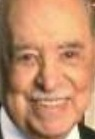

1/1 [==============================] - 1s 1s/step
1 Roberto_Marinho_0001_face_0.jpg Roberto_Marinho_0001_face_0 0.20054987567648813
12717


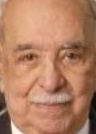

1/1 [==============================] - 1s 1s/step
2 Roberto_Marinho_0002_face_0.jpg Roberto_Marinho_0002_face_0 0.21358047274460357
12718


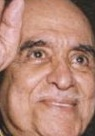

1/1 [==============================] - 2s 2s/step
3 Roberto_Marinho_0003_face_0.jpg Roberto_Marinho_0003_face_0 0.6124581489282129
12719


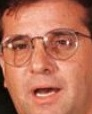

1/1 [==============================] - 2s 2s/step
4 Roberto_Robaina_0001_face_0.jpg Roberto_Robaina_0001_face_0 -0.2377877468723809
Processing images 12721 to 12725 out of 1000 selected.
12720


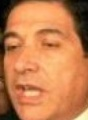

1/1 [==============================] - 2s 2s/step
0 Roberto_Tovar_0001_face_0.jpg Roberto_Tovar_0001_face_0 0.5434863606710391
12721


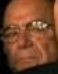

1/1 [==============================] - 1s 1s/step
1 Roberto_Tovar_0001_face_1.jpg Roberto_Tovar_0001_face_1 0.6874888756543823
12722


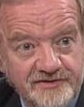

1/1 [==============================] - 1s 1s/step
2 Robin_Cook_0001_face_0.jpg Robin_Cook_0001_face_0 0.5925576848406039
12723


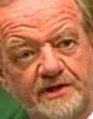

1/1 [==============================] - 1s 1s/step
3 Robin_Cook_0002_face_0.jpg Robin_Cook_0002_face_0 0.4500860334920244
12724


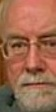

1/1 [==============================] - 2s 2s/step
4 Robin_Cook_0002_face_1.jpg Robin_Cook_0002_face_1 0.6234208656839062
Processing images 12726 to 12730 out of 1000 selected.
12725


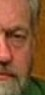

1/1 [==============================] - 2s 2s/step
0 Robin_Cook_0002_face_2.jpg Robin_Cook_0002_face_2 0.35345854430772494
12726


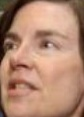

1/1 [==============================] - 2s 2s/step
1 Robin_Johansen_0001_face_0.jpg Robin_Johansen_0001_face_0 0.03761193951874336
12727


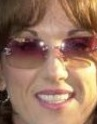

1/1 [==============================] - 1s 1s/step
2 Robin_McGraw_0001_face_0.jpg Robin_McGraw_0001_face_0 -0.2195698569845293
12728


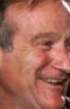

1/1 [==============================] - 2s 2s/step
3 Robin_McLaurin_Williams_0001_face_0.jpg Robin_McLaurin_Williams_0001_face_0 0.3073058129604993
12729


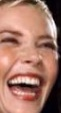

1/1 [==============================] - 1s 1s/step
4 Robin_McLaurin_Williams_0001_face_1.jpg Robin_McLaurin_Williams_0001_face_1 0.5081337854699447
Processing images 12731 to 12735 out of 1000 selected.
12730


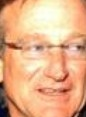

1/1 [==============================] - 1s 1s/step
0 Robin_McLaurin_Williams_0002_face_0.jpg Robin_McLaurin_Williams_0002_face_0 0.5717245228572969
12731


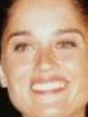

1/1 [==============================] - 1s 1s/step
1 Robin_Tunney_0001_face_0.jpg Robin_Tunney_0001_face_0 -0.024734873455205968
12732


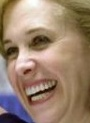

1/1 [==============================] - 3s 3s/step
2 Robin_Wagner_0001_face_0.jpg Robin_Wagner_0001_face_0 0.7178178727784713
12733


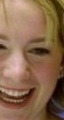

1/1 [==============================] - 2s 2s/step
3 Robin_Wagner_0001_face_1.jpg Robin_Wagner_0001_face_1 0.3831199934622276
12734


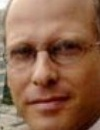

1/1 [==============================] - 2s 2s/step
4 Robin_Williams_0001_face_0.jpg Robin_Williams_0001_face_0 0.40795331607220287
Processing images 12736 to 12740 out of 1000 selected.
12735


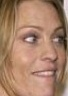

1/1 [==============================] - 1s 1s/step
0 Robin_Wright_Penn_0001_face_0.jpg Robin_Wright_Penn_0001_face_0 0.4600697732213239
12736


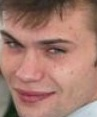

1/1 [==============================] - 1s 1s/step
1 Robinson_Stevenin_0001_face_0.jpg Robinson_Stevenin_0001_face_0 0.4333765642359517
12737


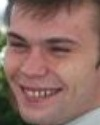

1/1 [==============================] - 1s 1s/step
2 Robinson_Stevenin_0002_face_0.jpg Robinson_Stevenin_0002_face_0 0.4025110673776456
12738


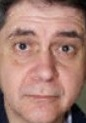

1/1 [==============================] - 1s 1s/step
3 Rocco_Buttiglione_0001_face_0.jpg Rocco_Buttiglione_0001_face_0 0.2931192358830189
12739


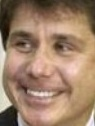

1/1 [==============================] - 2s 2s/step
4 Rod_Blagojevich_0001_face_0.jpg Rod_Blagojevich_0001_face_0 0.11757646097773902
Processing images 12741 to 12745 out of 1000 selected.
12740


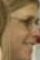

1/1 [==============================] - 2s 2s/step
0 Rod_Blagojevich_0001_face_1.jpg Rod_Blagojevich_0001_face_1 0.5347926214678851
12741


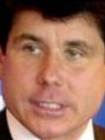

1/1 [==============================] - 2s 2s/step
1 Rod_Blagojevich_0002_face_0.jpg Rod_Blagojevich_0002_face_0 0.4254179708031231
12742


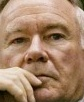

1/1 [==============================] - 2s 2s/step
2 Rod_Bryden_0001_face_0.jpg Rod_Bryden_0001_face_0 0.316190170496367
12743


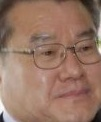

1/1 [==============================] - 2s 2s/step
3 Rod_Jong-il_0001_face_0.jpg Rod_Jong-il_0001_face_0 0.7437752408584875
12744


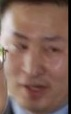

1/1 [==============================] - 1s 1s/step
4 Rod_Jong-il_0001_face_1.jpg Rod_Jong-il_0001_face_1 0.8701606542098723
Processing images 12746 to 12750 out of 1000 selected.
12745


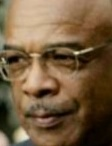

1/1 [==============================] - 1s 1s/step
0 Rod_Paige_0001_face_0.jpg Rod_Paige_0001_face_0 0.33588476808826945
12746


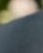

1/1 [==============================] - 1s 1s/step
1 Rod_Paige_0001_face_1.jpg Rod_Paige_0001_face_1 0.03994266607152124
12747


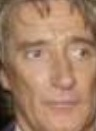

1/1 [==============================] - 3s 3s/step
2 Rod_Stewart_0001_face_0.jpg Rod_Stewart_0001_face_0 0.5515254882627736
12748


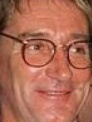

1/1 [==============================] - 2s 2s/step
3 Rod_Stewart_0002_face_0.jpg Rod_Stewart_0002_face_0 0.5823727916630479
12749


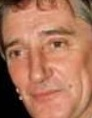

1/1 [==============================] - 2s 2s/step
4 Rod_Stewart_0003_face_0.jpg Rod_Stewart_0003_face_0 0.3337668577727564
Processing images 12751 to 12755 out of 1000 selected.
12750


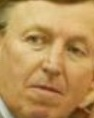

1/1 [==============================] - 1s 1s/step
0 Rod_Thorn_0001_face_0.jpg Rod_Thorn_0001_face_0 0.18521771062119335
12751


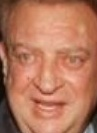

1/1 [==============================] - 1s 1s/step
1 Rodney_Dangerfield_0001_face_0.jpg Rodney_Dangerfield_0001_face_0 0.09421943889917912
12752


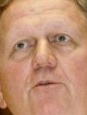

1/1 [==============================] - 1s 1s/step
2 Rodney_Rempt_0001_face_0.jpg Rodney_Rempt_0001_face_0 0.79919048834719
12753


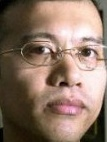

1/1 [==============================] - 2s 2s/step
3 Rodolfo_Abalos_0001_face_0.jpg Rodolfo_Abalos_0001_face_0 0.6331687941154729
12754


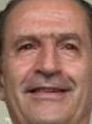

1/1 [==============================] - 2s 2s/step
4 Rodrigo_Borja_0001_face_0.jpg Rodrigo_Borja_0001_face_0 0.13355491850447085
Processing images 12756 to 12760 out of 1000 selected.
12755


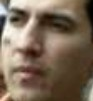

1/1 [==============================] - 2s 2s/step
0 Rodrigo_Borja_0002_face_0.jpg Rodrigo_Borja_0002_face_0 0.3788471939277829
12756


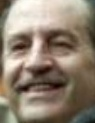

1/1 [==============================] - 2s 2s/step
1 Rodrigo_Borja_0002_face_1.jpg Rodrigo_Borja_0002_face_1 0.6282717672831754
12757
Failed to load image: /content/drive/MyDrive/thesis_directory/lfw/detected_faces/Rodrigo_Rato_0001_face_0.jpg
1/1 [==============================] - 1s 1s/step
2 Rodrigo_Rato_0001_face_0.jpg Rodrigo_Rato_0001_face_0 -0.06546741248206214
12758


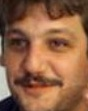

1/1 [==============================] - 1s 1s/step
3 Rodrigo_de_la_Cerna_0001_face_0.jpg Rodrigo_de_la_Cerna_0001_face_0 0.5877166311426258
12759


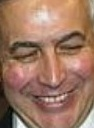

1/1 [==============================] - 1s 1s/step
4 Roel_Campos_0001_face_0.jpg Roel_Campos_0001_face_0 0.4162096614989598
Processing images 12761 to 12765 out of 1000 selected.
12760


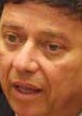

1/1 [==============================] - 1s 1s/step
0 Rogelio_Montemayor_0001_face_0.jpg Rogelio_Montemayor_0001_face_0 0.7844428408479693
12761


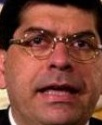

1/1 [==============================] - 1s 1s/step
1 Rogelio_Ramos_0001_face_0.jpg Rogelio_Ramos_0001_face_0 0.7989937567367456
12762


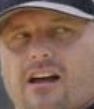

1/1 [==============================] - 2s 2s/step
2 Roger_Clemens_0001_face_0.jpg Roger_Clemens_0001_face_0 0.29749296775121187
12763


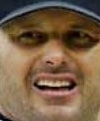

1/1 [==============================] - 2s 2s/step
3 Roger_Clemens_0002_face_0.jpg Roger_Clemens_0002_face_0 0.025741742910903923
12764


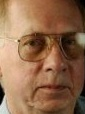

1/1 [==============================] - 2s 2s/step
4 Roger_Cook_0001_face_0.jpg Roger_Cook_0001_face_0 0.567427106155131
Processing images 12766 to 12770 out of 1000 selected.
12765


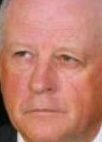

1/1 [==============================] - 1s 1s/step
0 Roger_Corbett_0001_face_0.jpg Roger_Corbett_0001_face_0 0.4187417663019595
12766


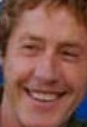

1/1 [==============================] - 2s 2s/step
1 Roger_Daltrey_0001_face_0.jpg Roger_Daltrey_0001_face_0 0.29134404603435204
12767


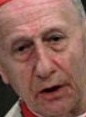

1/1 [==============================] - 1s 1s/step
2 Roger_Etchegaray_0001_face_0.jpg Roger_Etchegaray_0001_face_0 0.4280001175966858
12768


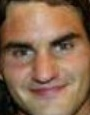

1/1 [==============================] - 1s 1s/step
3 Roger_Federer_0001_face_0.jpg Roger_Federer_0001_face_0 0.555730645206767
12769


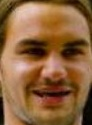

1/1 [==============================] - 1s 1s/step
4 Roger_Federer_0002_face_0.jpg Roger_Federer_0002_face_0 0.09346381870870991
Processing images 12771 to 12775 out of 1000 selected.
12770


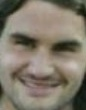

1/1 [==============================] - 2s 2s/step
0 Roger_Federer_0003_face_0.jpg Roger_Federer_0003_face_0 0.49257701761313455
12771


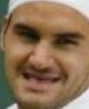

1/1 [==============================] - 2s 2s/step
1 Roger_Federer_0004_face_0.jpg Roger_Federer_0004_face_0 0.663487691705169
12772


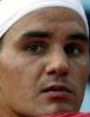

1/1 [==============================] - 2s 2s/step
2 Roger_Federer_0005_face_0.jpg Roger_Federer_0005_face_0 0.024816977766845574
12773


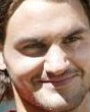

1/1 [==============================] - 2s 2s/step
3 Roger_Federer_0006_face_0.jpg Roger_Federer_0006_face_0 0.37512546042896205
12774


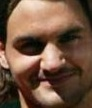

1/1 [==============================] - 2s 2s/step
4 Roger_Federer_0007_face_0.jpg Roger_Federer_0007_face_0 0.45719733366916215
Processing images 12776 to 12780 out of 1000 selected.
12775


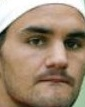

1/1 [==============================] - 1s 1s/step
0 Roger_Federer_0008_face_0.jpg Roger_Federer_0008_face_0 0.2966323241107111
12776


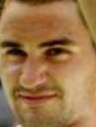

1/1 [==============================] - 1s 1s/step
1 Roger_Federer_0009_face_0.jpg Roger_Federer_0009_face_0 0.3484522813734866
12777


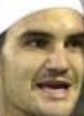

1/1 [==============================] - 1s 1s/step
2 Roger_Federer_0010_face_0.jpg Roger_Federer_0010_face_0 0.4037290728645185
12778


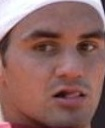

1/1 [==============================] - 2s 2s/step
3 Roger_Federer_0011_face_0.jpg Roger_Federer_0011_face_0 0.3698166400779937
12779


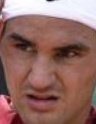

1/1 [==============================] - 1s 1s/step
4 Roger_Federer_0012_face_0.jpg Roger_Federer_0012_face_0 0.22036411973616343
Processing images 12781 to 12785 out of 1000 selected.
12780


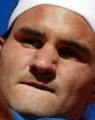

1/1 [==============================] - 2s 2s/step
0 Roger_Federer_0013_face_0.jpg Roger_Federer_0013_face_0 0.504618031411009
12781


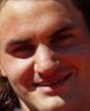

1/1 [==============================] - 2s 2s/step
1 Roger_Federer_0014_face_0.jpg Roger_Federer_0014_face_0 0.33496493919686876
12782


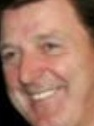

1/1 [==============================] - 2s 2s/step
2 Roger_Grimes_0001_face_0.jpg Roger_Grimes_0001_face_0 0.4949478583141944
12783


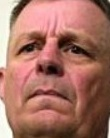

1/1 [==============================] - 1s 1s/step
3 Roger_King_0001_face_0.jpg Roger_King_0001_face_0 0.6338800639111065
12784


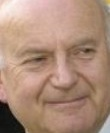

1/1 [==============================] - 1s 1s/step
4 Roger_Lyons_0001_face_0.jpg Roger_Lyons_0001_face_0 0.5525921640171826
Processing images 12786 to 12790 out of 1000 selected.
12785


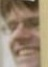

1/1 [==============================] - 2s 2s/step
0 Roger_Lyons_0001_face_1.jpg Roger_Lyons_0001_face_1 0.33851389559355777
12786


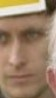

1/1 [==============================] - 1s 1s/step
1 Roger_Lyons_0001_face_2.jpg Roger_Lyons_0001_face_2 -0.12594212108116776
12787


1/1 [==============================] - 1s 1s/step
2 Roger_Lyons_0001_face_3.jpg Roger_Lyons_0001_face_3 0.17709664951103124
12788


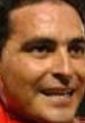

1/1 [==============================] - 2s 2s/step
3 Roger_Machado_0001_face_0.jpg Roger_Machado_0001_face_0 0.565978929531386
12789


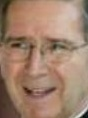

1/1 [==============================] - 2s 2s/step
4 Roger_Mahony_0001_face_0.jpg Roger_Mahony_0001_face_0 0.6374919104957418
Processing images 12791 to 12795 out of 1000 selected.
12790


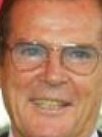

1/1 [==============================] - 2s 2s/step
0 Roger_Moore_0001_face_0.jpg Roger_Moore_0001_face_0 0.7007702817910789
12791


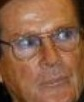

1/1 [==============================] - 1s 1s/step
1 Roger_Moore_0002_face_0.jpg Roger_Moore_0002_face_0 0.7269190826841383
12792


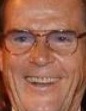

1/1 [==============================] - 1s 1s/step
2 Roger_Moore_0003_face_0.jpg Roger_Moore_0003_face_0 0.49032444651450735
12793


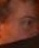

1/1 [==============================] - 2s 2s/step
3 Roger_Moore_0003_face_1.jpg Roger_Moore_0003_face_1 0.6065174722638021
12794


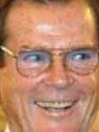

1/1 [==============================] - 1s 1s/step
4 Roger_Moore_0004_face_0.jpg Roger_Moore_0004_face_0 0.548954595614657
Processing images 12796 to 12800 out of 1000 selected.
12795


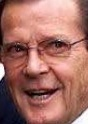

1/1 [==============================] - 1s 1s/step
0 Roger_Moore_0005_face_0.jpg Roger_Moore_0005_face_0 0.45316123413956033
12796


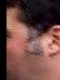

1/1 [==============================] - 1s 1s/step
1 Roger_Moore_0005_face_1.jpg Roger_Moore_0005_face_1 0.5692217633236955
12797


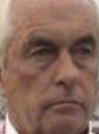

1/1 [==============================] - 3s 3s/step
2 Roger_Penske_0001_face_0.jpg Roger_Penske_0001_face_0 0.3788835680428748
12798


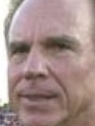

1/1 [==============================] - 2s 2s/step
3 Roger_Staubach_0001_face_0.jpg Roger_Staubach_0001_face_0 0.5568553205335736
12799


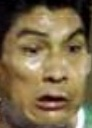

1/1 [==============================] - 2s 2s/step
4 Roger_Suarez_0001_face_0.jpg Roger_Suarez_0001_face_0 0.6457302272085278
Processing images 12801 to 12805 out of 1000 selected.
12800


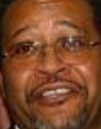

1/1 [==============================] - 2s 2s/step
0 Roger_Toussaint_0001_face_0.jpg Roger_Toussaint_0001_face_0 0.5840757209031344
12801


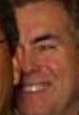

1/1 [==============================] - 1s 1s/step
1 Roger_Toussaint_0001_face_1.jpg Roger_Toussaint_0001_face_1 0.2456885528668243
12802


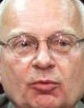

1/1 [==============================] - 1s 1s/step
2 Roger_Winter_0001_face_0.jpg Roger_Winter_0001_face_0 0.5921662204934244
12803


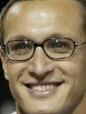

1/1 [==============================] - 1s 1s/step
3 Rogerio_Romero_0001_face_0.jpg Rogerio_Romero_0001_face_0 0.52130914065611
12804


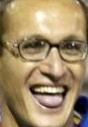

1/1 [==============================] - 1s 1s/step
4 Rogerio_Romero_0002_face_0.jpg Rogerio_Romero_0002_face_0 -0.034167725213973175
Processing images 12806 to 12810 out of 1000 selected.
12805


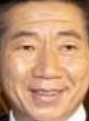

1/1 [==============================] - 1s 1s/step
0 Roh_Moo-hyun_0001_face_0.jpg Roh_Moo-hyun_0001_face_0 0.4602853211607944
12806


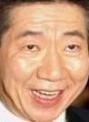

1/1 [==============================] - 2s 2s/step
1 Roh_Moo-hyun_0002_face_0.jpg Roh_Moo-hyun_0002_face_0 0.411643025069094
12807


1/1 [==============================] - 2s 2s/step
2 Roh_Moo-hyun_0002_face_1.jpg Roh_Moo-hyun_0002_face_1 -0.08291225990434219
12808


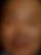

1/1 [==============================] - 2s 2s/step
3 Roh_Moo-hyun_0002_face_2.jpg Roh_Moo-hyun_0002_face_2 0.30316733231769205
12809


1/1 [==============================] - 1s 1s/step
4 Roh_Moo-hyun_0002_face_3.jpg Roh_Moo-hyun_0002_face_3 0.44117859888184235
Processing images 12811 to 12815 out of 1000 selected.
12810


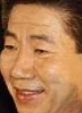

1/1 [==============================] - 1s 1s/step
0 Roh_Moo-hyun_0003_face_0.jpg Roh_Moo-hyun_0003_face_0 0.022116085819783967
12811


1/1 [==============================] - 1s 1s/step
1 Roh_Moo-hyun_0003_face_1.jpg Roh_Moo-hyun_0003_face_1 0.3480759922426891
12812


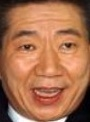

1/1 [==============================] - 2s 2s/step
2 Roh_Moo-hyun_0004_face_0.jpg Roh_Moo-hyun_0004_face_0 0.39112739101412447
12813


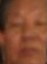

1/1 [==============================] - 1s 1s/step
3 Roh_Moo-hyun_0004_face_1.jpg Roh_Moo-hyun_0004_face_1 0.4065897571282033
12814


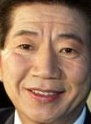

1/1 [==============================] - 2s 2s/step
4 Roh_Moo-hyun_0005_face_0.jpg Roh_Moo-hyun_0005_face_0 0.5697712023170278
Processing images 12816 to 12820 out of 1000 selected.
12815


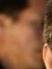

1/1 [==============================] - 1s 1s/step
0 Roh_Moo-hyun_0005_face_1.jpg Roh_Moo-hyun_0005_face_1 0.6011176365797121
12816


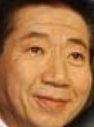

1/1 [==============================] - 2s 2s/step
1 Roh_Moo-hyun_0006_face_0.jpg Roh_Moo-hyun_0006_face_0 0.5540234367025291
12817


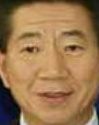

1/1 [==============================] - 1s 1s/step
2 Roh_Moo-hyun_0007_face_0.jpg Roh_Moo-hyun_0007_face_0 0.6209516115072005
12818


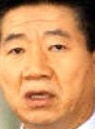

1/1 [==============================] - 1s 1s/step
3 Roh_Moo-hyun_0008_face_0.jpg Roh_Moo-hyun_0008_face_0 -0.01929537652063095
12819


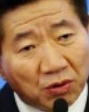

1/1 [==============================] - 2s 2s/step
4 Roh_Moo-hyun_0009_face_0.jpg Roh_Moo-hyun_0009_face_0 0.49573663579351446
Processing images 12821 to 12825 out of 1000 selected.
12820


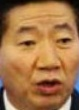

1/1 [==============================] - 1s 1s/step
0 Roh_Moo-hyun_0010_face_0.jpg Roh_Moo-hyun_0010_face_0 0.42104778596984394
12821


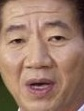

1/1 [==============================] - 1s 1s/step
1 Roh_Moo-hyun_0011_face_0.jpg Roh_Moo-hyun_0011_face_0 0.5070304575268302
12822


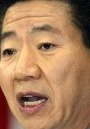

1/1 [==============================] - 1s 1s/step
2 Roh_Moo-hyun_0012_face_0.jpg Roh_Moo-hyun_0012_face_0 0.7263622652038468
12823


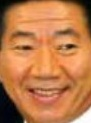

1/1 [==============================] - 2s 2s/step
3 Roh_Moo-hyun_0013_face_0.jpg Roh_Moo-hyun_0013_face_0 0.0568102557476474
12824


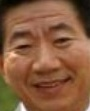

1/1 [==============================] - 2s 2s/step
4 Roh_Moo-hyun_0014_face_0.jpg Roh_Moo-hyun_0014_face_0 0.5825749762830067
Processing images 12826 to 12830 out of 1000 selected.
12825


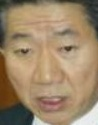

1/1 [==============================] - 2s 2s/step
0 Roh_Moo-hyun_0015_face_0.jpg Roh_Moo-hyun_0015_face_0 0.25369644079943904
12826


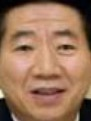

1/1 [==============================] - 1s 1s/step
1 Roh_Moo-hyun_0016_face_0.jpg Roh_Moo-hyun_0016_face_0 -0.26568491484375245
12827


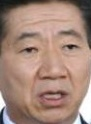

1/1 [==============================] - 2s 2s/step
2 Roh_Moo-hyun_0017_face_0.jpg Roh_Moo-hyun_0017_face_0 0.42008851694579197
12828


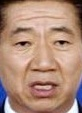

1/1 [==============================] - 1s 1s/step
3 Roh_Moo-hyun_0018_face_0.jpg Roh_Moo-hyun_0018_face_0 0.7968993659043793
12829


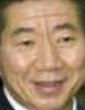

1/1 [==============================] - 2s 2s/step
4 Roh_Moo-hyun_0019_face_0.jpg Roh_Moo-hyun_0019_face_0 0.7072853034522855
Processing images 12831 to 12835 out of 1000 selected.
12830


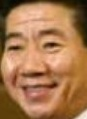

1/1 [==============================] - 2s 2s/step
0 Roh_Moo-hyun_0020_face_0.jpg Roh_Moo-hyun_0020_face_0 0.2152336187701706
12831


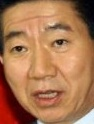

1/1 [==============================] - 2s 2s/step
1 Roh_Moo-hyun_0021_face_0.jpg Roh_Moo-hyun_0021_face_0 0.45602708132978087
12832


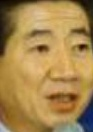

1/1 [==============================] - 1s 1s/step
2 Roh_Moo-hyun_0022_face_0.jpg Roh_Moo-hyun_0022_face_0 0.32402005262098926
12833


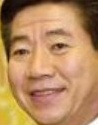

1/1 [==============================] - 1s 1s/step
3 Roh_Moo-hyun_0023_face_0.jpg Roh_Moo-hyun_0023_face_0 0.20225518051789726
12834


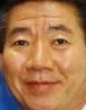

1/1 [==============================] - 2s 2s/step
4 Roh_Moo-hyun_0024_face_0.jpg Roh_Moo-hyun_0024_face_0 0.49995042396839345
Processing images 12836 to 12840 out of 1000 selected.
12835


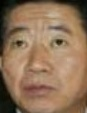

1/1 [==============================] - 2s 2s/step
0 Roh_Moo-hyun_0025_face_0.jpg Roh_Moo-hyun_0025_face_0 0.3803659293030171
12836


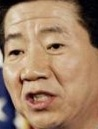

1/1 [==============================] - 1s 1s/step
1 Roh_Moo-hyun_0026_face_0.jpg Roh_Moo-hyun_0026_face_0 0.44927684005638857
12837


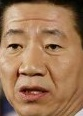

1/1 [==============================] - 1s 1s/step
2 Roh_Moo-hyun_0027_face_0.jpg Roh_Moo-hyun_0027_face_0 0.13740677542860089
12838


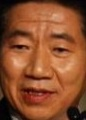

1/1 [==============================] - 2s 2s/step
3 Roh_Moo-hyun_0028_face_0.jpg Roh_Moo-hyun_0028_face_0 0.1232424799985174
12839


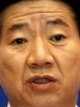

1/1 [==============================] - 2s 2s/step
4 Roh_Moo-hyun_0029_face_0.jpg Roh_Moo-hyun_0029_face_0 0.5719059211152249
Processing images 12841 to 12845 out of 1000 selected.
12840


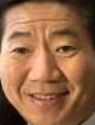

1/1 [==============================] - 2s 2s/step
0 Roh_Moo-hyun_0030_face_0.jpg Roh_Moo-hyun_0030_face_0 0.3034439681945241
12841


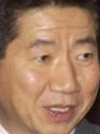

1/1 [==============================] - 1s 1s/step
1 Roh_Moo-hyun_0031_face_0.jpg Roh_Moo-hyun_0031_face_0 0.5538369935636628
12842


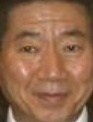

1/1 [==============================] - 2s 2s/step
2 Roh_Moo-hyun_0032_face_0.jpg Roh_Moo-hyun_0032_face_0 0.6539966389379088
12843


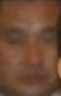

1/1 [==============================] - 1s 1s/step
3 Roh_Moo-hyun_0032_face_1.jpg Roh_Moo-hyun_0032_face_1 0.6306772731289503
12844


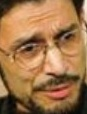

1/1 [==============================] - 2s 2s/step
4 Rohinton_Mistry_0001_face_0.jpg Rohinton_Mistry_0001_face_0 0.36076421042386647
Processing images 12846 to 12850 out of 1000 selected.
12845


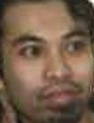

1/1 [==============================] - 2s 2s/step
0 Rohman_al-Ghozi_0001_face_0.jpg Rohman_al-Ghozi_0001_face_0 0.7332861435172674
12846


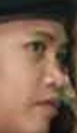

1/1 [==============================] - 1s 1s/step
1 Rohman_al-Ghozi_0001_face_1.jpg Rohman_al-Ghozi_0001_face_1 0.7816585994503159
12847


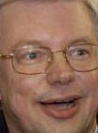

1/1 [==============================] - 1s 1s/step
2 Roland_Koch_0001_face_0.jpg Roland_Koch_0001_face_0 0.12753786271633444
12848


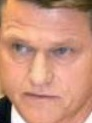

1/1 [==============================] - 1s 1s/step
3 Rolandas_Paksas_0001_face_0.jpg Rolandas_Paksas_0001_face_0 0.30337800521471464
12849


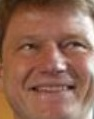

1/1 [==============================] - 2s 2s/step
4 Rolandas_Paksas_0002_face_0.jpg Rolandas_Paksas_0002_face_0 0.4682683165262928
Processing images 12851 to 12855 out of 1000 selected.
12850


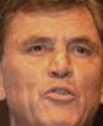

1/1 [==============================] - 2s 2s/step
0 Rolf_Eckrodt_0001_face_0.jpg Rolf_Eckrodt_0001_face_0 0.7947008604990962
12851


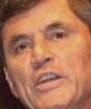

1/1 [==============================] - 1s 1s/step
1 Rolf_Eckrodt_0002_face_0.jpg Rolf_Eckrodt_0002_face_0 0.6243586222241589
12852


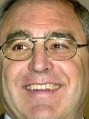

1/1 [==============================] - 1s 1s/step
2 Rolf_Zimmermann_0001_face_0.jpg Rolf_Zimmermann_0001_face_0 0.286918903939951
12853


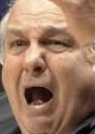

1/1 [==============================] - 2s 2s/step
3 Rollie_Massimino_0001_face_0.jpg Rollie_Massimino_0001_face_0 0.43960614328226
12854


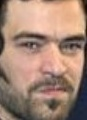

1/1 [==============================] - 1s 1s/step
4 Romain_Duris_0001_face_0.jpg Romain_Duris_0001_face_0 0.4126097087992898
Processing images 12856 to 12860 out of 1000 selected.
12855


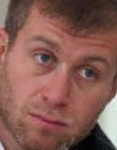

1/1 [==============================] - 2s 2s/step
0 Roman_Abramovich_0001_face_0.jpg Roman_Abramovich_0001_face_0 0.7021803127357298
12856


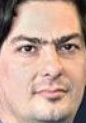

1/1 [==============================] - 1s 1s/step
1 Roman_Coppola_0001_face_0.jpg Roman_Coppola_0001_face_0 0.5558435299857559
12857


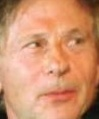

1/1 [==============================] - 2s 2s/step
2 Roman_Polanski_0001_face_0.jpg Roman_Polanski_0001_face_0 0.474834608350971
12858


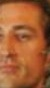

1/1 [==============================] - 1s 1s/step
3 Roman_Polanski_0001_face_1.jpg Roman_Polanski_0001_face_1 0.3129350030080668
12859


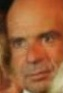

1/1 [==============================] - 1s 1s/step
4 Roman_Polanski_0001_face_2.jpg Roman_Polanski_0001_face_2 0.042985428821016414
Processing images 12861 to 12865 out of 1000 selected.
12860


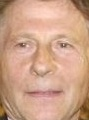

1/1 [==============================] - 2s 2s/step
0 Roman_Polanski_0002_face_0.jpg Roman_Polanski_0002_face_0 0.3232612899447258
12861


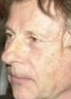

1/1 [==============================] - 1s 1s/step


In [ ]:
import pickle

# Specify the path to your folder
folder_path = '/content/drive/MyDrive/thesis_directory/lfw/detected_faces'
# Specify the path to save the dictionary

#file_path = '/content/drive/MyDrive/thesis_directory/embedd_dict.pkl'
file_path = '/content/drive/MyDrive/Final_thesis/a1_.pkl'

# Load the embeddings dictionary from the file
with open(file_path, 'rb') as file:
    embeddings_dict = pickle.load(file)


# Define the start and end indices for processing
start_index = 12000
end_index = 13000  # Process the first 200 images

# Call the function with the folder path, start and end indices
embeddings_dict = process_folder(folder_path, start_index, end_index, embeddings_dict, batch_size=5)


# Specify the path to save the dictionary
save_path = '/content/drive/MyDrive/thesis_directory/a1_.pkl'
#save_path = '/content/drive/MyDrive/Final_thesis/embedd_dict.pkl'
#save_path = '/content/drive/MyDrive/test_directory/embedd_dict.pkl'
# Save the embeddings_dict to a file using pickle
with open(save_path, 'wb') as file:
    pickle.dump(embeddings_dict, file)

# Print a message to confirm that the dictionary has been saved
print(f"Embeddings dictionary saved to {save_path}")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from itertools import combinations
import pickle

# Update the file path
file_path = '/content/drive/MyDrive/thesis_directory/a1_.pkl'

# Load the dictionary from the pickled file
with open(file_path, 'rb') as file:
    embeddings_dict = pickle.load(file)

# Initialize lists for embeddings, identities, and quality scores
emb = []
identity = []
quality = []

# Flatten the dictionary into lists
for id, data_list in embeddings_dict.items():
    for embedding, quality_score in data_list:
        emb.append(embedding)
        identity.append(id)
        quality.append(quality_score)

# Convert lists to numpy arrays
emb = np.array(emb)
identity = np.array(identity)
quality = np.array(quality)

def calculate_fnmr_from_roc(fpr, tpr, thresholds, fmr_threshold):
    # Find the FNMR value closest to the specified FMR threshold
    idx = np.argmin(np.abs(fpr - fmr_threshold))
    fnmr_value = 1 - tpr[idx]
    return fnmr_value

def simulate_rejection_curve(sorted_quality_scores, rejection_percentage):
    # Simulate rejection curve based on quality scores
    total_samples = len(sorted_quality_scores)
    rejected_samples = int(rejection_percentage * total_samples)
    remaining_samples = total_samples - rejected_samples
    return remaining_samples

def main():
    # Parameters
    iterations = 10
    rejection_step = 0.05
    fmr_threshold = 0.01

    # Data storage
    ratios = []
    fnmr_values = []

    # Unique identities
    unique_identities = np.unique(identity)

    for _ in range(iterations):
        rejection_percentage = min(rejection_step, 1.0)

        # Shuffle the unique identities to simulate different iterations
        np.random.shuffle(unique_identities)

        # Select a subset of identities for each iteration
        selected_identities = unique_identities[:int(rejection_percentage * len(unique_identities))]

        # Filter data for selected identities
        selected_indices = np.isin(identity, selected_identities)
        selected_quality_scores = quality[selected_indices]

        # Sort samples based on quality scores
        sorted_indices = np.argsort(selected_quality_scores)
        sorted_quality_scores = selected_quality_scores[sorted_indices]

        # Simulate rejection based on quality scores
        remaining_samples = simulate_rejection_curve(sorted_quality_scores, rejection_percentage)

        # Generate genuine and impostor scores
        genuine_scores, impostor_scores = generate_scores(remaining_samples)

        # Combine scores and labels for ROC curve
        scores = np.concatenate([genuine_scores, impostor_scores])
        labels = np.concatenate([np.ones_like(genuine_scores), np.zeros_like(impostor_scores)])

        # Calculate ROC curve
        fpr, tpr, thresholds = roc_curve(labels, scores)

        # Calculate FNMR at FMR threshold of 0.01
        fnmr_value = calculate_fnmr_from_roc(fpr, tpr, thresholds, fmr_threshold)

        # Store data
        ratios.append(1.0 - rejection_percentage)
        fnmr_values.append(fnmr_value)

    # Plot the curve
    plt.plot(ratios, fnmr_values, marker='o')
    plt.xlabel('Ratio of Unconsidered Images')
    plt.ylabel('FNMR')
    plt.title('FNMR vs. Ratio of Unconsidered Images')
    plt.show()

if __name__ == "__main__":
    main()


NameError: ignored

11000
1-FNMR[idx] 0.20268680102752656
FNMR[idx] 0.7973131989724734
1-FNMR[idx] 0.0009675979536863943
FNMR[idx] 0.9990324020463136
1-FNMR[idx] 0.0001061236465333959
FNMR[idx] 0.9998938763534666
fnmr01, fnmr001, fnmr0001 0.20268680102752656 0.0009675979536863943 0.0001061236465333959
1-FNMR[idx] 0.19523363513372882
FNMR[idx] 0.8047663648662712
1-FNMR[idx] 0.0010244302216672052
FNMR[idx] 0.9989755697783328
1-FNMR[idx] 0.00012358205848683745
FNMR[idx] 0.9998764179415132
fnmr01, fnmr001, fnmr0001 0.19523363513372882 0.0010244302216672052 0.00012358205848683745
1-FNMR[idx] 0.23560813029716532
FNMR[idx] 0.7643918697028347
1-FNMR[idx] 0.0010515724676667393
FNMR[idx] 0.9989484275323333
1-FNMR[idx] 0.0001222758683333547
FNMR[idx] 0.9998777241316666
fnmr01, fnmr001, fnmr0001 0.23560813029716532 0.0010515724676667393 0.0001222758683333547
1-FNMR[idx] 0.19386255871418712
FNMR[idx] 0.8061374412858129
1-FNMR[idx] 0.0010314403805198324
FNMR[idx] 0.9989685596194802
1-FNMR[idx] 0.00014098825345232324
FN

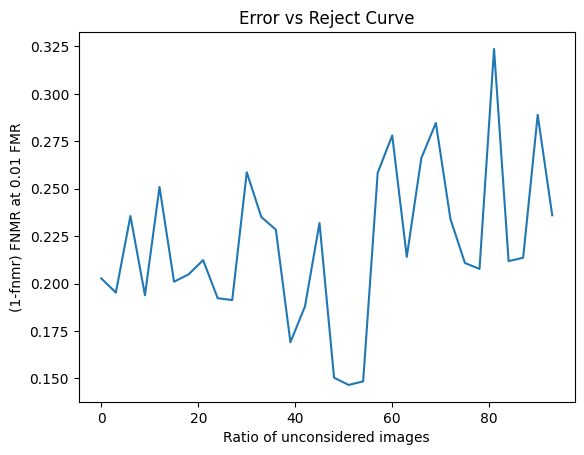

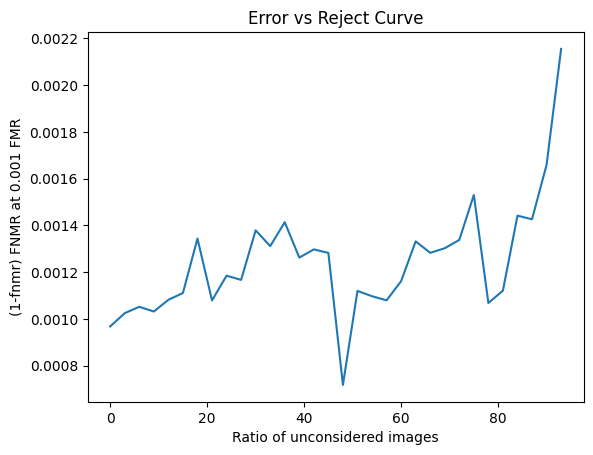

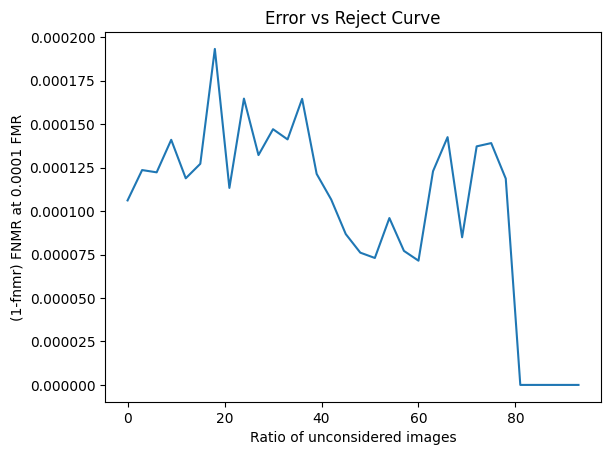

In [ ]:
import numpy as np
from numpy import random
from itertools import combinations
from sklearn.metrics import roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import pickle


# Update the file path
file_path = '/content/drive/MyDrive/thesis_directory/a1_.pkl'


# Load the dictionary from the pickled file
with open(file_path, 'rb') as file:
    embeddings_dict = pickle.load(file)

# Initialize lists for embeddings, identities, and quality scores
count = 0
emb = []
identity = []
quality = []

for id, data_list in embeddings_dict.items():
    for embedding, quality_score in data_list:
        emb.append(embedding)
        identity.append(id)
        quality.append(quality_score)
        count = count + 1
print(count)


#import the data
emb = np.array(emb)
identity = np.array(identity)
quality = np.array(quality)


#create functions to compute the performance (create pairs, define similarity function..)

def createGenuineIDs(identities):
    """Create genuine ID_sets
    """
    genuine_ID_sets = []
    for i in set(identities):
        idx = np.argwhere(identities==i)
        genuine_ID_sets.append(idx)
    return genuine_ID_sets
    #in each list we have all positions referring to the same identity

def createImposterIDs(identities, num_imposter=10):
    np.random.seed(1)
    imposter_ID_sets = []
    for i in set(identities):
        idx = np.argwhere(identities!=i)
        np.random.shuffle(idx)
        idx_reduced = idx[:num_imposter]
        imposter_ID_sets.append(idx_reduced)
    return imposter_ID_sets
    #in each list we have 10 positions referring to different identities

def cos_sim(a,b):
    """ Cosine similarity between vector a and b
    """
    a, b = a.reshape(-1), b.reshape(-1)
    return np.dot(a,b) / (np.linalg.norm(a) * np.linalg.norm(b))

def computeScores(ID_sets, X, sim_fct):
    scores = []
    for i in range(len(ID_sets)):
        combs = combinations(ID_sets[i], 2)
        for comb in combs:
            x_probe, x_ref = X[comb[0],:], X[comb[1],:]
            score = sim_fct(x_probe, x_ref)
            scores.append(score)
    return np.array(scores)

def computefnmr(FMR_threshold, FMR, FNMR):
    values = np.abs(FMR-FMR_threshold)
    idx = np.argmin(values)
    print("1-FNMR[idx]", 1-FNMR[idx])
    print("FNMR[idx]", FNMR[idx])
    return 1-FNMR[idx]

#get the fnmr at fmr of 0.01
def performance(identity, emb):

    gen_pairs = createGenuineIDs(identity)
    imp_pairs =  createImposterIDs(identity)
    genuine_scores = computeScores(gen_pairs, emb, cos_sim)
    imposter_scores = computeScores(imp_pairs, emb, cos_sim)

    gen_id = np.ones(len(genuine_scores))
    imp_id = np.zeros(len(imposter_scores))
    # merged
    scores = np.hstack([genuine_scores, imposter_scores])
    labels = np.hstack([gen_id, imp_id])

    fmr, tmr, thresholds = roc_curve(labels, scores)
    fnmr01 = computefnmr(0.01, fmr, 1-tmr)
    fnmr001 = computefnmr(0.001, fmr, 1-tmr)
    fnmr0001 = computefnmr(0.0001, fmr, 1-tmr)
    print("fnmr01, fnmr001, fnmr0001", fnmr01, fnmr001, fnmr0001)
    #fnmr at fmr of 0.01
    return fnmr01, fnmr001, fnmr0001

#function to remove a given percentage of highest quality images
def reduce_data(emb, identity, quality, percentage):
    ascending_quality = np.argsort(quality)
    # get the number of images to remove
    to_remove = round(len(emb) * (percentage / 100))
    idx_to_remove = ascending_quality[:to_remove]
    idx_to_retain = ascending_quality[to_remove:]
    new_data = [emb[i] for i in range(len(emb)) if i in idx_to_retain]
    new_id = [identity[i] for i in range(len(identity)) if i in idx_to_retain]
    return np.array(new_data), np.array(new_id)

#for increasing percentage of unconsidered images, compue the fnmr
sequence = list(range(0, 96, 3))
fnmr01s = []
fnmr001s = []
fnmr0001s = []
for i in sequence:
    red_data, red_identity = reduce_data(emb, identity, quality, i)
    fnmr01, fnmr001, fnmr0001 = performance(red_identity, red_data)
    fnmr01s.append(fnmr01)
    fnmr001s.append(fnmr001)
    fnmr0001s.append(fnmr0001)



plt.plot(sequence, fnmr01s, label='FNMR at 0.01 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('(1-fnmr) FNMR at 0.01 FMR')
plt.show()

plt.plot(sequence, fnmr001s, label='FNMR at 0.001 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('(1-fnmr) FNMR at 0.001 FMR')
plt.show()

plt.plot(sequence, fnmr0001s, label='FNMR at 0.0001 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('(1-fnmr) FNMR at 0.0001 FMR')
plt.show()


10000
1-FNMR[idx] 0.2051552113422218
FNMR[idx] 0.7948447886577782
1-FNMR[idx] 0.0010532423466491636
FNMR[idx] 0.9989467576533508
1-FNMR[idx] 0.00018289837157381417
FNMR[idx] 0.9998171016284262
fnmr01, fnmr001, fnmr0001 0.2051552113422218 0.0010532423466491636 0.00018289837157381417
1-FNMR[idx] 0.18656020737383083
FNMR[idx] 0.8134397926261692
1-FNMR[idx] 0.0011332092694439355
FNMR[idx] 0.9988667907305561
1-FNMR[idx] 0.00014901528619604143
FNMR[idx] 0.999850984713804
fnmr01, fnmr001, fnmr0001 0.18656020737383083 0.0011332092694439355 0.00014901528619604143
1-FNMR[idx] 0.20413575532417094
FNMR[idx] 0.7958642446758291
1-FNMR[idx] 0.001235814044527661
FNMR[idx] 0.9987641859554723
1-FNMR[idx] 0.0001573552044273896
FNMR[idx] 0.9998426447955726
fnmr01, fnmr001, fnmr0001 0.20413575532417094 0.001235814044527661 0.0001573552044273896
1-FNMR[idx] 0.16756499682942294
FNMR[idx] 0.8324350031705771
1-FNMR[idx] 0.0011739704193730605
FNMR[idx] 0.9988260295806269
1-FNMR[idx] 0.00013282147080495577
FNMR[

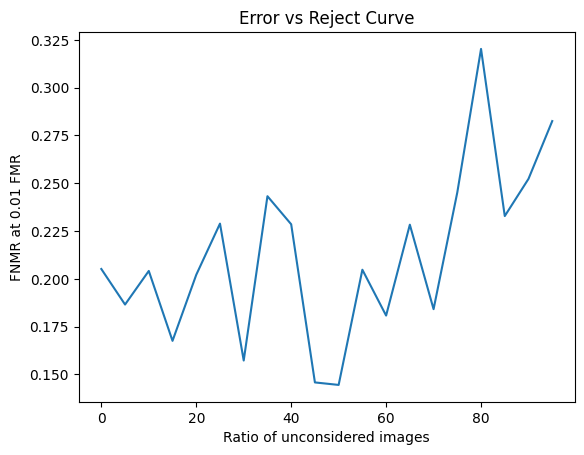

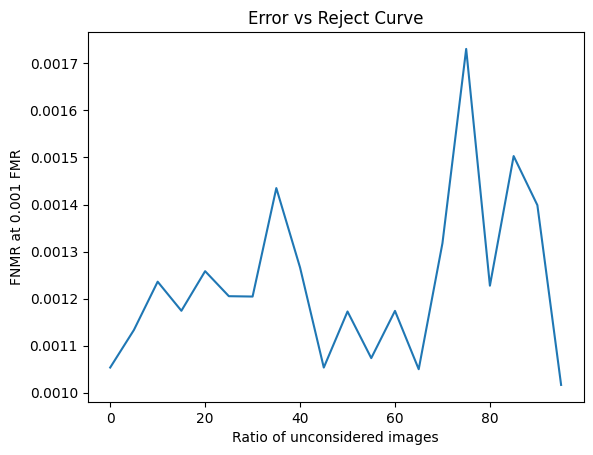

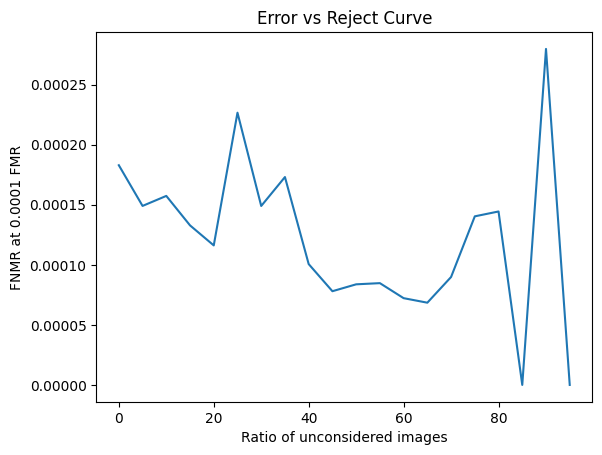

In [ ]:
import numpy as np
from numpy import random
from itertools import combinations
from sklearn.metrics import roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import pickle


# Update the file path
file_path = '/content/drive/MyDrive/Final_thesis/a1_.pkl'


# Load the dictionary from the pickled file
with open(file_path, 'rb') as file:
    embeddings_dict = pickle.load(file)

# Initialize lists for embeddings, identities, and quality scores
count = 0
emb = []
identity = []
quality = []

for id, data_list in embeddings_dict.items():
    for embedding, quality_score in data_list:
        emb.append(embedding)
        identity.append(id)
        quality.append(quality_score)
        count = count + 1
print(count)


#import the data
emb = np.array(emb)
identity = np.array(identity)
quality = np.array(quality)


#create functions to compute the performance (create pairs, define similarity function..)

def createGenuineIDs(identities):
    """Create genuine ID_sets
    """
    genuine_ID_sets = []
    for i in set(identities):
        idx = np.argwhere(identities==i)
        genuine_ID_sets.append(idx)
    return genuine_ID_sets
    #in each list we have all positions referring to the same identity

def createImposterIDs(identities, num_imposter=10):
    np.random.seed(1)
    imposter_ID_sets = []
    for i in set(identities):
        idx = np.argwhere(identities!=i)
        np.random.shuffle(idx)
        idx_reduced = idx[:num_imposter]
        imposter_ID_sets.append(idx_reduced)
    return imposter_ID_sets
    #in each list we have 10 positions referring to different identities

def cos_sim(a,b):
    """ Cosine similarity between vector a and b
    """
    a, b = a.reshape(-1), b.reshape(-1)
    return np.dot(a,b) / (np.linalg.norm(a) * np.linalg.norm(b))

def computeScores(ID_sets, X, sim_fct):
    scores = []
    for i in range(len(ID_sets)):
        combs = combinations(ID_sets[i], 2)
        for comb in combs:
            x_probe, x_ref = X[comb[0],:], X[comb[1],:]
            score = sim_fct(x_probe, x_ref)
            scores.append(score)
    return np.array(scores)

def computefnmr(FMR_threshold, FMR, FNMR):
    values = np.abs(FMR-FMR_threshold)
    idx = np.argmin(values)
    print("1-FNMR[idx]", 1-FNMR[idx])
    print("FNMR[idx]", FNMR[idx])
    return 1-FNMR[idx]

#get the fnmr at fmr of 0.01
def performance(identity, emb):

    gen_pairs = createGenuineIDs(identity)
    imp_pairs =  createImposterIDs(identity)
    genuine_scores = computeScores(gen_pairs, emb, cos_sim)
    imposter_scores = computeScores(imp_pairs, emb, cos_sim)

    gen_id = np.ones(len(genuine_scores))
    imp_id = np.zeros(len(imposter_scores))
    # merged
    scores = np.hstack([genuine_scores, imposter_scores])
    labels = np.hstack([gen_id, imp_id])

    fmr, tmr, thresholds = roc_curve(labels, scores)
    fnmr01 = computefnmr(0.01, fmr, 1-tmr)
    fnmr001 = computefnmr(0.001, fmr, 1-tmr)
    fnmr0001 = computefnmr(0.0001, fmr, 1-tmr)
    print("fnmr01, fnmr001, fnmr0001", fnmr01, fnmr001, fnmr0001)
    #fnmr at fmr of 0.01
    return fnmr01, fnmr001, fnmr0001

#function to remove a given percentage of highest quality images
def reduce_data(emb, identity, quality, percentage):
    ascending_quality = np.argsort(quality)
    # get the number of images to remove
    to_remove = round(len(emb) * (percentage / 100))
    idx_to_remove = ascending_quality[:to_remove]
    idx_to_retain = ascending_quality[to_remove:]
    new_data = [emb[i] for i in range(len(emb)) if i in idx_to_retain]
    new_id = [identity[i] for i in range(len(identity)) if i in idx_to_retain]
    return np.array(new_data), np.array(new_id)

#for increasing percentage of unconsidered images, compue the fnmr
sequence = list(range(0, 96, 5))
fnmr01s = []
fnmr001s = []
fnmr0001s = []
for i in sequence:
    red_data, red_identity = reduce_data(emb, identity, quality, i)
    fnmr01, fnmr001, fnmr0001 = performance(red_identity, red_data)
    fnmr01s.append(fnmr01)
    fnmr001s.append(fnmr001)
    fnmr0001s.append(fnmr0001)



plt.plot(sequence, fnmr01s, label='FNMR at 0.01 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('FNMR at 0.01 FMR')
plt.show()

plt.plot(sequence, fnmr001s, label='FNMR at 0.001 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('FNMR at 0.001 FMR')
plt.show()

plt.plot(sequence, fnmr0001s, label='FNMR at 0.0001 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('FNMR at 0.0001 FMR')
plt.show()


In [ ]:
# Initialize lists for embeddings, identities, and quality scores
emb = []
identity = []
quality = []
count = 0
for id, data_list in embeddings_dict.items():
    for embedding, quality_score in data_list:
        emb.append(embedding)
        identity.append(id)
        quality.append(quality_score)
        count = count + 1
print(count)
all_data = [(identity, embedding, quality) for identity, data_list in embeddings_dict.items() for embedding, quality in data_list]
# Get the indices that would sort the quality array in ascending order


# Initialize lists to collect metrics
fnmr_values_list = []
eer_list = []
one_minus_fnmr_values_list = []
one_minus_eer_list = []
ascending_quality_indices = np.argsort([x[2] for x in all_data])
unconsidered_rates = np.arange(0, 0.99, 0.06)
for u_rate in unconsidered_rates:
    hq_pairs_idx = ascending_quality_indices[int(u_rate * len(all_data)):]
    # Prepare new all_data with hq_pairs_idx
    new_all_data = [all_data[i] for i in hq_pairs_idx]
    # Print only the quality scores
    quality_scores = [entry[2] for entry in new_all_data]
    print("Quality Scores:", quality_scores)
    # Prepare new embeddings_dict with hq_pairs_idx
    new_embeddings_dict = {}
    new_embeddings_dict = {identity: [(embedding, quality) for _, embedding, quality in new_all_data if _ == identity] for identity, _, _ in new_all_data}

    genuine_scores = calculate_genuine_scores(new_embeddings_dict)
    impostor_scores = calculate_impostor_scores(new_embeddings_dict)
    # Create labels for genuine and impostor scores
    genuine_labels = np.ones(len(genuine_scores))
    impostor_labels = np.zeros(len(impostor_scores))

    y_true = np.concatenate((genuine_labels, impostor_labels))
    y_scores = np.concatenate((genuine_scores, impostor_scores))
    # ROC data
    fmr_threshold = 0.01
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    fnmr_value, eer = compute_fnmr(fmr_threshold, fpr, tpr, thresholds)
    print("fnmr_value, eer", fnmr_value, eer)
    print("1-fnmr_value, 1-eer", 1-fnmr_value, 1-eer)
    # Collect metrics in lists
    fnmr_values_list.append(fnmr_value)
    eer_list.append(eer)
    one_minus_fnmr_values_list.append(1 - fnmr_value)
    one_minus_eer_list.append(1 - eer)
# Plot the curves against unconsidered_rates
plt.plot(unconsidered_rates, fnmr_values_list, label='FNMR')
# Plot the curves against unconsidered_rates
plt.plot(unconsidered_rates, fnmr_values_list, label='FNMR')




1000
Quality Scores: [-0.42968080013795207, -0.32819212938537196, -0.2508845824237087, -0.22065722523897427, -0.21082207094847824, -0.20056891120042417, -0.18293315157173454, -0.17939962694597983, -0.159934075269045, -0.1591974028037365, -0.15355400860785626, -0.13955592067248498, -0.10515622438951612, -0.08890391318436155, -0.08767883720294163, -0.08580219094431552, -0.07237458658571909, -0.06492625743941118, -0.0484348245765548, -0.04764196529385262, -0.04396021130057175, -0.03661498213221249, -0.03410852459103817, -0.03370321405081225, -0.033386690614651014, -0.028830795175244006, -0.026449188076467768, -0.018629160644785737, -0.008129762904327084, -0.007019575901568172, -0.006240548064920767, -0.005865863573946388, 0.004531830455263233, 0.008675802391810929, 0.00901660935165225, 0.012068172758490049, 0.013303589666304112, 0.013660503246194377, 0.016175098936302253, 0.01729864376366289, 0.021862031701807297, 0.025741742910903923, 0.02690460089241238, 0.028023999708442847, 0.03034987

Calculating Impostor Scores: 100%|██████████| 375/375 [04:14<00:00,  1.47it/s]


FMR Threshold: 0.0106951871657754
Nearest FNMR Value: 0.01379310344827589
Equal Error Rate (EER): 0.01379310344827589
fnmr_value, eer 0.01379310344827589 0.01379310344827589
1-fnmr_value, 1-eer 0.9862068965517241 0.9862068965517241
Quality Scores: [0.08091582931251096, 0.08272822407605457, 0.09147517213685141, 0.09208939120998255, 0.09258713072163638, 0.0937468981994207, 0.09821334911134978, 0.10180398592012435, 0.10236958328982801, 0.10283708289524635, 0.10402281035740829, 0.10547963701806758, 0.1092150157702199, 0.11128584399979648, 0.11178238678404735, 0.11363157687644451, 0.1158421902574267, 0.11787456243908936, 0.1188870918644515, 0.12179633856862347, 0.1268062846365665, 0.1277968457951501, 0.1319820501872311, 0.13349137736570313, 0.13534736688777085, 0.1367491256192299, 0.13976226579245357, 0.14294117253488497, 0.14513548799935838, 0.1460296757245137, 0.14623339048148962, 0.14638051219443893, 0.14724956561249317, 0.14742154615127734, 0.15018591176340418, 0.15097735364574205, 0.15

Calculating Impostor Scores: 100%|██████████| 363/363 [03:43<00:00,  1.62it/s]


FMR Threshold: 0.010790983668934448
Nearest FNMR Value: 0.007194244604316502
Equal Error Rate (EER): 0.007194244604316502
fnmr_value, eer 0.007194244604316502 0.007194244604316502
1-fnmr_value, 1-eer 0.9928057553956835 0.9928057553956835
Quality Scores: [0.17749192785241283, 0.17868647583508004, 0.1790838194399801, 0.17930828727099196, 0.18022396522562908, 0.18065478837870835, 0.1812919484615329, 0.18280136312556214, 0.18376093786959355, 0.1840590676846108, 0.18451853906930635, 0.18502276409724486, 0.1855986075563093, 0.18638714883394197, 0.18699858636890054, 0.18836438925233273, 0.18885011854063025, 0.19138278101056153, 0.1914386917173688, 0.19352904220263004, 0.19383968149981057, 0.1981630445652149, 0.19853569320038944, 0.2007550098660062, 0.20196100188014127, 0.20211032348690192, 0.20371672317497638, 0.20579415120635947, 0.20603675456791504, 0.20791011883463253, 0.20898641229941806, 0.20904644141555895, 0.2097844727653241, 0.2100378485241448, 0.21071340528812924, 0.21080228219305225

Calculating Impostor Scores: 100%|██████████| 351/351 [03:19<00:00,  1.76it/s]


FMR Threshold: 0.011558811558811558
Nearest FNMR Value: 0.007751937984496138
Equal Error Rate (EER): 0.007751937984496138
fnmr_value, eer 0.007751937984496138 0.007751937984496138
1-fnmr_value, 1-eer 0.9922480620155039 0.9922480620155039
Quality Scores: [0.23235185436813718, 0.23276830768789813, 0.23302827968920617, 0.2342726773602391, 0.23512246601417675, 0.23681674685869802, 0.2386087385980926, 0.2388285218698578, 0.23993591858721203, 0.24077271216218424, 0.2414226132795535, 0.24222595699901908, 0.24298075919947548, 0.2460259804695747, 0.2467072563769801, 0.2471978235658114, 0.2477999369126281, 0.2480166583879296, 0.24952656111788524, 0.25121469246357764, 0.25136332647927057, 0.2524144080845039, 0.2527923252360108, 0.2529605102293904, 0.2532881063068165, 0.253401661514727, 0.25355451499196285, 0.25444740226120477, 0.2547005751094157, 0.2559616342936054, 0.25745082985106615, 0.25790414259373523, 0.25890414157816455, 0.25939852094483423, 0.25975997659104066, 0.26133572354650886, 0.2616

Calculating Impostor Scores: 100%|██████████| 338/338 [02:52<00:00,  1.96it/s]


FMR Threshold: 0.0074974101452074515
Nearest FNMR Value: 0.016528925619834656
Equal Error Rate (EER): 0.008264462809917328
fnmr_value, eer 0.016528925619834656 0.008264462809917328
1-fnmr_value, 1-eer 0.9834710743801653 0.9917355371900827
Quality Scores: [0.2787791451311851, 0.28180496926237664, 0.28323216193598677, 0.2832622871296012, 0.28377003940805373, 0.28380230717442634, 0.2838517833419743, 0.28437012927545835, 0.286474301352205, 0.2866225140404727, 0.2867986354830193, 0.2877712976481514, 0.2890352076752642, 0.28924327260766935, 0.29160325938114134, 0.2926268970070163, 0.2930143575577115, 0.29325621062864865, 0.29359860192109843, 0.29425752163385915, 0.29465746198539344, 0.29477935117681614, 0.29490764661752406, 0.2983105112578903, 0.2985239066596206, 0.2991511391295539, 0.2991596713594983, 0.29927058657088784, 0.29967792642417734, 0.2998229250629282, 0.30098461166230783, 0.302562834804284, 0.3027842246752164, 0.3035290779796272, 0.30487325278548455, 0.3051198538359296, 0.3057298

Calculating Impostor Scores: 100%|██████████| 319/319 [02:28<00:00,  2.14it/s]


FMR Threshold: 0.008576329331046312
Nearest FNMR Value: 0.017857142857142905
Equal Error Rate (EER): 0.008928571428571397
fnmr_value, eer 0.017857142857142905 0.008928571428571397
1-fnmr_value, 1-eer 0.9821428571428571 0.9910714285714286
Quality Scores: [0.31780688228972853, 0.3178406345196983, 0.3180220406695587, 0.31861884946405056, 0.3193144955434224, 0.32005197262524565, 0.3217384616885806, 0.32235071371333357, 0.3234483872519475, 0.32361234192152566, 0.32442135530512056, 0.32450748545073954, 0.32548819506257276, 0.3259646777657573, 0.32695495995794976, 0.3277517627585551, 0.3284119597119077, 0.3286110113746701, 0.32883517565572407, 0.33051850610156774, 0.3305394314216668, 0.3307110082525695, 0.3307444844146211, 0.3308679214275272, 0.330962061600471, 0.33109803160869755, 0.33218117486576837, 0.33224179138177057, 0.33325936922289673, 0.3345288143207361, 0.3352716115101891, 0.3369769821300144, 0.3370228209614026, 0.33802883594555144, 0.33853679147989385, 0.340662479710679, 0.34124432

Calculating Impostor Scores: 100%|██████████| 305/305 [02:06<00:00,  2.41it/s]


FMR Threshold: 0.010677308024158758
Nearest FNMR Value: 0.01941747572815533
Equal Error Rate (EER): 0.009708737864077666
fnmr_value, eer 0.01941747572815533 0.009708737864077666
1-fnmr_value, 1-eer 0.9805825242718447 0.9902912621359223
Quality Scores: [0.3527579991604395, 0.3533988056502137, 0.3536851159328604, 0.3538519314712445, 0.35503965561520745, 0.35601254215037975, 0.35719635735871, 0.3575209063220316, 0.3576297568126291, 0.3589742702734683, 0.3597311306489374, 0.36066995403804014, 0.3608523137193335, 0.36195823846930836, 0.36202988750256987, 0.3623266786029475, 0.36273184623375004, 0.36314916387840634, 0.3632248399378342, 0.3637789856663325, 0.36395888032647405, 0.3643226841480266, 0.3651276050988842, 0.36526647625148045, 0.36537674595526026, 0.3655931746986095, 0.3656176738442126, 0.36650954294361254, 0.36654626609974456, 0.3668298161432692, 0.3677677493183094, 0.3681366227103819, 0.368150886455147, 0.3683994582981177, 0.3689636639912806, 0.36913063861979195, 0.370504315524700

Calculating Impostor Scores: 100%|██████████| 288/288 [01:46<00:00,  2.69it/s]


FMR Threshold: 0.01004161827332559
Nearest FNMR Value: 0.03125
Equal Error Rate (EER): 0.01041666666666663
fnmr_value, eer 0.03125 0.01041666666666663
1-fnmr_value, 1-eer 0.96875 0.9895833333333334
Quality Scores: [0.38254387729957884, 0.38258618862011484, 0.3829024704974163, 0.3834059378753059, 0.3835931756018541, 0.384138620933505, 0.38446255391937634, 0.3845188814208301, 0.3846214713382088, 0.38497343072191953, 0.3855665061918829, 0.3864365024685054, 0.38659918155809375, 0.3869304980584529, 0.3870509545486559, 0.38705296205631456, 0.3870810668174598, 0.3885055317243652, 0.3885516485210849, 0.38945558512518, 0.3905610382227549, 0.39062108822826774, 0.3910833731293241, 0.39137946244261407, 0.39148347652844256, 0.3915334800983157, 0.39163748086194694, 0.3922453051710816, 0.3923312554679269, 0.39269297867309616, 0.39300265478536556, 0.3932802961341157, 0.3944600503663501, 0.3961248836071013, 0.39623844559587373, 0.39695542689403407, 0.3974391427694981, 0.3982647818873586, 0.399020279162

Calculating Impostor Scores: 100%|██████████| 267/267 [01:27<00:00,  3.06it/s]


FMR Threshold: 0.009011292275632903
Nearest FNMR Value: 0.046511627906976716
Equal Error Rate (EER): 0.011627906976744207
fnmr_value, eer 0.046511627906976716 0.011627906976744207
1-fnmr_value, 1-eer 0.9534883720930233 0.9883720930232558
Quality Scores: [0.40747201516238507, 0.4076535133122435, 0.40814853961333314, 0.4082274082473052, 0.4088128355837708, 0.4092837163931681, 0.4100595500742246, 0.41167840633260766, 0.4123425793482634, 0.41320266376703335, 0.4142189809936369, 0.41456015995311246, 0.4154204817837619, 0.4161665943611153, 0.4169043746352441, 0.4175556344537107, 0.4177824085602048, 0.41862457852599877, 0.4189585303777941, 0.4196066115192503, 0.4196436887834997, 0.4208353384980396, 0.42143943709539916, 0.4217764157670503, 0.42244421720943254, 0.42268553587004265, 0.42284897892520373, 0.42379217992421636, 0.4241750567305922, 0.4247753326078384, 0.4257207107182085, 0.4264422799133728, 0.4266982022763039, 0.42751208795142387, 0.4284376022855181, 0.4291147628932896, 0.42998861951

Calculating Impostor Scores: 100%|██████████| 247/247 [01:14<00:00,  3.30it/s]


FMR Threshold: 0.009677100819591191
Nearest FNMR Value: 0.038461538461538436
Equal Error Rate (EER): 0.012820512820512775
fnmr_value, eer 0.038461538461538436 0.012820512820512775
1-fnmr_value, 1-eer 0.9615384615384616 0.9871794871794872
Quality Scores: [0.4409816985816403, 0.441132722656502, 0.4430481746181071, 0.4430920551343825, 0.4433839067106713, 0.44379388017749805, 0.4438491659725029, 0.44515606237789307, 0.44560716917646476, 0.44589447566074775, 0.44628059013030313, 0.4470219612957167, 0.44766782823461015, 0.44768681787707154, 0.44773239151607486, 0.4477969505390503, 0.44800389045681394, 0.44817662327414654, 0.4494398699529392, 0.45016558989054556, 0.4505159392363489, 0.45109705035425735, 0.45172698153340607, 0.45207109458172945, 0.4528137328365882, 0.45286095506677726, 0.45292895100203656, 0.45351615994661904, 0.4536992352003271, 0.45405962134626465, 0.4547724462774407, 0.45499297478791517, 0.45547908825348865, 0.4561362655778791, 0.456732792200906, 0.4572932227538633, 0.45788

Calculating Impostor Scores: 100%|██████████| 226/226 [00:54<00:00,  4.17it/s]


FMR Threshold: 0.008928220255653884
Nearest FNMR Value: 0.04477611940298509
Equal Error Rate (EER): 0.014925373134328401
fnmr_value, eer 0.04477611940298509 0.014925373134328401
1-fnmr_value, 1-eer 0.9552238805970149 0.9850746268656716
Quality Scores: [0.47161391545522874, 0.47203772032748725, 0.4737087780800078, 0.4746187807093412, 0.4754098926035929, 0.47584848061745727, 0.47675997474189113, 0.47677285782070994, 0.4784056430328116, 0.4790189921256572, 0.4793144951632274, 0.4795071607988719, 0.480114238492973, 0.4810652718896719, 0.48144795734471163, 0.481601716464494, 0.4817243381470714, 0.4818817077506409, 0.4820299018500694, 0.48246884673766743, 0.48303731515552756, 0.4843154578246551, 0.484900943277895, 0.4849629339372767, 0.4857738692147714, 0.4866331679951155, 0.4868860593893826, 0.48724252695526304, 0.4878550839829769, 0.488158472392591, 0.4884127264076286, 0.4895105899876396, 0.4896139516079572, 0.491094076612803, 0.49144515585908893, 0.49208179045965894, 0.49294373025385413, 

Calculating Impostor Scores: 100%|██████████| 202/202 [00:42<00:00,  4.79it/s]


FMR Threshold: 0.007487315895768681
Nearest FNMR Value: 0.050000000000000044
Equal Error Rate (EER): 0.01666666666666672
fnmr_value, eer 0.050000000000000044 0.01666666666666672
1-fnmr_value, 1-eer 0.95 0.9833333333333333
Quality Scores: [0.5054206127944293, 0.5065723564294717, 0.5068085423015353, 0.5070411078981303, 0.5079210443831058, 0.5090868713111772, 0.5096178320398546, 0.5097982771287456, 0.509906170585879, 0.5104047642401858, 0.5104312763116718, 0.510475461106647, 0.5111714847355602, 0.5114821990074296, 0.5115563284864841, 0.5115898609410016, 0.511761030519162, 0.5120450539235515, 0.5120803291167397, 0.512679763298259, 0.5129194078322783, 0.5138895650626544, 0.5152626100459222, 0.5153381358019957, 0.5160666669546642, 0.5164105046761751, 0.5164718880849637, 0.5167997677490666, 0.5168383326198212, 0.5168768955519437, 0.5183740889072491, 0.5191434319065474, 0.5196797633053278, 0.5197635854723242, 0.5201493973196958, 0.520927406442449, 0.521225489384258, 0.5217673154437118, 0.52320

Calculating Impostor Scores: 100%|██████████| 181/181 [00:29<00:00,  6.10it/s]


FMR Threshold: 0.012093308778391652
Nearest FNMR Value: 0.038461538461538436
Equal Error Rate (EER): 0.019230769230769273
fnmr_value, eer 0.038461538461538436 0.019230769230769273
1-fnmr_value, 1-eer 0.9615384615384616 0.9807692307692307
Quality Scores: [0.5394214645519528, 0.5405816226593817, 0.540741143995809, 0.5408683957861046, 0.5413093575107101, 0.5413890403612153, 0.5418093451403229, 0.5420498904032099, 0.5436080459039312, 0.5438141863652753, 0.5443309592903587, 0.544663450226207, 0.5453313270119655, 0.5462949041774865, 0.5468216088390324, 0.548214678359173, 0.548261680956881, 0.5483103588280022, 0.5485704751491635, 0.5510408406114502, 0.5521833866535604, 0.5534639523860948, 0.5544144665027758, 0.5548185688126633, 0.5552689474992726, 0.555489871383305, 0.5555745672254738, 0.5556326856219054, 0.5564623972306314, 0.5579979555805313, 0.5582279009084097, 0.5583469779364186, 0.5585288598656212, 0.5595910431488982, 0.5610864299498751, 0.5617333204357191, 0.5631384718038731, 0.56420960

Calculating Impostor Scores: 100%|██████████| 157/157 [00:20<00:00,  7.49it/s]


FMR Threshold: 0.010044096031357178
Nearest FNMR Value: 0.04878048780487809
Equal Error Rate (EER): 0.024390243902439046
fnmr_value, eer 0.04878048780487809 0.024390243902439046
1-fnmr_value, 1-eer 0.9512195121951219 0.975609756097561
Quality Scores: [0.5830713962572529, 0.5833178642326411, 0.583934389893011, 0.584005853522085, 0.5840836598672619, 0.5856313483978494, 0.5869712537513239, 0.5880179919341104, 0.588656499012506, 0.5889605342036208, 0.5890597451680041, 0.591137775840681, 0.591148759591812, 0.5912507417868399, 0.5915659903815833, 0.5918089772125145, 0.5918387557855769, 0.5928456356735657, 0.5936867668133359, 0.5939866543969785, 0.594136540377103, 0.5945126468059097, 0.5945859670561031, 0.5957656181825669, 0.5959383906014872, 0.598113076560348, 0.5983254445144048, 0.5991369883083776, 0.5992205553589994, 0.5996799559377333, 0.599788178394729, 0.60015598130281, 0.6002301313032244, 0.6007072409975917, 0.6012995968954, 0.6015554762596795, 0.6015986252609631, 0.6019945180873497, 0

Calculating Impostor Scores: 100%|██████████| 133/133 [00:12<00:00, 10.98it/s]


FMR Threshold: 0.01013898382319435
Nearest FNMR Value: 0.03703703703703709
Equal Error Rate (EER): 0.0
fnmr_value, eer 0.03703703703703709 0.0
1-fnmr_value, 1-eer 0.9629629629629629 1.0
Quality Scores: [0.6157049669533099, 0.6159377463327381, 0.6160428394923845, 0.6161839322808157, 0.6191338470343586, 0.6198363626879587, 0.6198885294934111, 0.62293950142754, 0.6231217313493628, 0.6233823728337191, 0.6240008760754009, 0.6265970685298203, 0.6272352711149034, 0.6273498874610022, 0.6298913159598486, 0.6299351744804119, 0.6311004275540293, 0.631695165800448, 0.6322499170301018, 0.63276626426585, 0.6330264195503199, 0.6331629836957253, 0.6339743405265745, 0.6350391610134632, 0.6365852668955599, 0.6369876230656756, 0.6392744059137869, 0.6407086500635711, 0.6420188624608799, 0.6421515448937037, 0.6428671207453591, 0.6430408666206345, 0.6436527539022847, 0.6449011627657202, 0.6452712295609021, 0.6454356124103183, 0.6473784267224598, 0.6474249913310108, 0.6479157597419538, 0.6486791114306569, 0.

Calculating Impostor Scores: 100%|██████████| 104/104 [00:07<00:00, 13.09it/s]


FMR Threshold: 0.009522031366691561
Nearest FNMR Value: 0.052631578947368474
Equal Error Rate (EER): 0.0
fnmr_value, eer 0.052631578947368474 0.0
1-fnmr_value, 1-eer 0.9473684210526315 1.0
Quality Scores: [0.658317672166941, 0.6599413641554278, 0.6611553390321694, 0.6629081243859577, 0.6629354149326997, 0.6636266764472136, 0.6641263923152053, 0.6643916818551411, 0.6654295550499609, 0.665478400428667, 0.6661874099881715, 0.6662009555434112, 0.6680730174273926, 0.6689730964006787, 0.6707100758367596, 0.6729006071183609, 0.6729179480117006, 0.675310942456593, 0.6763205206883217, 0.6765824608558718, 0.6767543540477036, 0.6775890288827245, 0.6776180544325315, 0.6781085487850477, 0.6784773628566391, 0.6787748135172188, 0.6800412291432381, 0.6805079448450568, 0.680518426862296, 0.6805236677724219, 0.6826173754478926, 0.6833988276661814, 0.6845007657639892, 0.6849417539265877, 0.6888868164253833, 0.6889510031470627, 0.6904615722068813, 0.6915700595318748, 0.6927365201925584, 0.6936738287009474

Calculating Impostor Scores: 100%|██████████| 71/71 [00:02<00:00, 29.05it/s]


FMR Threshold: 0.0012072434607645875
Nearest FNMR Value: 0.07692307692307687
Equal Error Rate (EER): 0.0
fnmr_value, eer 0.07692307692307687 0.0
1-fnmr_value, 1-eer 0.9230769230769231 1.0
Quality Scores: [0.7442077488642942, 0.7453834174988376, 0.746827486085874, 0.7469823192324501, 0.7490249905058979, 0.7495313976789804, 0.7504598094109678, 0.7507259399241426, 0.7529087038685837, 0.7560456934556594, 0.7564581085170644, 0.7579086420316316, 0.7599761663050832, 0.7602371074393351, 0.760242323888407, 0.7623794508617321, 0.7628285703284613, 0.7660561865920349, 0.7678469376878715, 0.7743111422301702, 0.7750258099196135, 0.7771222088383837, 0.7808830681675697, 0.7826546120482524, 0.7911225761731283, 0.8027703791651347, 0.8075998877791893, 0.8095042728502199, 0.8143144252456158, 0.8153865882880911, 0.8157122634062058, 0.8170541144049497, 0.8195443328247645, 0.8210576523100016, 0.8246588630413136, 0.8486261565488479, 0.8606860848018785, 0.8667979851027549, 0.8704181999438506, 0.870667618523878

Calculating Impostor Scores: 100%|██████████| 31/31 [00:00<00:00, 77.15it/s]

FMR Threshold: 0.0
Nearest FNMR Value: 1.0
Equal Error Rate (EER): 0.0
fnmr_value, eer 1.0 0.0
1-fnmr_value, 1-eer 0.0 1.0


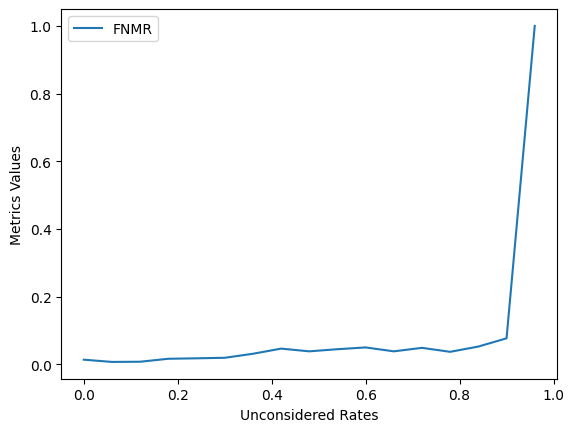

In [ ]:
# Plot the curves against unconsidered_rates
plt.plot(unconsidered_rates, fnmr_values_list, label='FNMR')




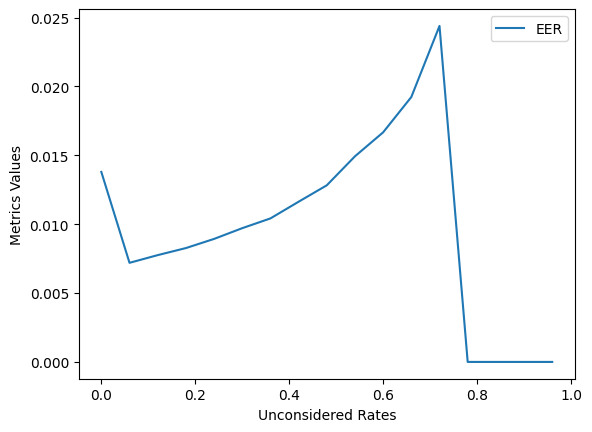

In [ ]:
plt.plot(unconsidered_rates, eer_list, label='EER')

plt.xlabel('Unconsidered Rates')
plt.ylabel('Metrics Values')
plt.legend()
plt.show()

9000
1-FNMR[idx] 0.16689429292460822
FNMR[idx] 0.8331057070753918
1-FNMR[idx] 0.0010810914545797967
FNMR[idx] 0.9989189085454202
1-FNMR[idx] 0.00011834433082680285
FNMR[idx] 0.9998816556691732
fnmr01, fnmr001, fnmr0001 0.16689429292460822 0.0010810914545797967 0.00011834433082680285
1-FNMR[idx] 0.16443411844514821
FNMR[idx] 0.8355658815548518
1-FNMR[idx] 0.001001746906008072
FNMR[idx] 0.9989982530939919
1-FNMR[idx] 0.00010193214131304362
FNMR[idx] 0.999898067858687
fnmr01, fnmr001, fnmr0001 0.16443411844514821 0.001001746906008072 0.00010193214131304362
1-FNMR[idx] 0.16811947410836292
FNMR[idx] 0.8318805258916371
1-FNMR[idx] 0.0011913150794794491
FNMR[idx] 0.9988086849205206
1-FNMR[idx] 0.00010900922295886684
FNMR[idx] 0.9998909907770411
fnmr01, fnmr001, fnmr0001 0.16811947410836292 0.0011913150794794491 0.00010900922295886684
1-FNMR[idx] 0.21285695657843262
FNMR[idx] 0.7871430434215674
1-FNMR[idx] 0.0011952883904898792
FNMR[idx] 0.9988047116095101
1-FNMR[idx] 0.0001564741165732686
FNM

ValueError: ignored

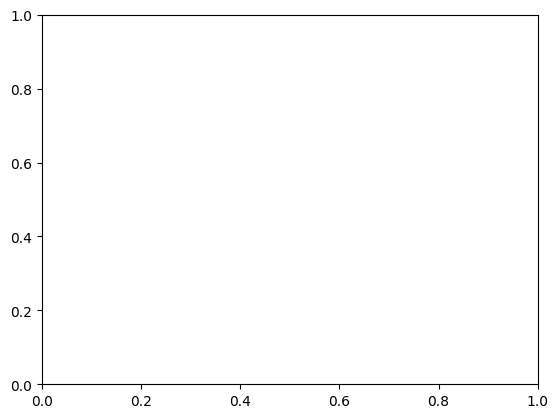

In [ ]:
import numpy as np
from numpy import random
from itertools import combinations
from sklearn.metrics import roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import pickle


# Update the file path
file_path = '/content/drive/MyDrive/thesis_directory/a1_.pkl'


# Load the dictionary from the pickled file
with open(file_path, 'rb') as file:
    embeddings_dict = pickle.load(file)

# Initialize lists for embeddings, identities, and quality scores
count = 0
emb = []
identity = []
quality = []

for id, data_list in embeddings_dict.items():
    for embedding, quality_score in data_list:
        emb.append(embedding)
        identity.append(id)
        quality.append(quality_score)
        count = count + 1
print(count)


#import the data
emb = np.array(emb)
identity = np.array(identity)
quality = np.array(quality)


#create functions to compute the performance (create pairs, define similarity function..)

def createGenuineIDs(identities):
    """Create genuine ID_sets
    """
    genuine_ID_sets = []
    for i in set(identities):
        idx = np.argwhere(identities==i)
        genuine_ID_sets.append(idx)
    return genuine_ID_sets
    #in each list we have all positions referring to the same identity

def createImposterIDs(identities, num_imposter=10):
    np.random.seed(1)
    imposter_ID_sets = []
    for i in set(identities):
        idx = np.argwhere(identities!=i)
        np.random.shuffle(idx)
        idx_reduced = idx[:num_imposter]
        imposter_ID_sets.append(idx_reduced)
    return imposter_ID_sets
    #in each list we have 10 positions referring to different identities

def cos_sim(a,b):
    """ Cosine similarity between vector a and b
    """
    a, b = a.reshape(-1), b.reshape(-1)
    return np.dot(a,b) / (np.linalg.norm(a) * np.linalg.norm(b))

def computeScores(ID_sets, X, sim_fct):
    scores = []
    for i in range(len(ID_sets)):
        combs = combinations(ID_sets[i], 2)
        for comb in combs:
            x_probe, x_ref = X[comb[0],:], X[comb[1],:]
            score = sim_fct(x_probe, x_ref)
            scores.append(score)
    return np.array(scores)

def computefnmr(FMR_threshold, FMR, FNMR):
    values = np.abs(FMR-FMR_threshold)
    idx = np.argmin(values)
    print("1-FNMR[idx]", 1-FNMR[idx])
    print("FNMR[idx]", FNMR[idx])
    return 1-FNMR[idx]

#get the fnmr at fmr of 0.01
def performance(identity, emb):

    gen_pairs = createGenuineIDs(identity)
    imp_pairs =  createImposterIDs(identity)
    genuine_scores = computeScores(gen_pairs, emb, cos_sim)
    imposter_scores = computeScores(imp_pairs, emb, cos_sim)

    gen_id = np.ones(len(genuine_scores))
    imp_id = np.zeros(len(imposter_scores))
    # merged
    scores = np.hstack([genuine_scores, imposter_scores])
    labels = np.hstack([gen_id, imp_id])

    fmr, tmr, thresholds = roc_curve(labels, scores)
    fnmr01 = computefnmr(0.01, fmr, 1-tmr)
    fnmr001 = computefnmr(0.001, fmr, 1-tmr)
    fnmr0001 = computefnmr(0.0001, fmr, 1-tmr)
    print("fnmr01, fnmr001, fnmr0001", fnmr01, fnmr001, fnmr0001)
    #fnmr at fmr of 0.01
    return fnmr01, fnmr001, fnmr0001

#function to remove a given percentage of highest quality images
def reduce_data(emb, identity, quality, percentage):
    ascending_quality = np.argsort(quality)
    # get the number of images to remove
    to_remove = round(len(emb) * (percentage / 100))
    idx_to_remove = ascending_quality[:to_remove]
    idx_to_retain = ascending_quality[to_remove:]
    new_data = [emb[i] for i in range(len(emb)) if i in idx_to_retain]
    new_id = [identity[i] for i in range(len(identity)) if i in idx_to_retain]
    return np.array(new_data), np.array(new_id)

#for increasing percentage of unconsidered images, compue the fnmr
sequence = list(range(0, 96, 5))
fnmr01s = []
fnmr001s = []
fnmr0001s = []
for i in sequence:
    red_data, red_identity = reduce_data(emb, identity, quality, i)
    fnmr01, fnmr001, fnmr0001 = performance(red_identity, red_data)
    fnmr01s.append(fnmr01)
    fnmr001s.append(fnmr001)
    fnmr0001s.append(fnmr0001)



plt.plot(sequence, fnmr01s, label='FNMR at 0.01 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('FNMR at 0.01 FMR')
plt.show()

plt.plot(sequence, fnmr001s, label='FNMR at 0.001 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('FNMR at 0.001 FMR')
plt.show()

plt.plot(sequence, fnmr0001s, label='FNMR at 0.0001 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('FNMR at 0.0001 FMR')
plt.show()


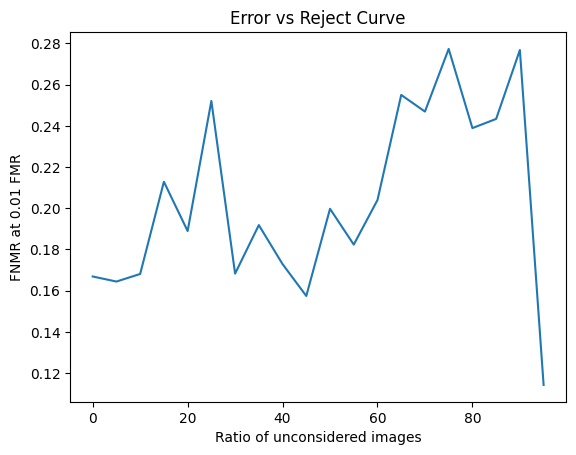

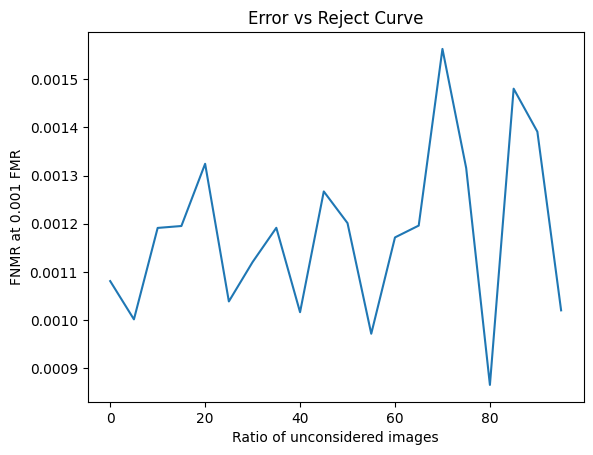

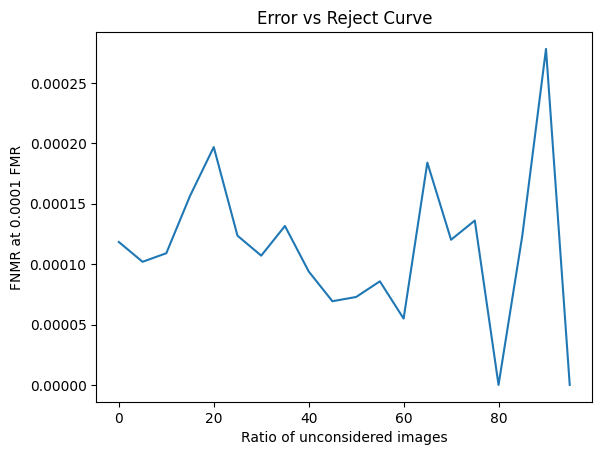

In [ ]:
plt.plot(sequence, fnmr01s, label='FNMR at 0.01 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('FNMR at 0.01 FMR')
plt.show()

plt.plot(sequence, fnmr001s, label='FNMR at 0.001 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('FNMR at 0.001 FMR')
plt.show()

plt.plot(sequence, fnmr0001s, label='FNMR at 0.0001 FMR')
plt.title('Error vs Reject Curve')
plt.xlabel('Ratio of unconsidered images')
plt.ylabel('FNMR at 0.0001 FMR')
plt.show()


In [ ]:
'/content/drive/MyDrive/thesis_directory/a1_.pkl'

In [ ]:
import pickle
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from tqdm import tqdm
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
# Load data from the pickle file (assuming you already have combined_dict)
#this is arcface model with dropout rate 0.4 applied normal face images of LFW dataset.

with open('/content/drive/MyDrive/thesis_directory/a1_.pkl', 'rb') as file:
    embeddings_dict = pickle.load(file)

# Initialize lists for embeddings, identities, and quality scores
emb = []
identity = []
quality = []
count = 0
for id, data_list in embeddings_dict.items():
    for embedding, quality_score in data_list:
        emb.append(embedding)
        identity.append(id)

        quality.append(quality_score)
        count = count + 1
print(count)

13000


In [ ]:
from PIL import Image
import os

folder_path = '/content/drive/MyDrive/thesis_directory/lfw/detected_faces'

def print_image_sizes(folder_path):
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        try:
            with Image.open(file_path) as img:
                width, height = img.size
                print(f"{filename}: {width}x{height}")
        except Exception as e:
            print(f"Error processing {filename}: {str(e)}")

print_image_sizes(folder_path)


Amanda_Bynes_0001_face_0.jpg: 93x133
Jason_White_0001_face_0.jpg: 96x138
Greg_Gilbert_0002_face_0.jpg: 91x130
Maureen_Fanning_0001_face_0.jpg: 89x112
Frank_Hsieh_0001_face_0.jpg: 107x151
Hun_Sen_0001_face_0.jpg: 92x120
John_Sununu_0001_face_1.jpg: 63x89
Daniel_Bruehl_0001_face_0.jpg: 86x112
Diego_Diego_Lerman_0001_face_0.jpg: 90x127
Alejandro_Atchugarry_0002_face_0.jpg: 83x105
David_Duke_0001_face_0.jpg: 81x112
Rick_Barnes_0003_face_0.jpg: 93x121
Kent_Rominger_0002_face_0.jpg: 89x126
Alberto_Ruiz_Gallardon_0001_face_0.jpg: 105x134
Omar_Vizquel_0001_face_0.jpg: 84x117
Andy_Hebb_0001_face_0.jpg: 102x128
Abid_Hamid_Mahmud_Al-Tikriti_0002_face_0.jpg: 111x123
Mehmet_Ali_Sahin_0001_face_0.jpg: 92x119
Ivan_Lee_0001_face_0.jpg: 108x155
Melinda_Czink_0001_face_0.jpg: 84x112
Jana_Henke_0001_face_0.jpg: 99x131
Lynne_Thigpen_0001_face_0.jpg: 105x137
Steven_Spielberg_0004_face_0.jpg: 85x119
Brad_Pitt_0001_face_0.jpg: 88x114
Jose_Carlo_Fernandez_0001_face_0.jpg: 99x142
Ronald_Harwood_0001_face_0.jpg

KeyboardInterrupt: 

In [ ]:
import numpy as np
from tqdm import tqdm

# Initialize lists to store genuine and impostor scores
genuine_scores = []
impostor_scores = []

# Calculate genuine and impostor scores
total_pairs = len(emb_objs) * (len(emb_objs) - 1)  # Total number of pairs to process

for i in tqdm(range(len(emb_objs)), desc="Calculating scores"):
    for j in range(len(emb_objs)):
        if i != j:
            identity_i, embedding_i = emb_objs[i]
            identity_j, embedding_j = emb_objs[j]

            # Calculate the similarity score between embeddings (e.g., cosine similarity)
            similarity_score = np.dot(embedding_i, embedding_j) / (np.linalg.norm(embedding_i) * np.linalg.norm(embedding_j))

            if identity_i == identity_j:
                genuine_scores.append(similarity_score)
            else:
                impostor_scores.append(similarity_score)

# Save the genuine and impostor scores to separate .npy files
np.save("/content/drive/MyDrive/thesis_directory/genuine_scores.npy", genuine_scores)
np.save("/content/drive/MyDrive/thesis_directory/impostor_scores.npy", impostor_scores)

# Print the lengths of genuine and impostor score lists
print("Number of genuine scores:", len(genuine_scores))
print("Number of impostor scores:", len(impostor_scores))